In [1]:
import pandas as pd
import numpy as np
import warnings
import os
from functools import reduce
warnings.filterwarnings(action='ignore')

import seaborn as sns
sns.set_palette("pastel")
import matplotlib.pylab as plt
from matplotlib import font_manager, rc
%matplotlib inline

sns.set(rc = {'figure.figsize':(15,7)})

import platform
your_os = platform.system()
if your_os == 'Linux':
    rc('font', family='NanumGothic')
elif your_os == 'Windows':
    ttf = "c:/Windows/Fonts/malgun.ttf"
    font_name = font_manager.FontProperties(fname=ttf).get_name()
    rc('font', family=font_name)
elif your_os == 'Darwin':
    rc('font', family='AppleGothic')
rc('axes', unicode_minus=False)

# 내국인 유동인구
<br>
기간 : 2018.1.1 ~ 6.30

- base_date	기준일자
- time	시간
- city	시 구분
- emd_cd	행정동 코드
- emd_nm	행정동명
- sex	성별
- age	연령대
- resd_pop_cnt	거주인구
- work_pop_cnt	근무인구
- visit_pop_cnt	방문인구
- resd	거주지역행정구역

* 거주인구 : 1~24시 해당 시간 정각 측정 인구(거주지에 머문 시간(분)/60분)
* 근무인구 : 1~24시 해당 시간 정각 측정 인구(근무지에 머문 시간(분)/60분)
* 방문인구 : 1~24시 해당 시간 정각 측정 인구(거주지/근무지 외 지역에 머문 시간(분)/60분)

# Data Read

In [57]:
#pd.read_csv('01_제공데이터/02-1_내국인유동인구_KOREAN.csv',low_memory=False)

local = pd.read_pickle('01_제공데이터/02-1_내국인유동인구_KOREAN.pickle')

In [58]:
#local['base_date'] = pd.to_datetime(local['base_date'])

In [59]:
def get_season(x):
    season = ''
    if (x == 1) or (x == 2) or (x == 12):
        season = 'winter'
    elif (x == 3) or (x == 4) or (x == 5):
        season = 'spring'
    elif (x == 6) or (x == 7) or (x == 8):
        season = 'summer'
    elif (x == 9) or (x == 10) or (x == 11):
        season = 'fall'
    else:
        season = ''
    return season

In [60]:
local['month'] = local['base_date'].dt.month
local['season'] = local['month'].apply(lambda x: get_season(x)).astype('category')

In [61]:
local['season'] = pd.Categorical(local['season'],['spring','summer','fall','winter'])

In [62]:
local.head()

,base_date,time,city,emd_cd,emd_nm,sex,age,resd_pop_cnt,work_pop_cnt,visit_pop_cnt,resd,month,season
0,2018-01-01,1,제주시,50110250,한림읍,여성,0,638.5509,15.5400,151.5149,제주,1,winter
1,2018-01-01,1,제주시,50110250,한림읍,여성,0,0.0000,3.7249,171.3458,그외,1,winter
2,2018-01-01,1,제주시,50110250,한림읍,여성,10,668.4577,17.0308,166.0500,제주,1,winter
3,2018-01-01,1,제주시,50110250,한림읍,여성,10,0.0000,4.2577,195.8539,그외,1,winter
4,2018-01-01,1,제주시,50110250,한림읍,여성,20,609.7710,5.9490,148.7246,제주,1,winter


In [7]:
local.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47250196 entries, 0 to 47250195
Data columns (total 13 columns):
 #   Column         Dtype         
---  ------         -----         
 0   base_date      datetime64[ns]
 1   time           int64         
 2   city           object        
 3   emd_cd         int64         
 4   emd_nm         object        
 5   sex            object        
 6   age            int64         
 7   resd_pop_cnt   float64       
 8   work_pop_cnt   float64       
 9   visit_pop_cnt  float64       
 10  resd           object        
 11  month          int64         
 12  season         category      
dtypes: category(1), datetime64[ns](1), float64(3), int64(4), object(4)
memory usage: 4.3+ GB


# Data preview(Total)

In [8]:
# na값 확인
local.isna().sum()

base_date        0
time             0
city             0
emd_cd           0
emd_nm           0
sex              0
age              0
resd_pop_cnt     0
work_pop_cnt     0
visit_pop_cnt    0
resd             0
month            0
season           0
dtype: int64

In [9]:
local['age'].unique()

array([ 0, 10, 20, 30, 40, 50, 60, 70, 80], dtype=int64)

In [10]:
local['city'].value_counts()

제주시     28570135
서귀포시    18680061
Name: city, dtype: int64

In [11]:
local['sex'].value_counts() # 남성이 미세하게 많음

남성    23654607
여성    23595589
Name: sex, dtype: int64

# EDA

## 전체기간(일단위) resd / work / visit population

In [12]:
local.groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index().set_index('base_date').corr()

,resd_pop_cnt,work_pop_cnt,visit_pop_cnt
resd_pop_cnt,1.000000,-0.337610,-0.426975
work_pop_cnt,-0.337610,1.000000,0.034206
visit_pop_cnt,-0.426975,0.034206,1.000000


### 전체 기간동안 거주지역에 따른 유형별 유동인구 추이
- 방문인구의 경우 그외 거주 유동인구의 영향이 크게 작용
- 거주인구 > 방문인구 > 근무인구 : 방문인구의 정의가 거주지 혹은 근무지 이외의 유동인구이므로 **방문인구의 유형화**가 필요할 것으로 보임(관광지, 상권지역 등) => 방문인구는 관광하는 유동인구를 포함한 것이 기정사실.
- 거주인구와 방문인구는 음의 상관관계
- 거주지역과 그외 지역의 구분이 명확 : 거주지역에는 방문인구가 잡히지만, 그외지역에는 거주인구가 아예 잡히지 않음. => 단순히 거주지역으로의 방문객?

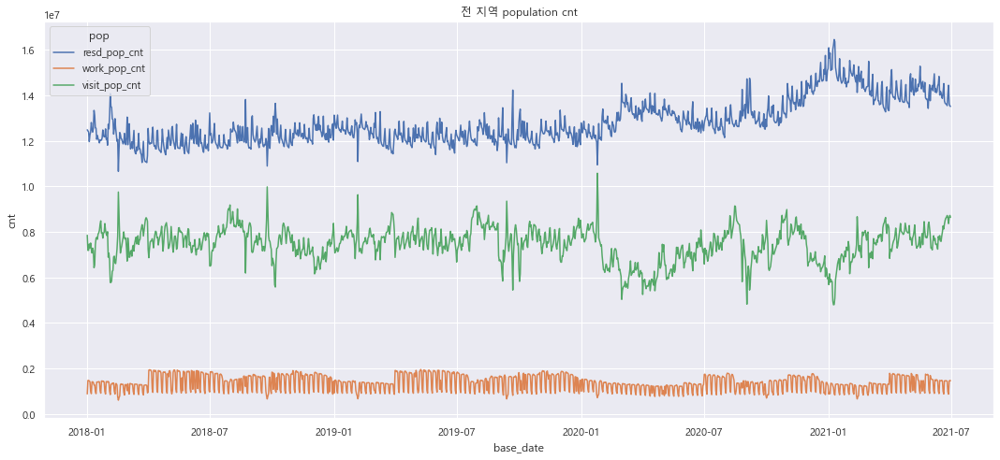

In [13]:
# 거주 지역 상관 없이
pop_cnt = local.groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
pop_cnt = pd.melt(pop_cnt, id_vars='base_date', var_name='pop', value_name='cnt')

sns.lineplot(data=pop_cnt,x='base_date',y='cnt',hue='pop')
plt.title('전 지역 population cnt')
plt.tight_layout()
plt.show()

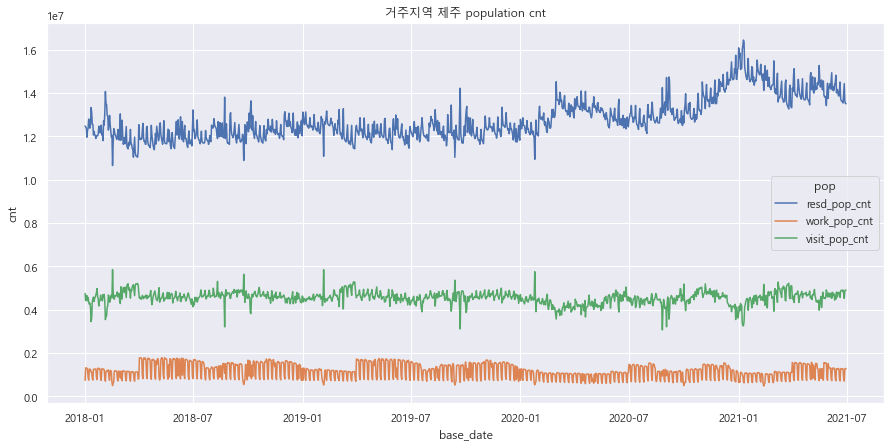

In [14]:
# 제주 거주
res_cnt = local[local['resd'] == '제주'].groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
res_cnt = pd.melt(res_cnt, id_vars='base_date', var_name='pop', value_name='cnt')
res_cnt['base_date'] = pd.to_datetime(res_cnt['base_date'])

sns.lineplot(data=res_cnt,x='base_date',y='cnt',hue='pop')
plt.title('거주지역 제주 population cnt')
plt.show()

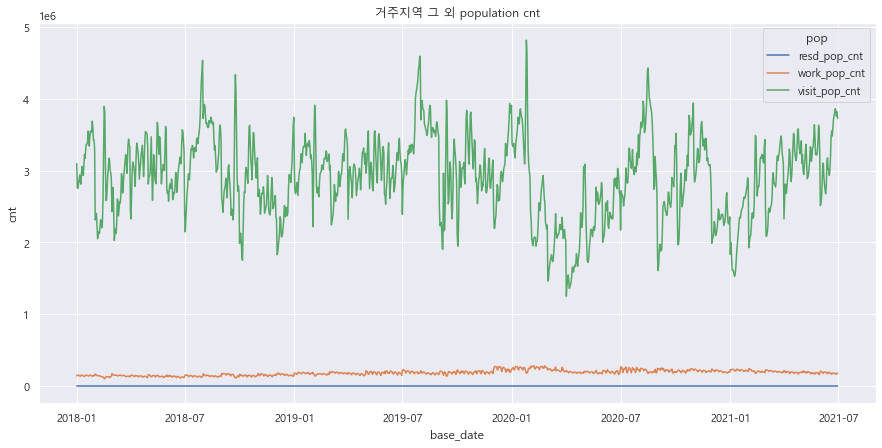

In [15]:
# 그 외 거주
etc_cnt = local[local['resd'] == '그외'].groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
etc_cnt = pd.melt(etc_cnt, id_vars='base_date', var_name='pop', value_name='cnt')
etc_cnt['base_date'] = pd.to_datetime(etc_cnt['base_date'])

sns.lineplot(data=etc_cnt,x='base_date',y='cnt',hue='pop')
plt.title('거주지역 그 외 population cnt')
plt.show()

### 전체 기간동안 인구통계 특성별 유동인구 추이
**연령별**
1. 연령대 0,10에서 근무인구가 관측되는 이유는?
2. (전 거주지 대상) 20대를 기점으로 연령대가 늘어날수록 거주인구와 방문인구의 격차가 늘어난다. => 0~10대는 인구종류 별 패턴이 비슷
3. 20대의 유동인구 : 거주인구와 방문인구 수치가 비슷 => 거주지를 분리해 확인해 본 결과, 거주지가 제주가 아닌 곳의 방문인구의 수치가 압도적으로 높음 => 여행객인가?
4. 거주지가 제주인 경우 구체적인 수치만 다를 뿐 방문, 거주, 근무인구의 패턴이 비슷함
<br><br>
**성별**
1. 여성이 남성보다 거주인구가 많고, 방문인구가 적음
2. 제주거주인 경우 남성이 여성보다 방문인구 많음
3. 그외 거주인 경우 남성과 여성의 방문인구의 수치와 패턴이 비슷

연령별

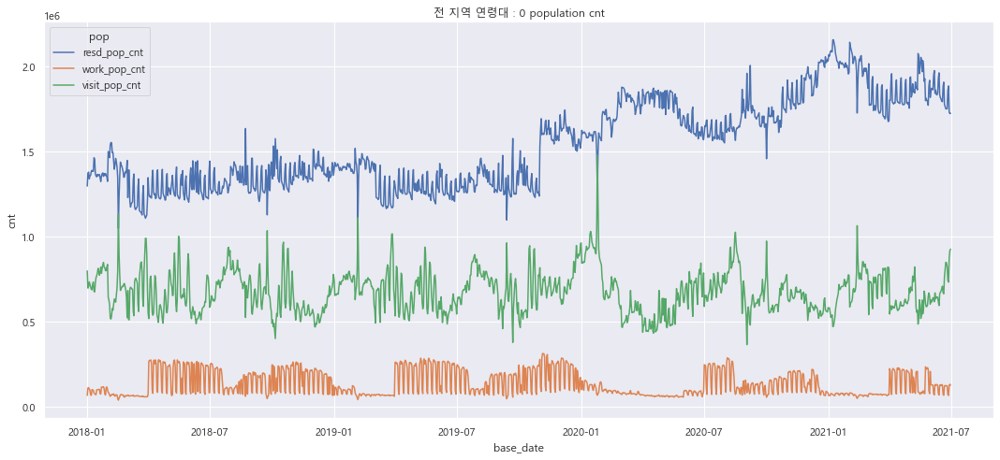

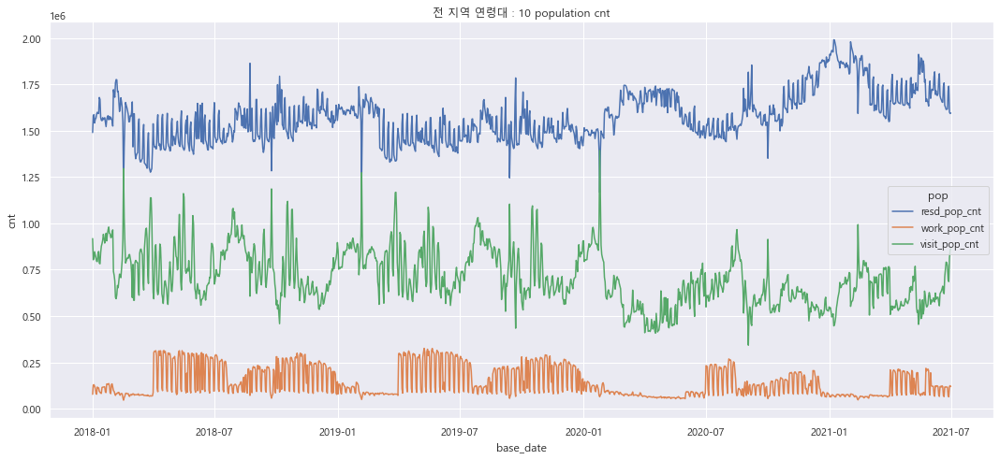

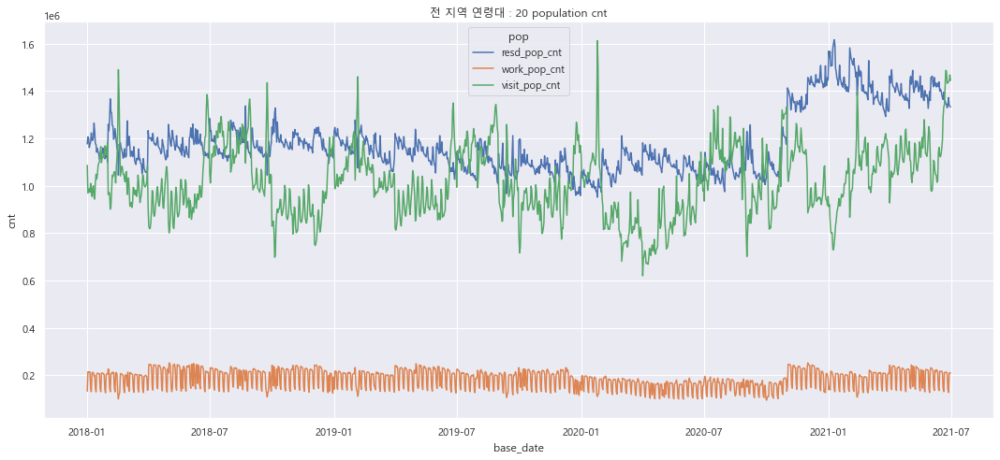

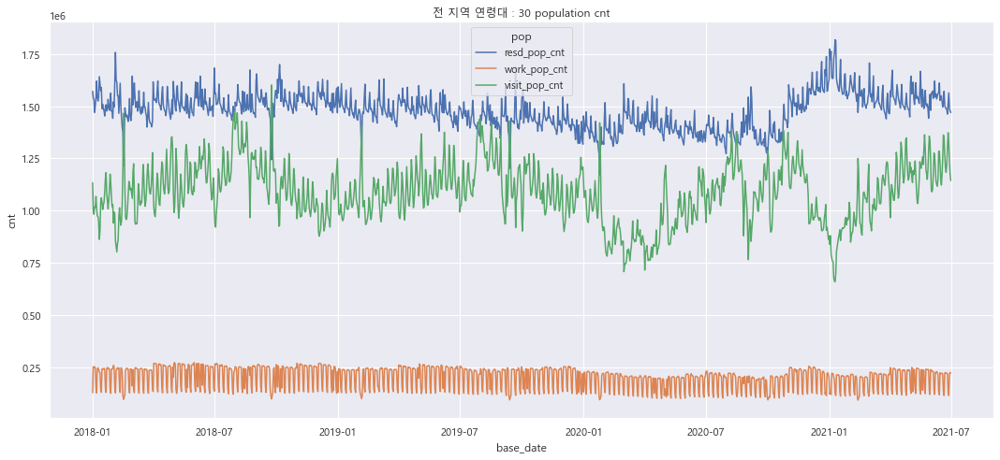

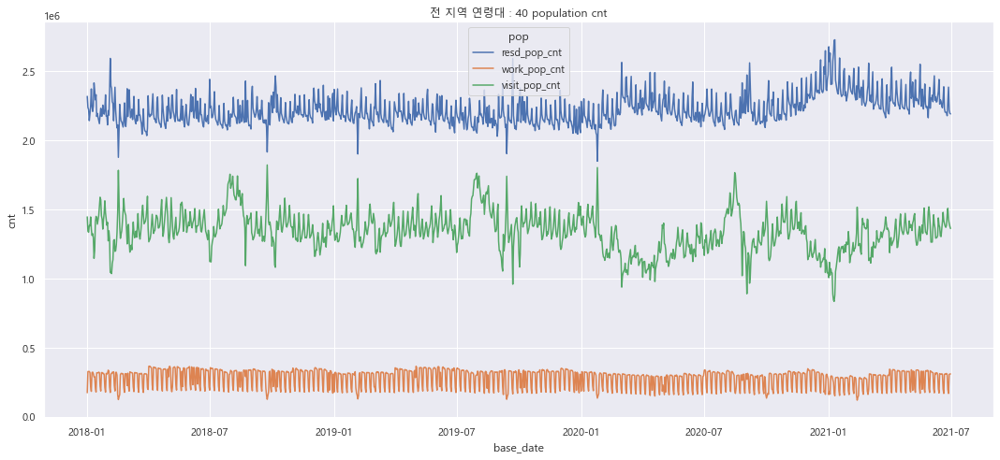

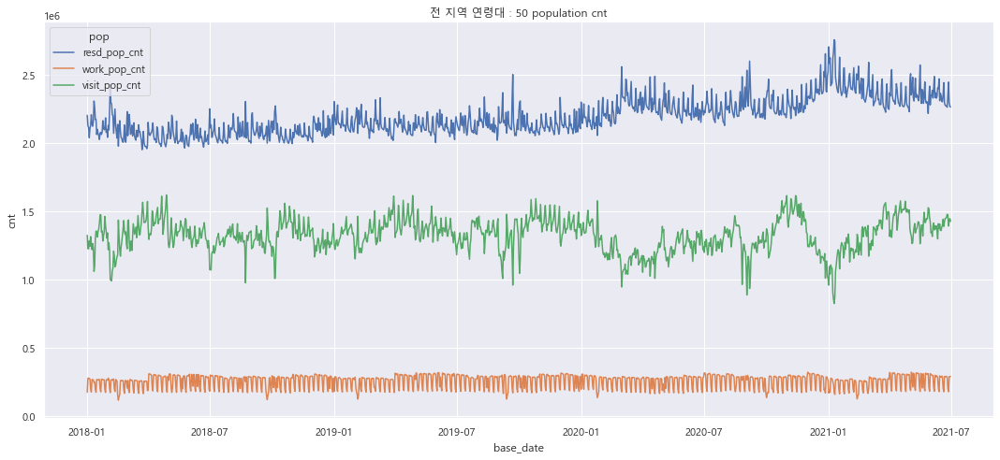

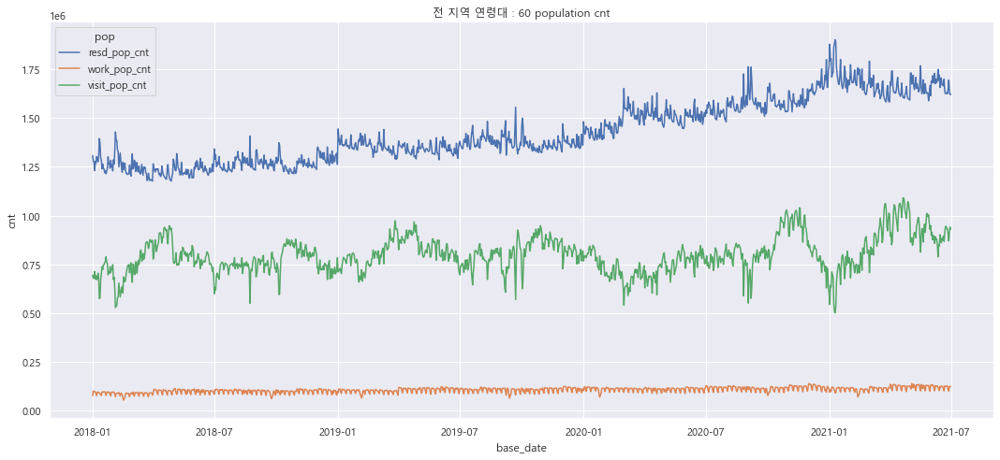

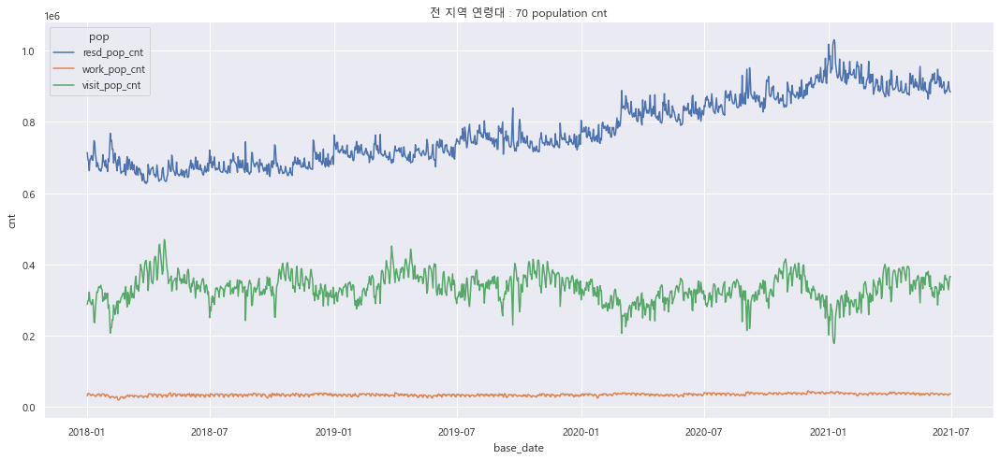

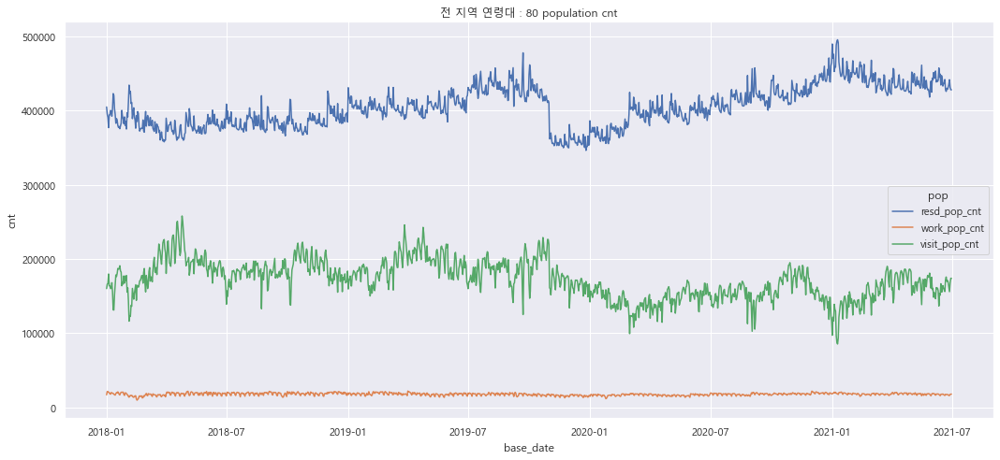

In [16]:
# 거주지 상관없이 연령별 전체 유동인구 추이
for age in local['age'].unique():
    pop_cnt = local[local['age'] == age].groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
    pop_cnt = pd.melt(pop_cnt, id_vars='base_date', var_name='pop', value_name='cnt')

    sns.lineplot(data=pop_cnt,x='base_date',y='cnt',hue='pop')
    plt.title('전 지역 연령대 : {} population cnt'.format(age))
    plt.tight_layout()
    plt.show()

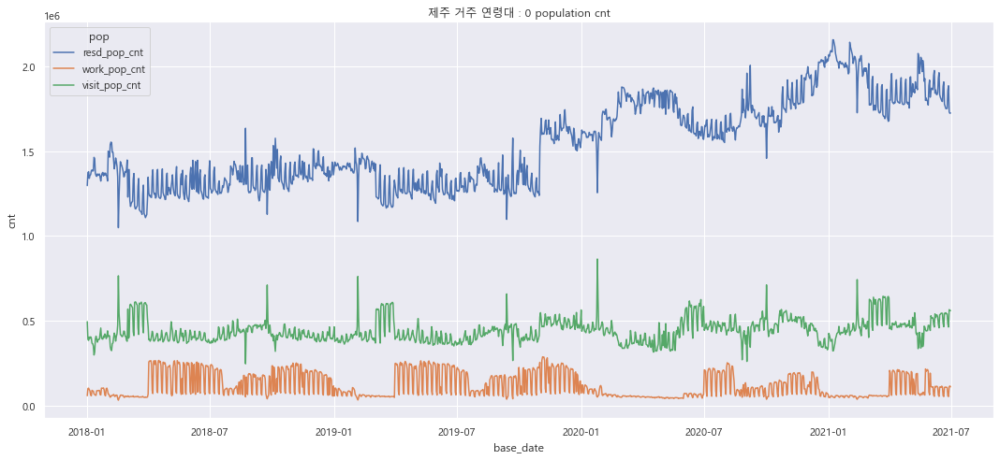

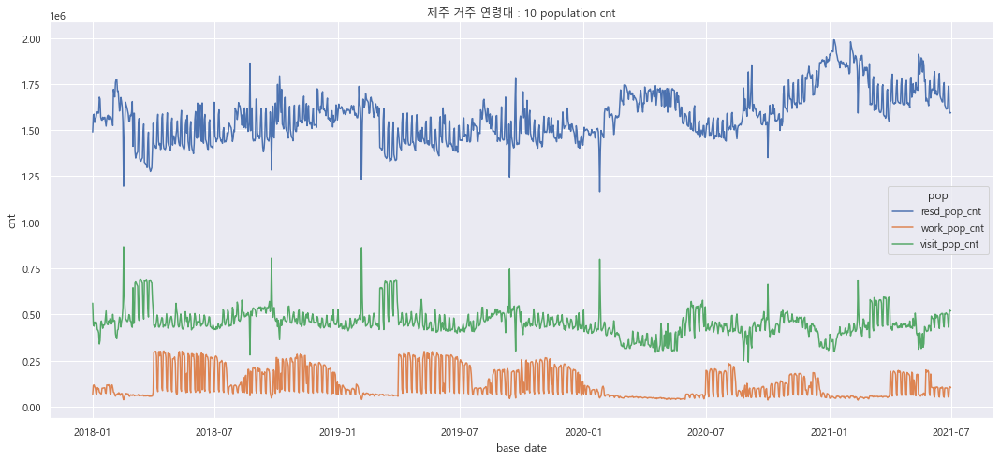

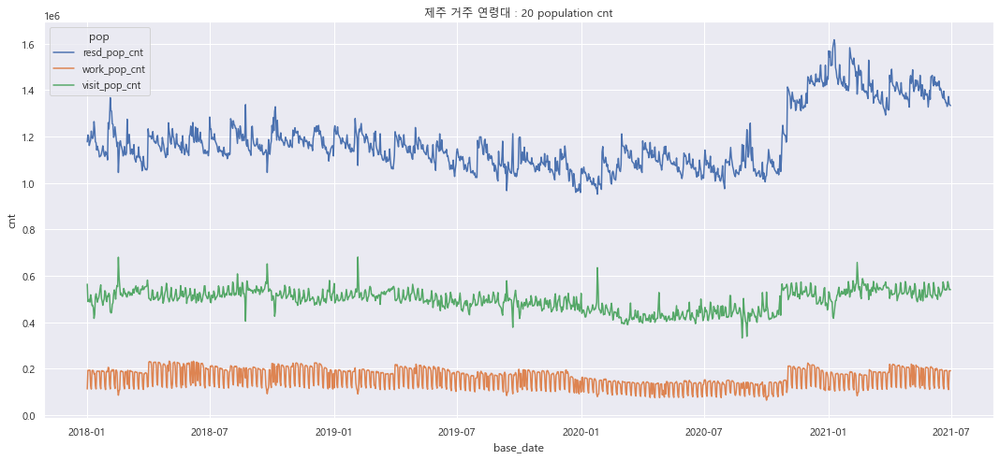

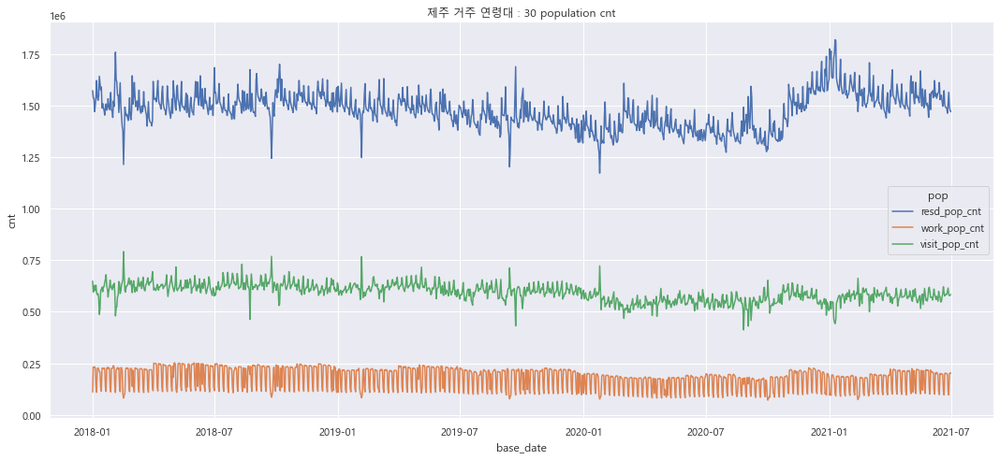

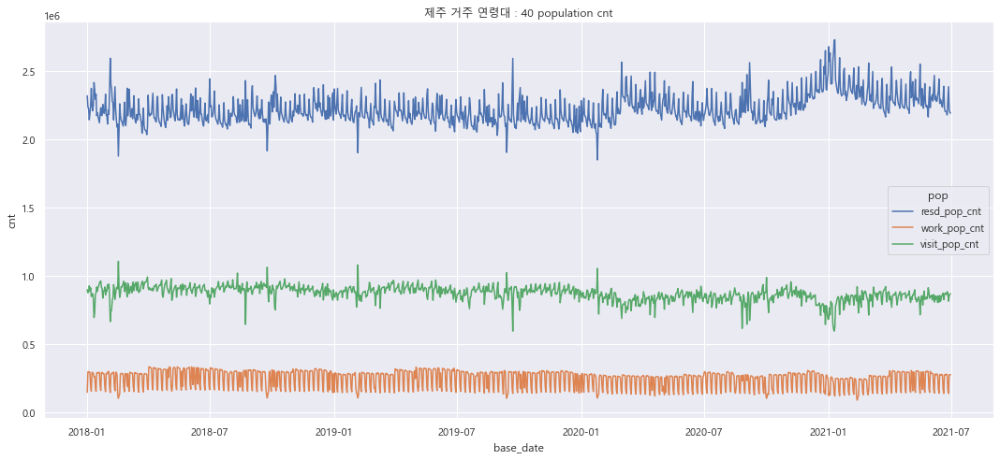

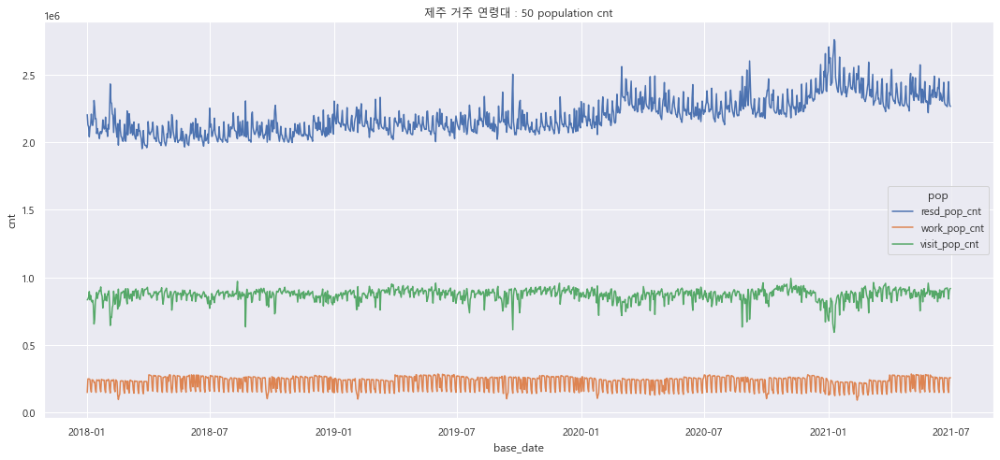

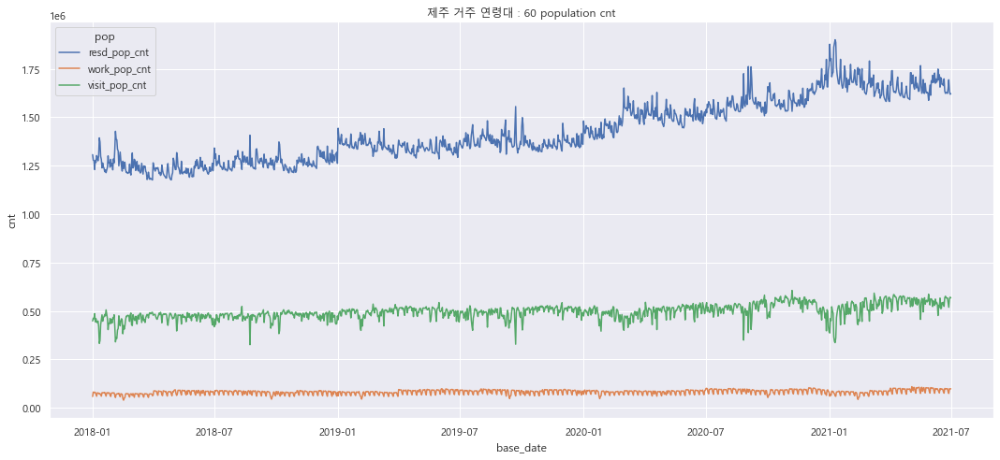

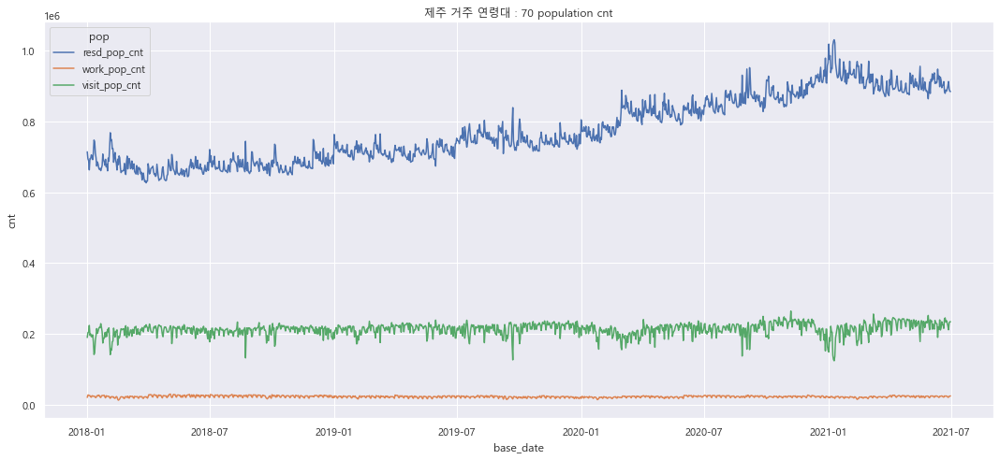

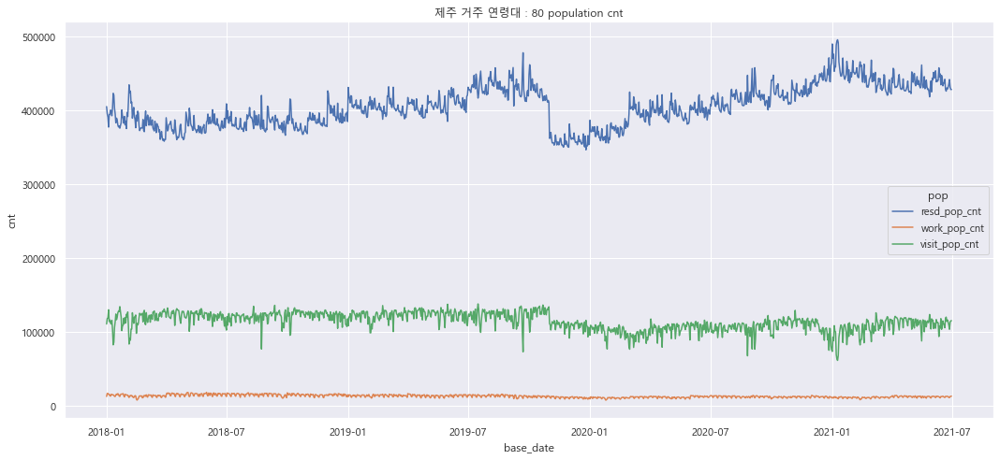

In [17]:
# 제주 거주 연령별 전체 유동인구 추이
for age in local['age'].unique():
    pop_cnt = local[(local['age'] == age) & (local['resd'] == '제주')].groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
    pop_cnt = pd.melt(pop_cnt, id_vars='base_date', var_name='pop', value_name='cnt')

    sns.lineplot(data=pop_cnt,x='base_date',y='cnt',hue='pop')
    plt.title('제주 거주 연령대 : {} population cnt'.format(age))
    plt.tight_layout()
    plt.show()

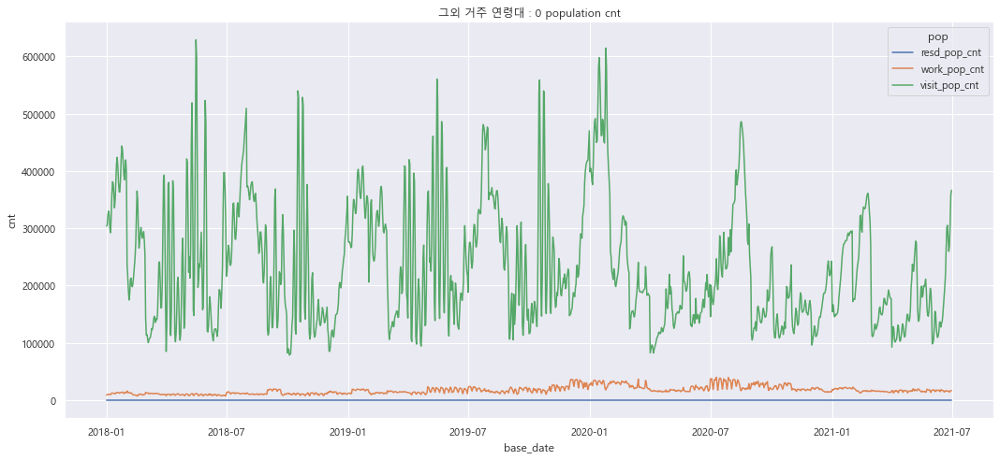

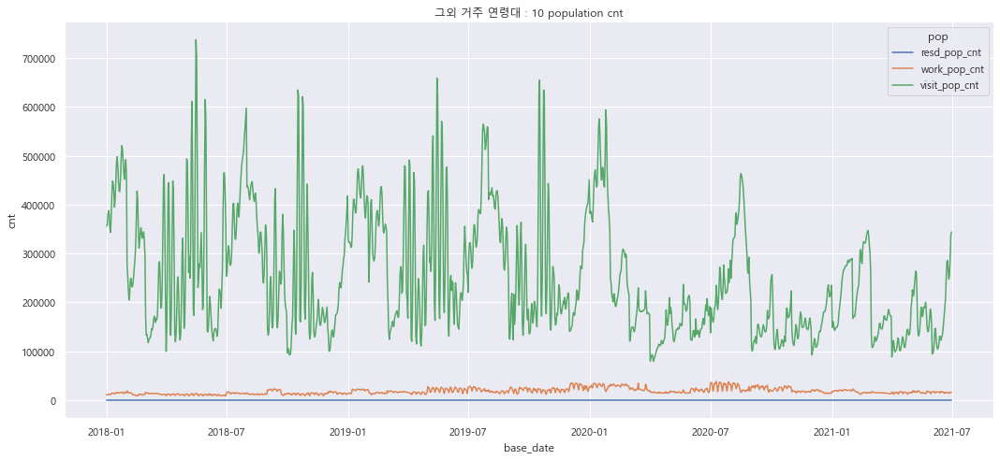

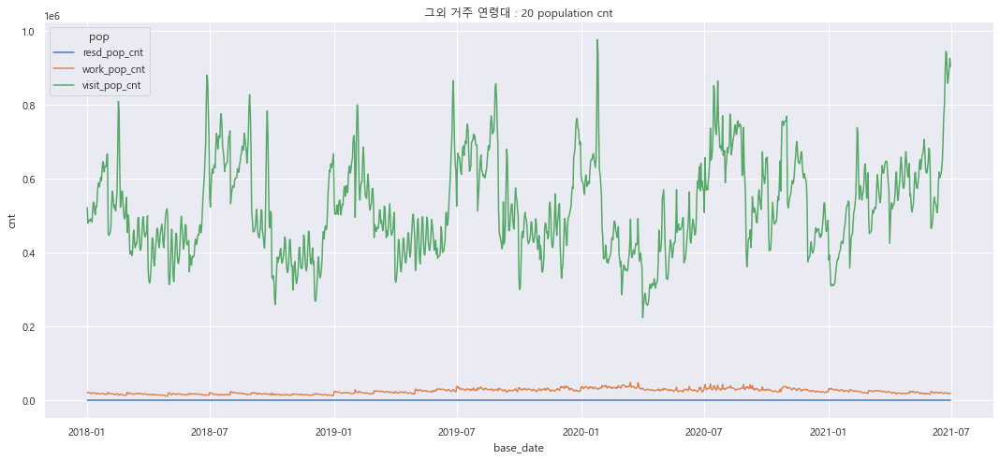

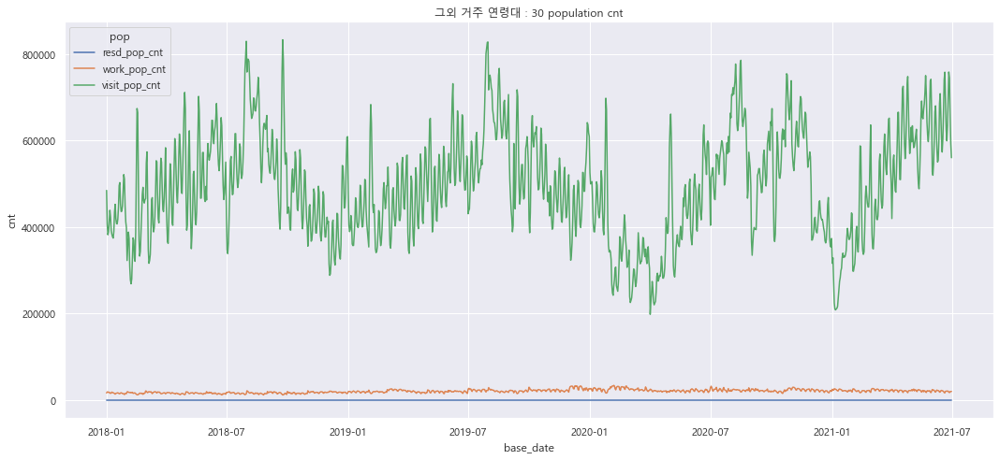

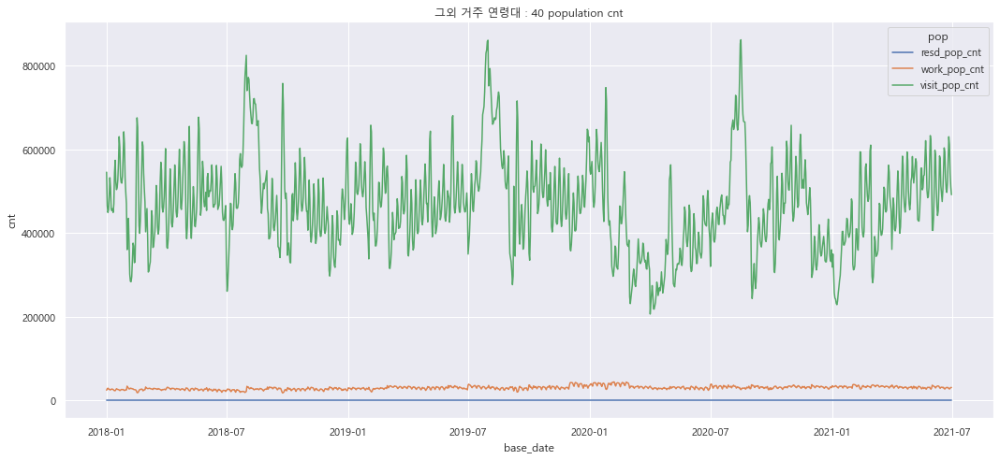

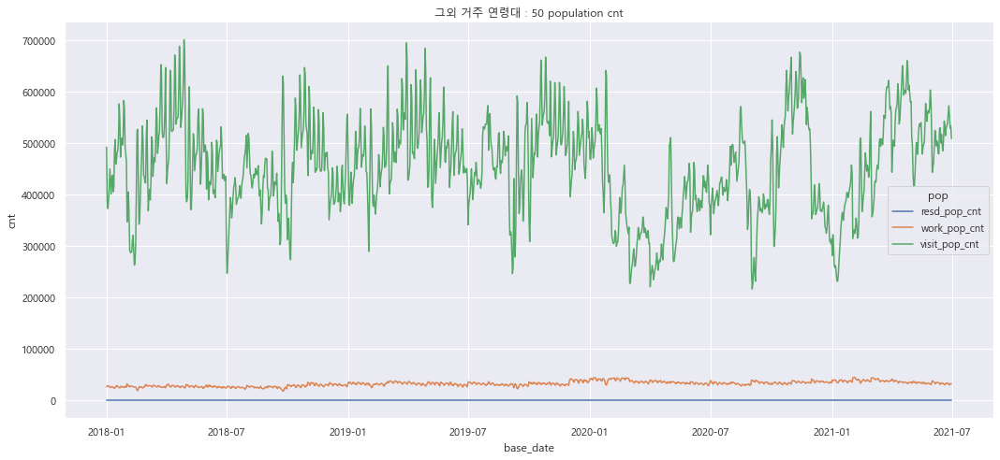

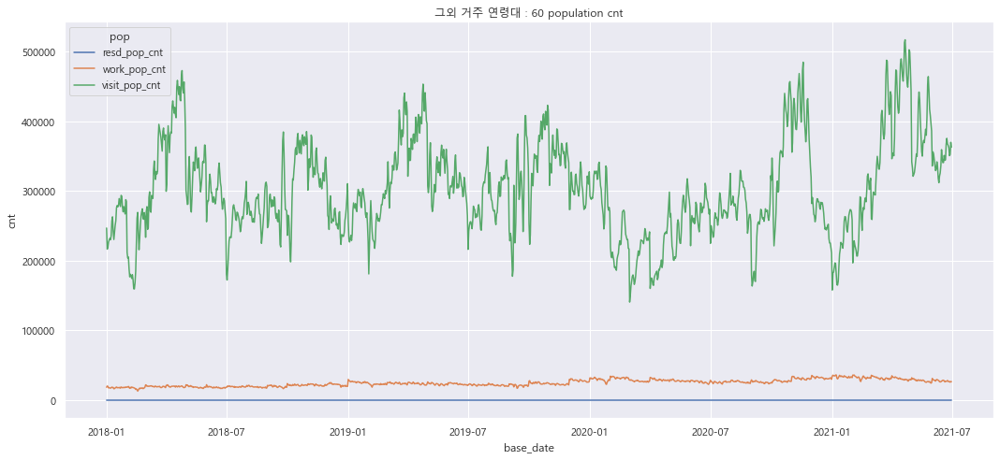

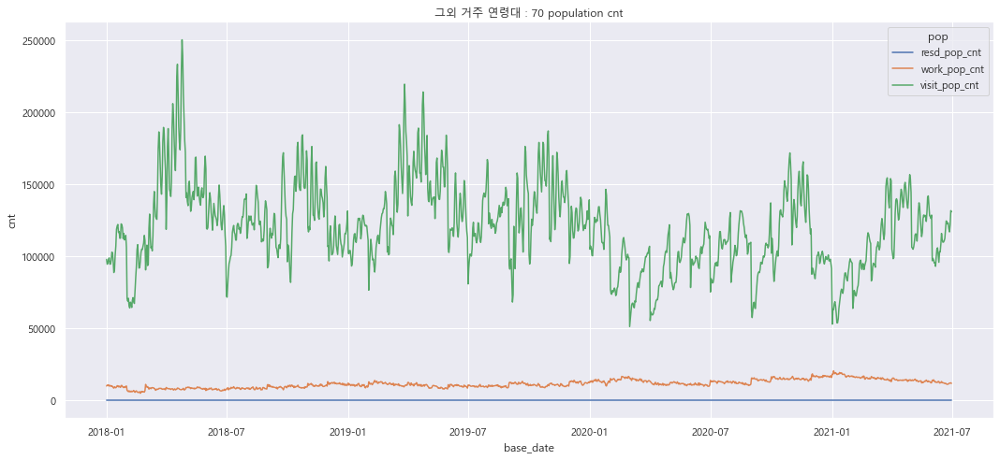

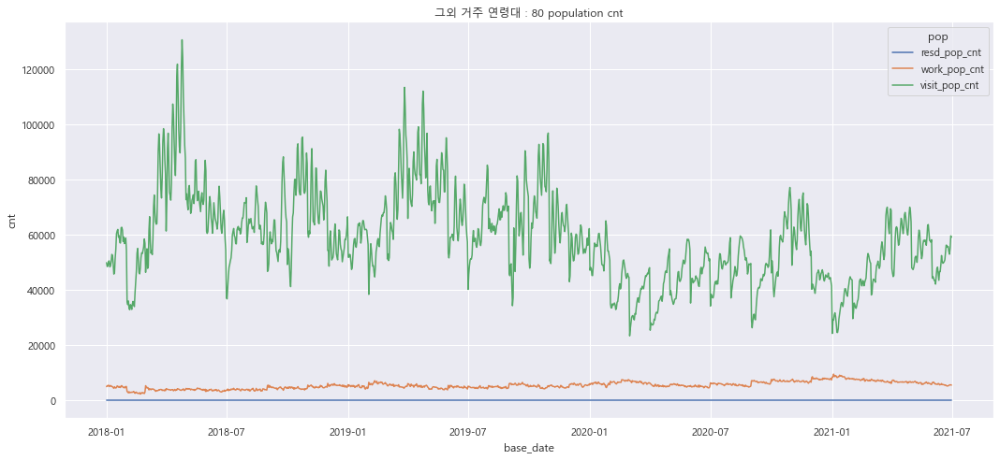

In [18]:
# 그외 거주 연령별 전체 유동인구 추이
for age in local['age'].unique():
    pop_cnt = local[(local['age'] == age) & (local['resd'] == '그외')].groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
    pop_cnt = pd.melt(pop_cnt, id_vars='base_date', var_name='pop', value_name='cnt')

    sns.lineplot(data=pop_cnt,x='base_date',y='cnt',hue='pop')
    plt.title('그외 거주 연령대 : {} population cnt'.format(age))
    plt.tight_layout()
    plt.show()

성별

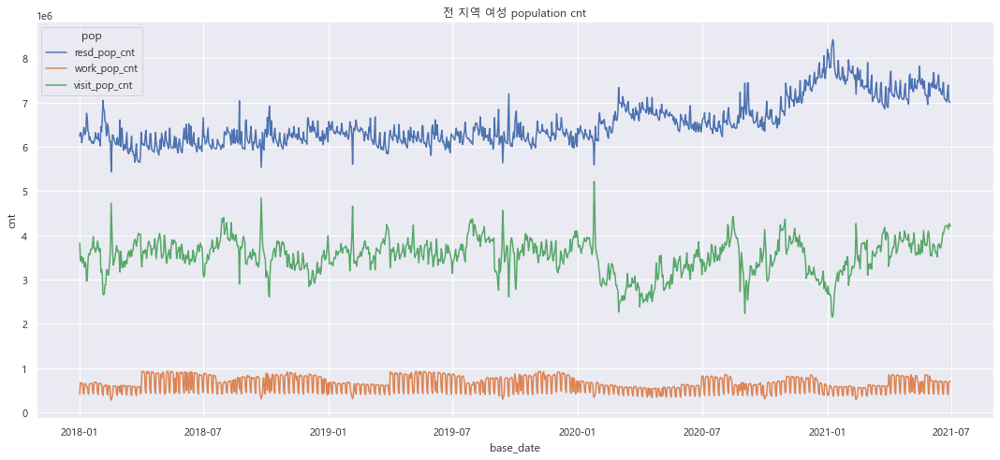

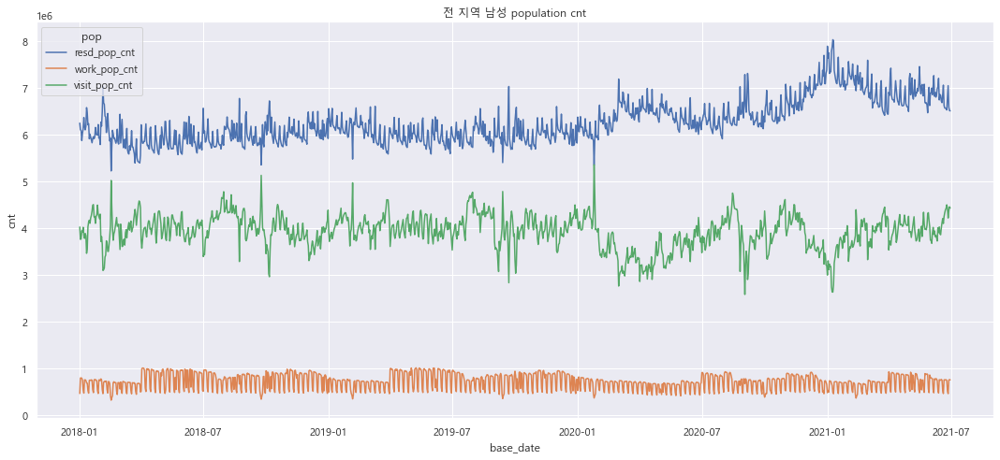

In [19]:
# 거주지 상관없이 성별 유동인구 추이
for sex in local['sex'].unique():
    pop_cnt = local[local['sex'] == sex].groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
    pop_cnt = pd.melt(pop_cnt, id_vars='base_date', var_name='pop', value_name='cnt')

    sns.lineplot(data=pop_cnt,x='base_date',y='cnt',hue='pop')
    plt.title('전 지역 {} population cnt'.format(sex))
    plt.tight_layout()
    plt.show()

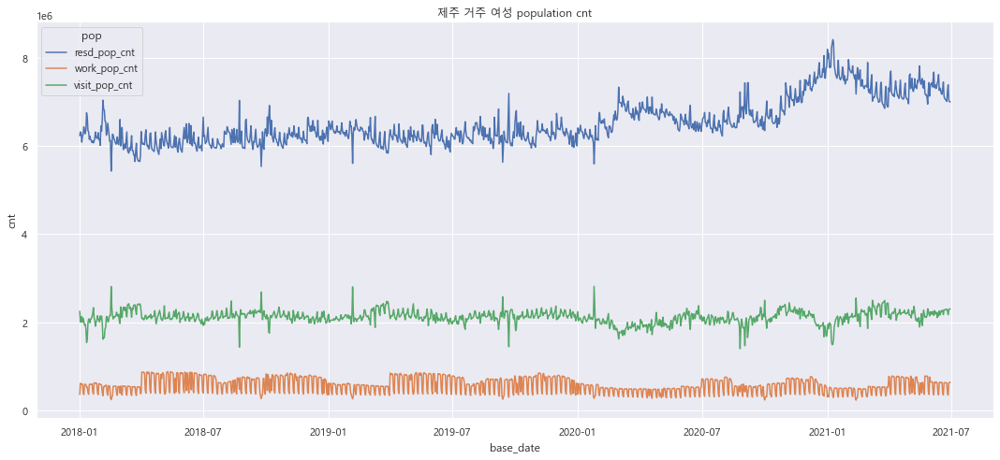

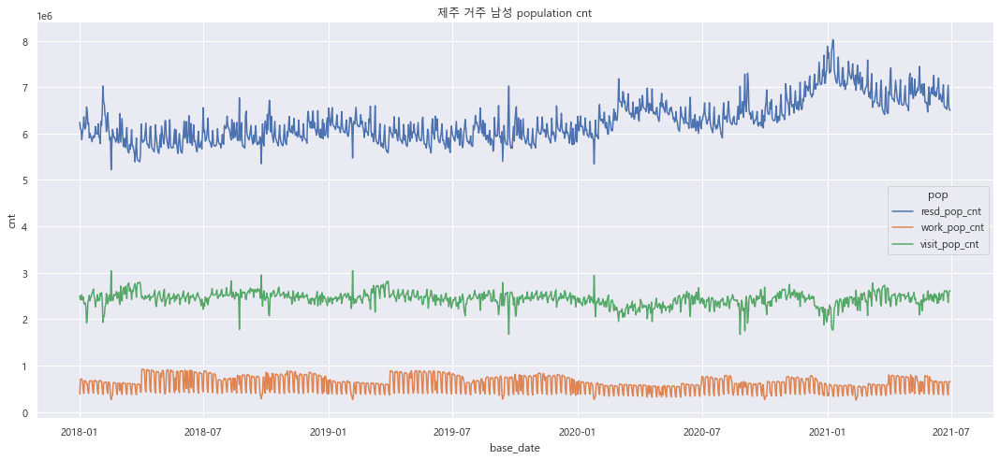

In [20]:
# 제주 거주 성별 유동인구 추이
for sex in local['sex'].unique():
    pop_cnt = local[(local['sex'] == sex) & (local['resd'] == '제주')].groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
    pop_cnt = pd.melt(pop_cnt, id_vars='base_date', var_name='pop', value_name='cnt')

    sns.lineplot(data=pop_cnt,x='base_date',y='cnt',hue='pop')
    plt.title('제주 거주 {} population cnt'.format(sex))
    plt.tight_layout()
    plt.show()

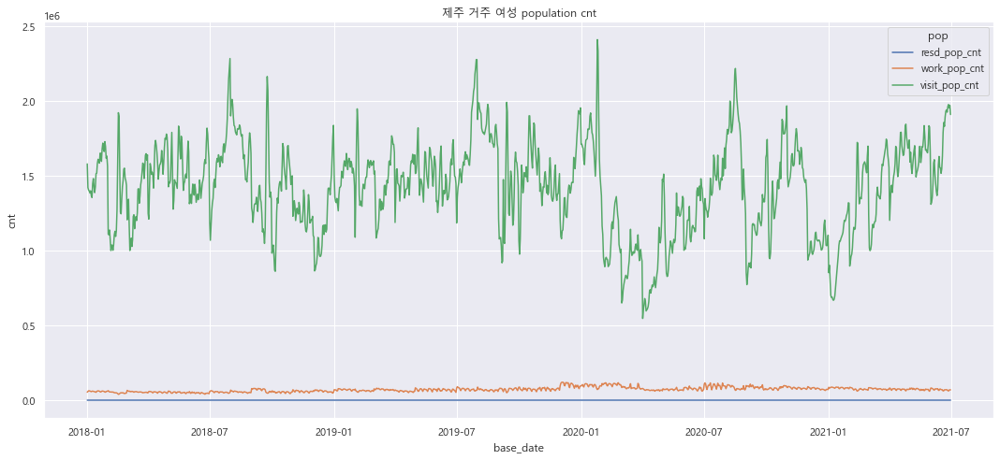

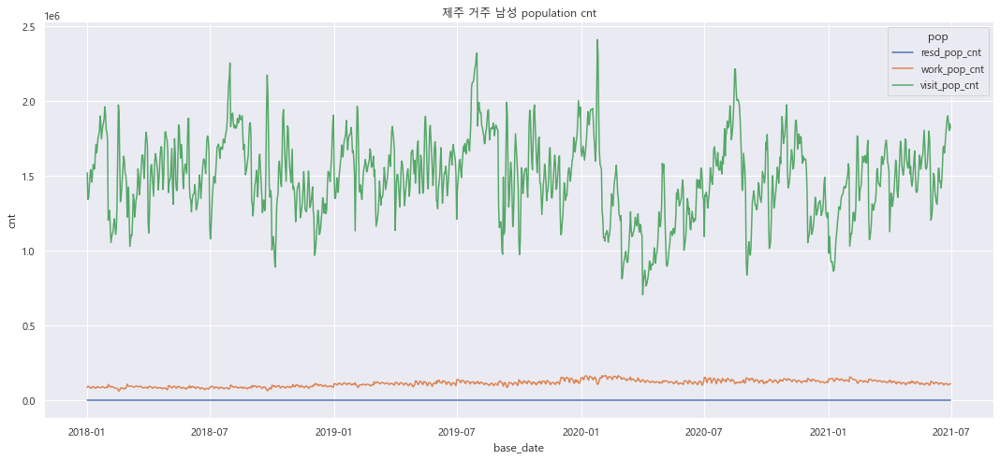

In [21]:
# 그외 거주 성별 유동인구 추이
for sex in local['sex'].unique():
    pop_cnt = local[(local['sex'] == sex) & (local['resd'] == '그외')].groupby(['base_date'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().reset_index()
    pop_cnt = pd.melt(pop_cnt, id_vars='base_date', var_name='pop', value_name='cnt')

    sns.lineplot(data=pop_cnt,x='base_date',y='cnt',hue='pop')
    plt.title('제주 거주 {} population cnt'.format(sex))
    plt.tight_layout()
    plt.show()

### 일평균 인구통계 특성별 유동인구 추이
**성별**
1. 거주인구는 여성이, 방문인구는 남성이 더 우세
<br><br>
**연령대**
1. 방문인구는 제주에 거주하는 경우에는 40/50대, 그외 지역에 거주하는 경우 20/20대가 많음
2. 근무인구는 거주지에 상관없이 40/50대가 많음
3. 거주인구는 40/50대가 많음

[Text(0.5, 1.0, '거주지역이 그외인 성별 유동인구')]

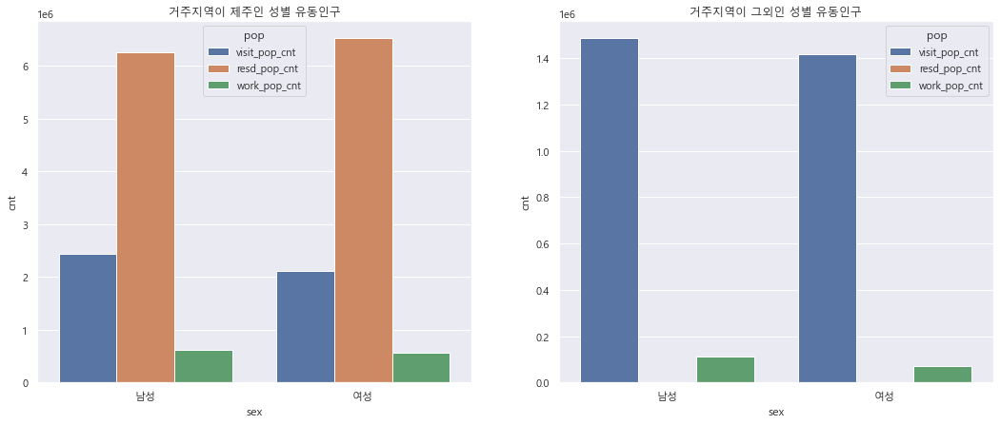

In [22]:
# 일평균 성별 유동인구
day_sex_pop = local.groupby(['base_date','sex','resd'])['visit_pop_cnt','resd_pop_cnt','work_pop_cnt'].sum().reset_index()
day_sex_pop = (day_sex_pop.groupby(['sex','resd'])['visit_pop_cnt','resd_pop_cnt','work_pop_cnt'].mean()).stack().reset_index()
day_sex_pop.columns = ['sex','resd','pop','cnt']

figure, (ax1,ax2) = plt.subplots(ncols=2)
figure.set_size_inches(18,7)
sns.barplot(data = day_sex_pop[day_sex_pop['resd'] == '제주'].reset_index(drop=True),x = 'sex',y='cnt',hue='pop',ax = ax1)
sns.barplot(data = day_sex_pop[day_sex_pop['resd'] == '그외'].reset_index(drop=True),x = 'sex',y='cnt',hue='pop',ax = ax2)
ax1.set(title="거주지역이 제주인 성별 유동인구")
ax2.set(title="거주지역이 그외인 성별 유동인구")

[Text(0.5, 1.0, '거주지역이 그외인 연령별 유동인구')]

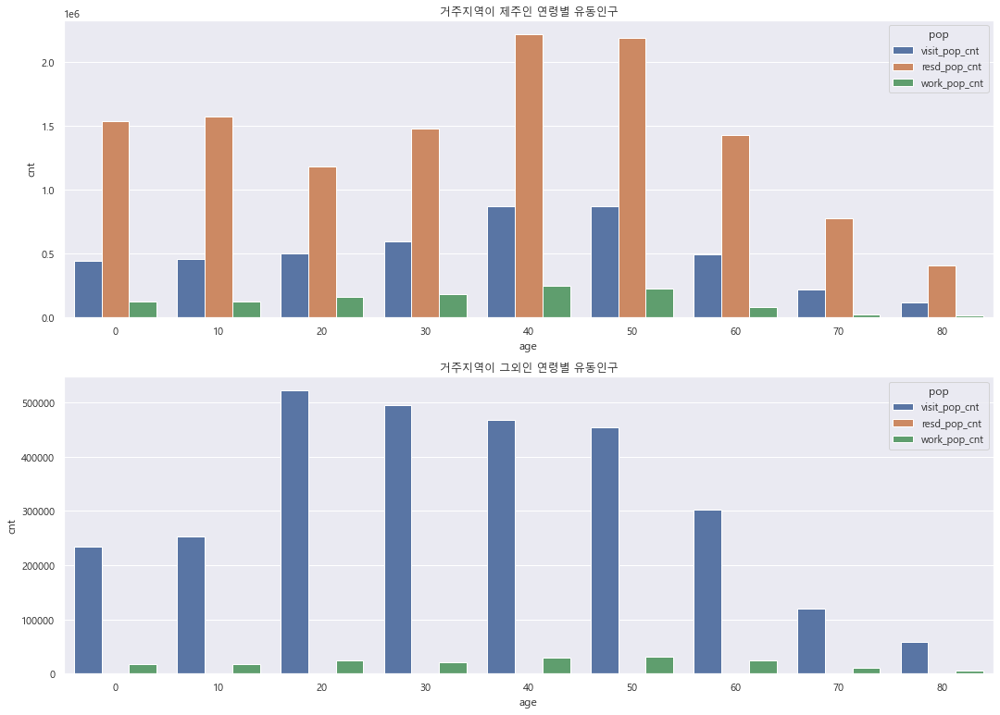

In [23]:
# 일평균 연령별 유동인구 => 근데 연령대가 0인 사람은 근무지에 어떻게 가는 걸까요...
day_age_pop = local.groupby(['base_date','age','resd'])['visit_pop_cnt','resd_pop_cnt','work_pop_cnt'].sum().reset_index()
day_age_pop = day_age_pop.groupby(['age','resd'])['visit_pop_cnt','resd_pop_cnt','work_pop_cnt'].mean().stack().reset_index()
day_age_pop.columns = ['age','resd','pop','cnt']

figure, (ax1,ax2) = plt.subplots(nrows=2)
figure.set_size_inches(18,13)
sns.barplot(data = day_age_pop[day_age_pop['resd'] == '제주'].reset_index(drop=True),x = 'age',y='cnt',hue='pop',ax = ax1)
sns.barplot(data = day_age_pop[day_age_pop['resd'] == '그외'].reset_index(drop=True),x = 'age',y='cnt',hue='pop',ax = ax2)
ax1.set(title="거주지역이 제주인 연령별 유동인구")
ax2.set(title="거주지역이 그외인 연령별 유동인구")

## 계절별 resd / work / visit population

### 인구통계 특성별 유동인구 추이
**나이별**
1. 전체 거주
* resd_pop_cnt는 모든 연령대가 비슷한 패턴(봄>겨울>여름>가을)을 가지고 있음
* work_pop_cnt는 0~10대에서 봄>여름>가을>겨울이고, 나머지 연령대는 봄>겨울>여름>가을의 패턴
* visit_pop_cnt는 마찬가지로 봄>겨울>여름>가을의 패턴인데, 20대에서 가을이 다른 계절보다 유독 적음
2. 거주 구분
* 추이는 전체 거주로 봤을 때와 비슷함, 제주 거주 인구의 유동인구는 종류에 상관없이 계절 간 비중이 비슷함
* resd_pop_cnt : pass
* work_pop_cnt : 그외 지역에 거주하는 사람이 제주 거주 인구보다 겨울에 유동인구 비중이 큼
* visit_pop_cnt : 그외 지역에 거주하는 사람 중에서 20/30대의 유동인구가 많음 ( 20대 : 여름>봄=겨울>가을, 30대 : 여름>봄>가을>겨울 )
<br><br>

**성별**
1. 남성과 여성 간 수적 차이만 있을 뿐 두 성별 모두 패턴이 유사함

나이별

In [63]:
age_season_cnt = local.groupby(['age','season','resd'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().stack().reset_index()
age_season_cnt.columns = ['age','season','resd','pop','cnt']

In [94]:
age_season_cnt['pop'].unique()

array(['resd_pop_cnt', 'work_pop_cnt', 'visit_pop_cnt'], dtype=object)

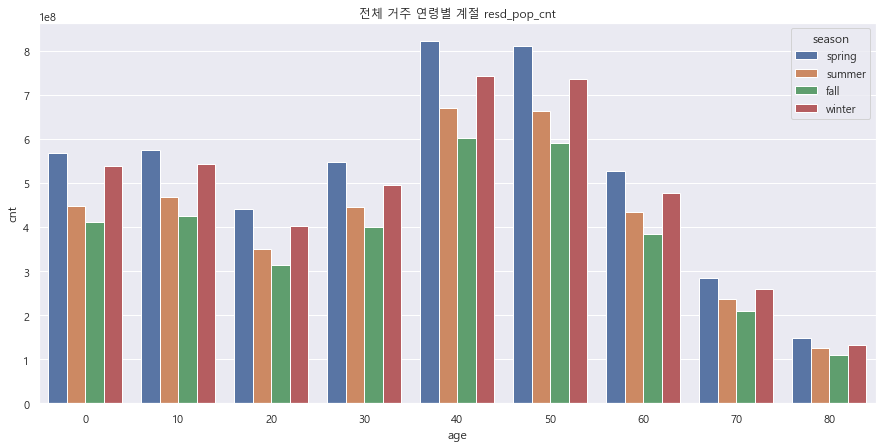

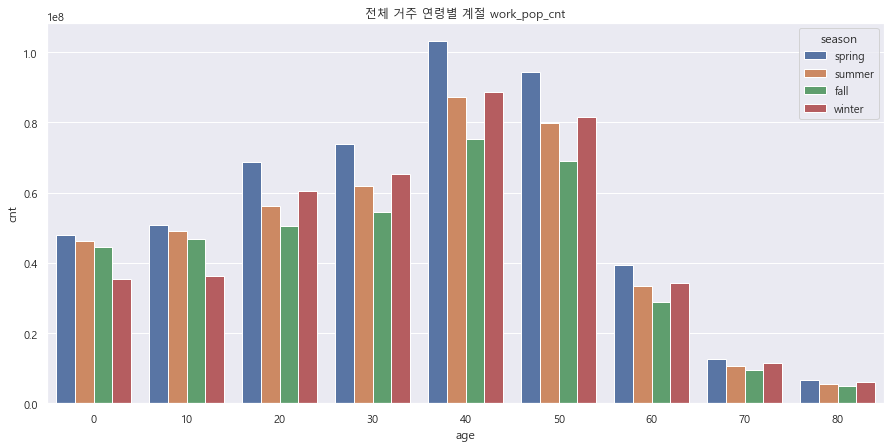

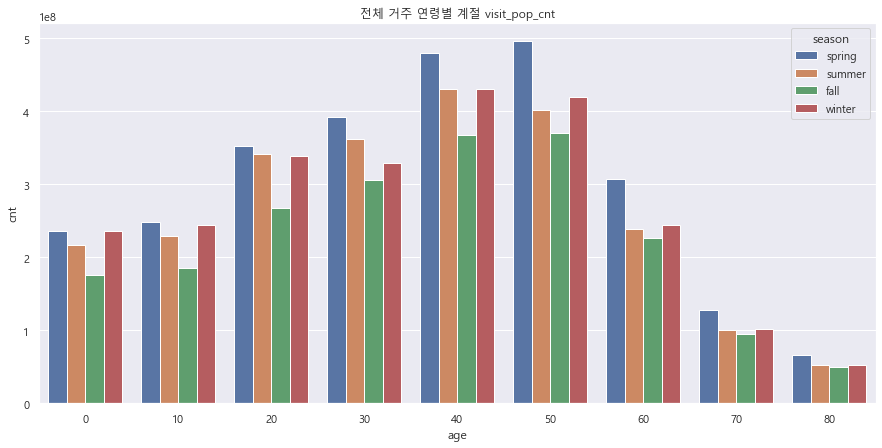

In [100]:
for pop in age_season_cnt['pop'].unique():
    season = age_season_cnt[age_season_cnt['pop'] == pop]
    figure.set_size_inches(10,18)
    sns.barplot(data = season.groupby(['age','season','pop'])['cnt'].sum().reset_index(),x = 'age',y='cnt',hue='season')
    plt.title("전체 거주 연령별 계절 {}".format(pop))
    plt.show()

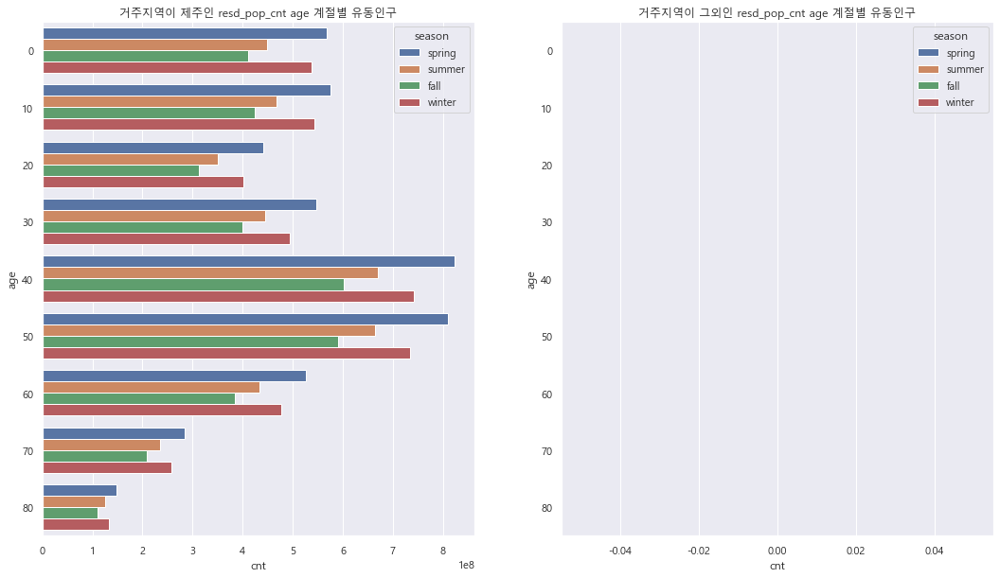

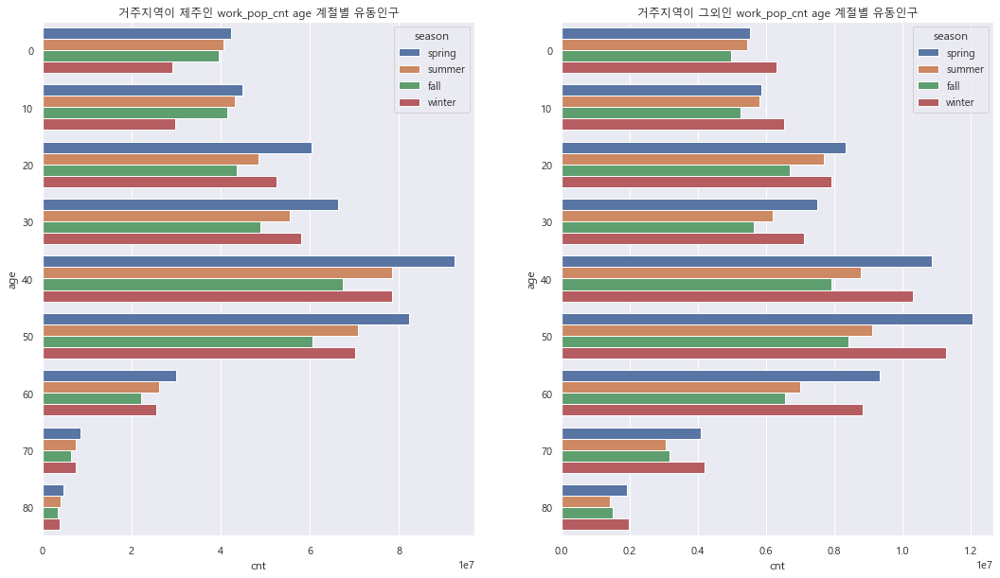

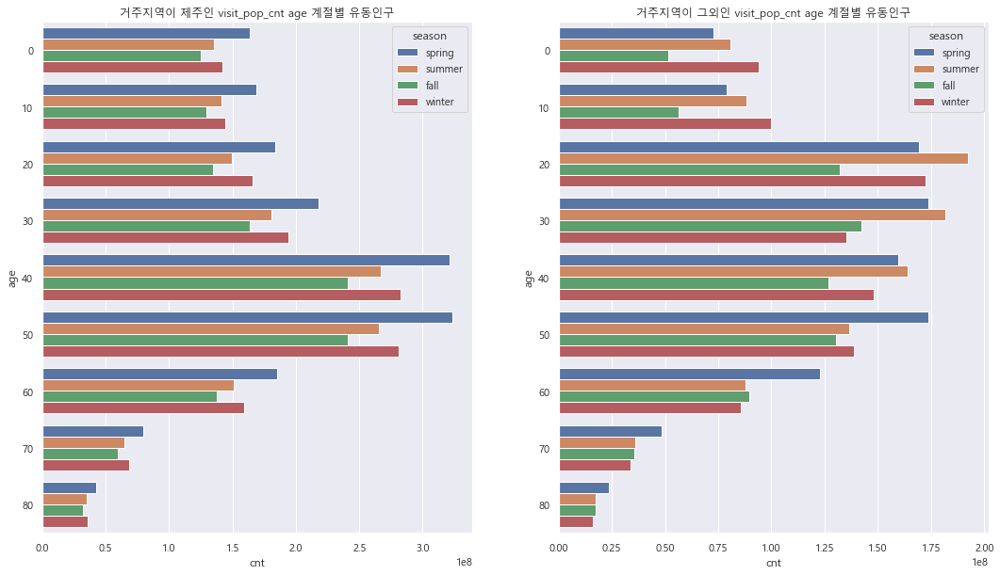

In [105]:
for pop in age_season_cnt['pop'].unique():
    season = age_season_cnt[age_season_cnt['pop'] == pop]
    figure, (ax1,ax2) = plt.subplots(ncols=2)
    figure.set_size_inches(18,10)
    sns.barplot(data = season[season['resd'] == '제주'],x = 'cnt',y='age',hue='season',orient='h',ax=ax1)
    sns.barplot(data = season[season['resd'] == '그외'],x = 'cnt',y='age',hue='season',orient='h',ax=ax2)
    ax1.set(title="거주지역이 제주인 {} age 계절별 유동인구".format(pop))
    ax2.set(title="거주지역이 그외인 {} age 계절별 유동인구".format(pop))
    plt.show()

성별

In [65]:
sex_season_cnt = local.groupby(['sex','season','resd'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().stack().reset_index()
sex_season_cnt.columns = ['sex','season','resd','pop','cnt']

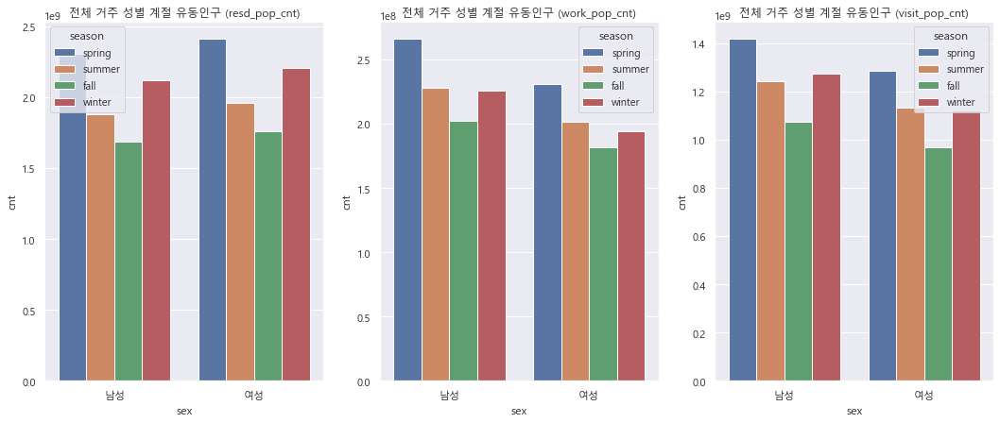

In [112]:
figure, (ax1,ax2,ax3) = plt.subplots(ncols=3)
figure.set_size_inches(18,7)
sns.barplot(data = sex_season_cnt[sex_season_cnt['pop'] == 'resd_pop_cnt'].groupby(['season','sex'])['cnt'].sum().reset_index(),x = 'sex',y='cnt',hue='season',ax=ax1)
sns.barplot(data = sex_season_cnt[sex_season_cnt['pop'] == 'work_pop_cnt'].groupby(['season','sex'])['cnt'].sum().reset_index(),x = 'sex',y='cnt',hue='season',ax=ax2)
sns.barplot(data = sex_season_cnt[sex_season_cnt['pop'] == 'visit_pop_cnt'].groupby(['season','sex'])['cnt'].sum().reset_index(),x = 'sex',y='cnt',hue='season',ax=ax3)
ax1.set(title="전체 거주 성별 계절 유동인구 (resd_pop_cnt)")
ax2.set(title="전체 거주 성별 계절 유동인구 (work_pop_cnt)")
ax3.set(title="전체 거주 성별 계절 유동인구 (visit_pop_cnt)")
plt.show()

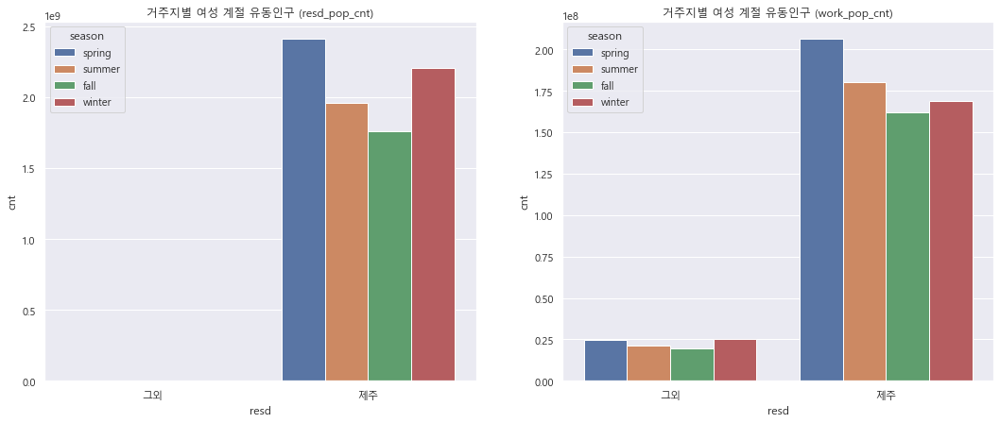

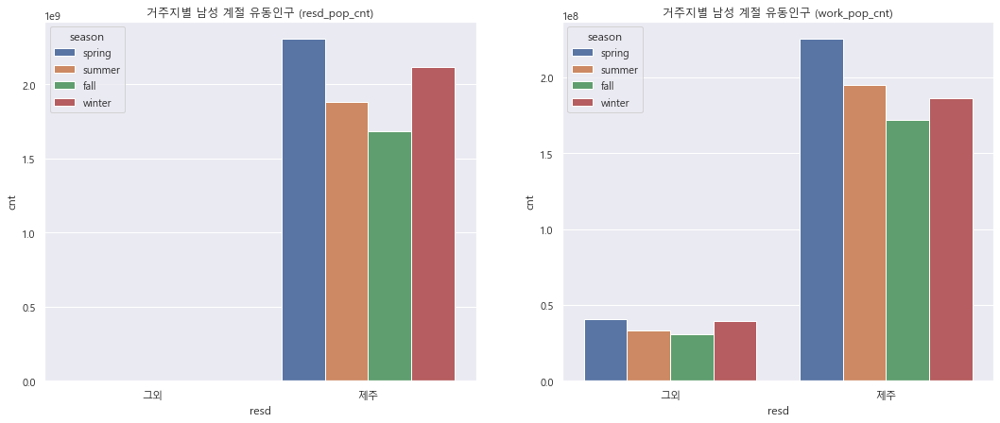

In [114]:
for sex in local.sex.unique():
    season = sex_season_cnt[sex_season_cnt['sex'] == sex]
    figure, (ax1,ax2) = plt.subplots(ncols=2)
    figure.set_size_inches(18,7)
    sns.barplot(data = season[season['pop'] == 'resd_pop_cnt'],x = 'resd',y='cnt',hue='season',ax=ax1)
    sns.barplot(data = season[season['pop'] == 'work_pop_cnt'],x = 'resd',y='cnt',hue='season',ax=ax2)
    sns.barplot(data = season[season['pop'] == 'visit_pop_cnt'],x = 'resd',y='cnt',hue='season',ax=ax3)
    ax1.set(title="거주지별 {} 계절 유동인구 (resd_pop_cnt)".format(sex))
    ax2.set(title="거주지별 {} 계절 유동인구 (work_pop_cnt)".format(sex))
    ax3.set(title="거주지별 {} 계절 유동인구 (visit_pop_cnt)".format(sex))
    plt.show()

## 월별 resd / work / visit population
**연령별**
거주인구 > 방문인구 > 근무인구
1. 전체 거주지
* 거주인구>방문인구>근무인구 순을 유지하며 대부분의 연령대에서 거주인구와 다른 인구 간 차이가 크다
* 20대(~30대)에서 6, 7, 8월(여름)에 방문인구가 급격히 증가하여 거주인구와 방문인구의 수치가 비슷해짐 => 그외 거주인구 때문으로 추정
* 나이가 많아질수록 거주인구와 근무,방문인구 사이의 차이가 벌어짐
2. 거주지 별 : 제주 거주인구의 월별 유동인구의 패턴은 전체적으로 다 비슷하고, 그외 거주인구의 방문인구에 주목해 볼 것.
<br><br>
**성별**
거주인구 > 방문인구 > 근무인구
1. 성별 상관없이 월별 유동인구의 패턴이 비슷함

연령별

In [86]:
month_age_cnt = local.groupby(['age','month'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().stack().reset_index()
month_age_cnt.columns = ['age','month','pop','cnt']

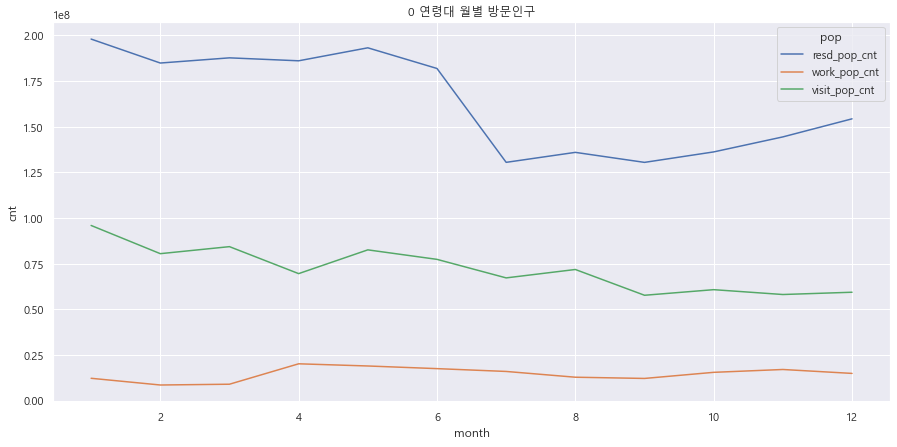

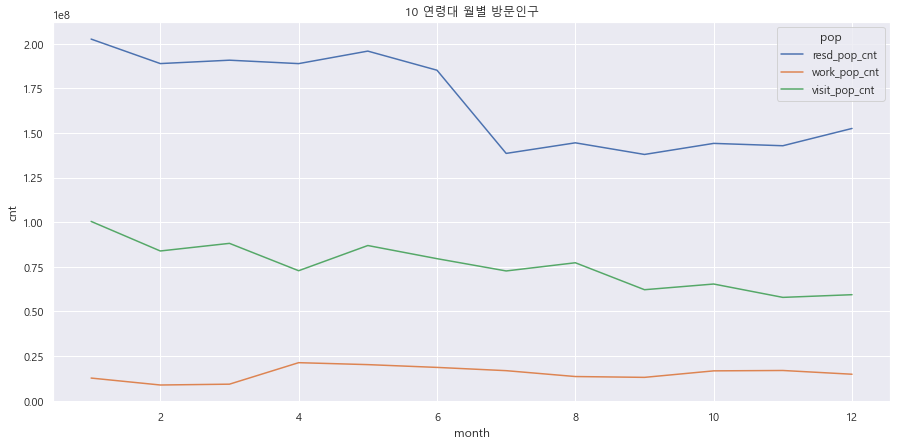

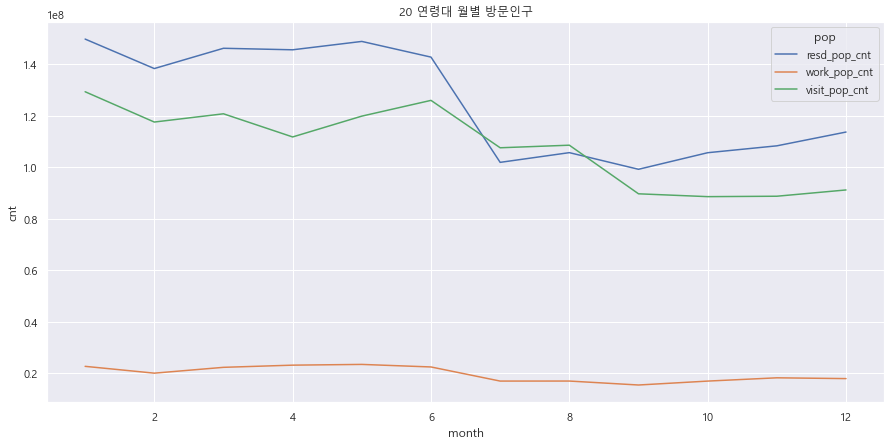

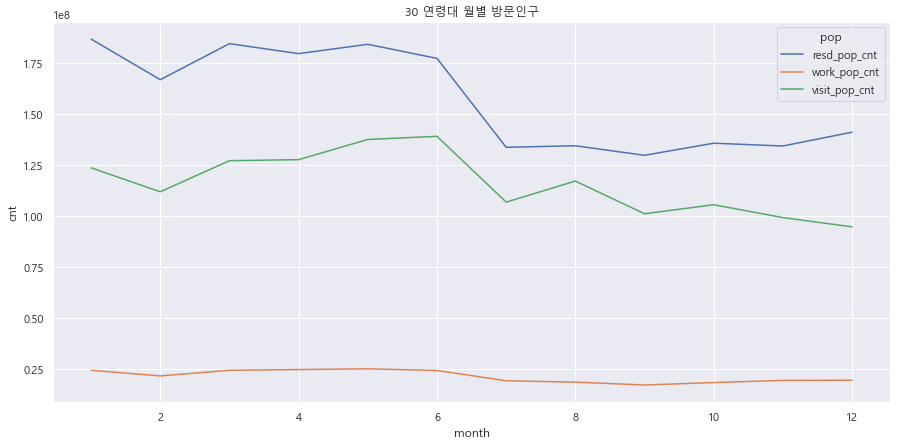

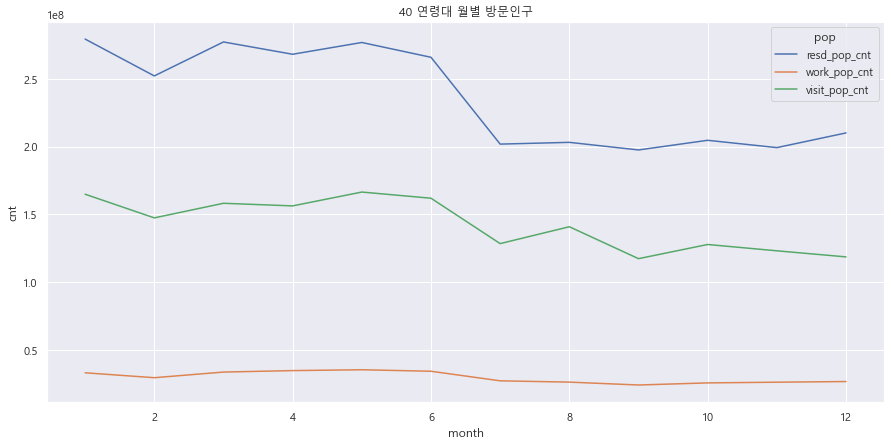

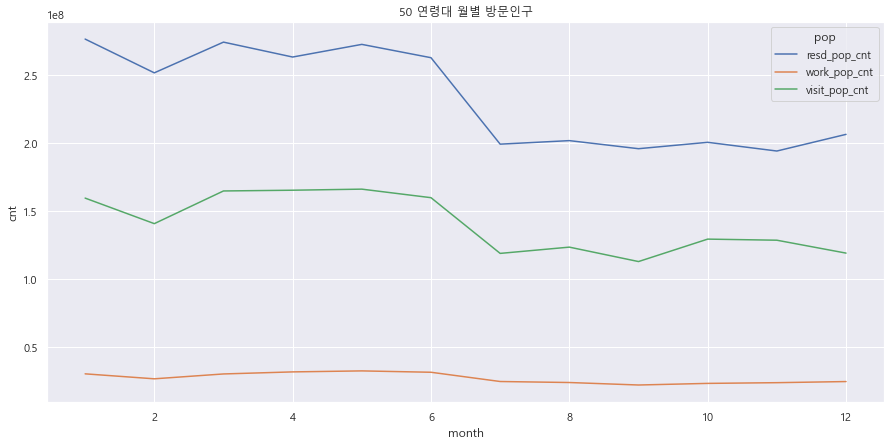

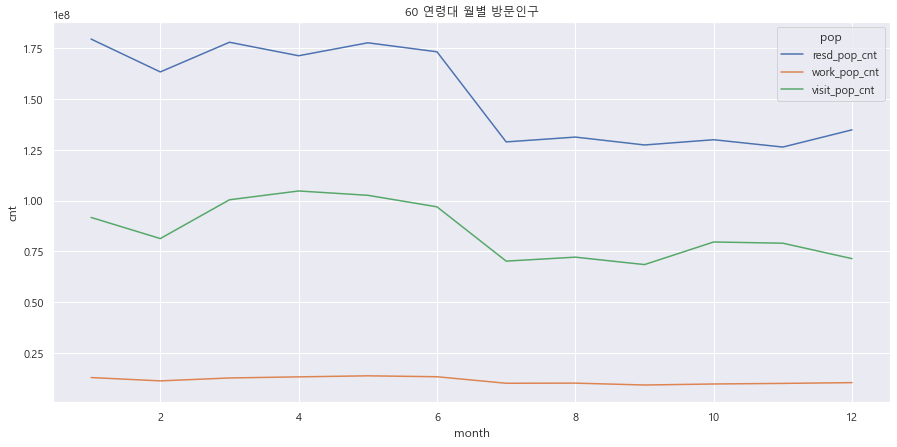

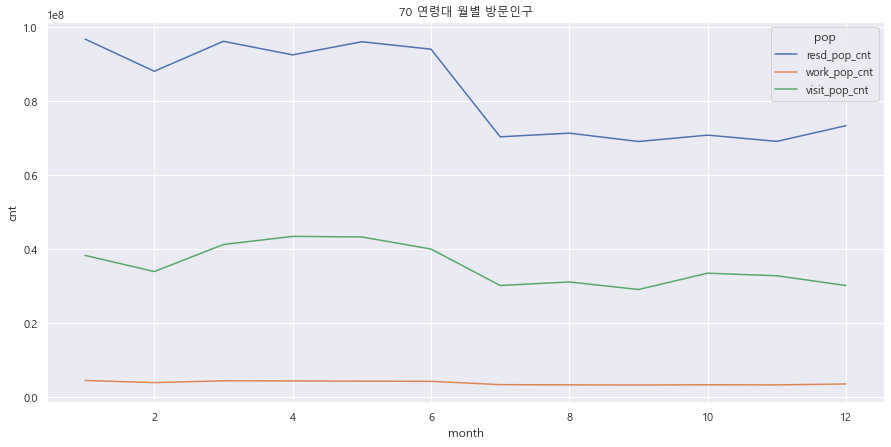

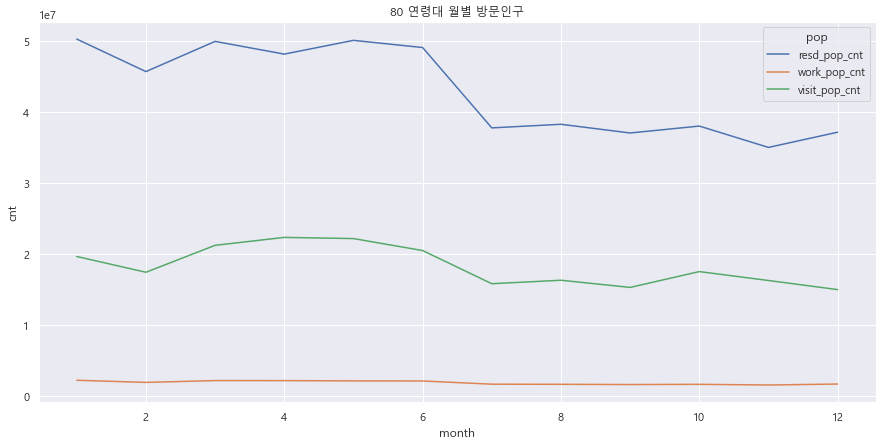

In [83]:
for age in local.age.unique():
    monthly = month_age_cnt[month_age_cnt['age'] == age]
    sns.lineplot(data = monthly,x = 'month',y='cnt',hue='pop')
    plt.title('{} 연령대 월별 방문인구'.format(age))
    plt.show()

In [115]:
month_age_cnt = local.groupby(['age','month','resd'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().stack().reset_index()
month_age_cnt.columns = ['age','month','resd','pop','cnt']

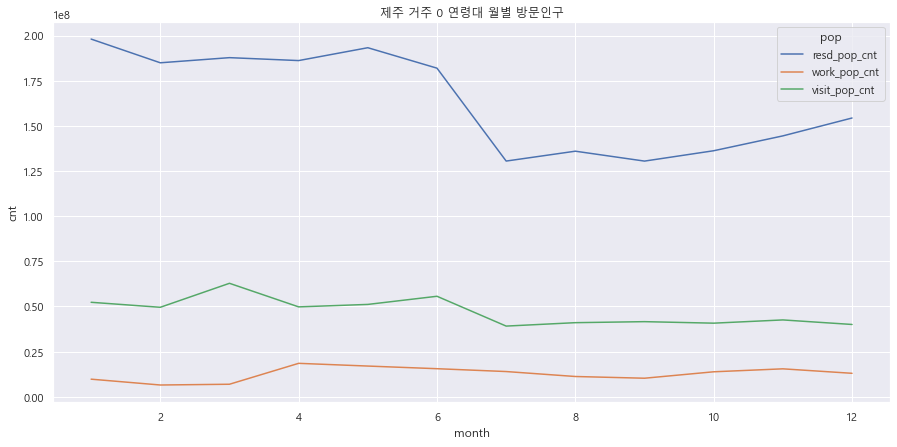

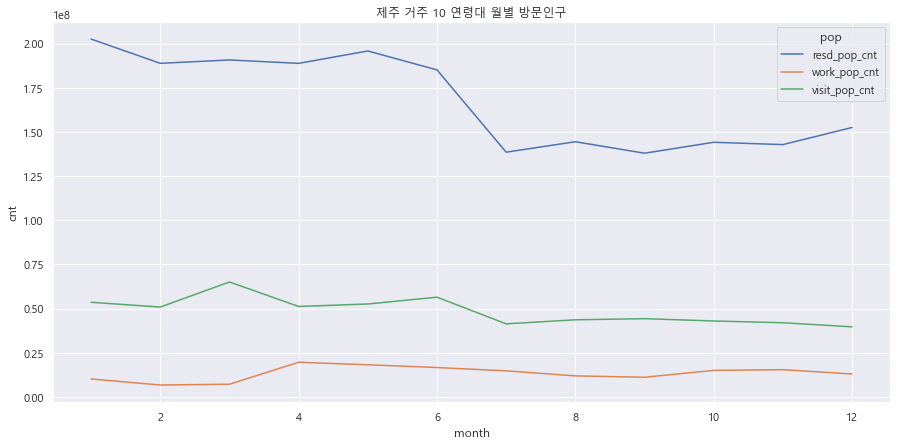

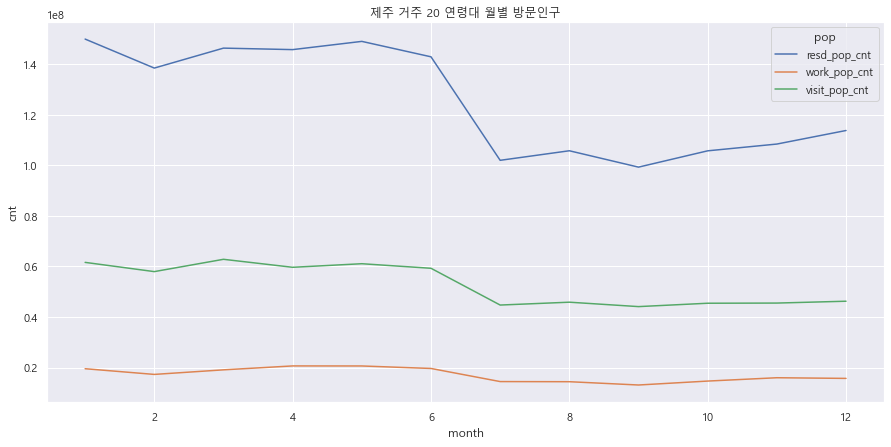

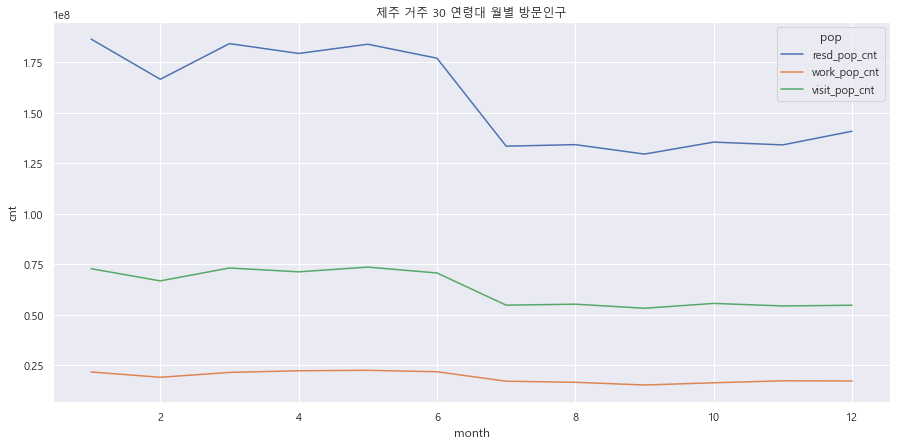

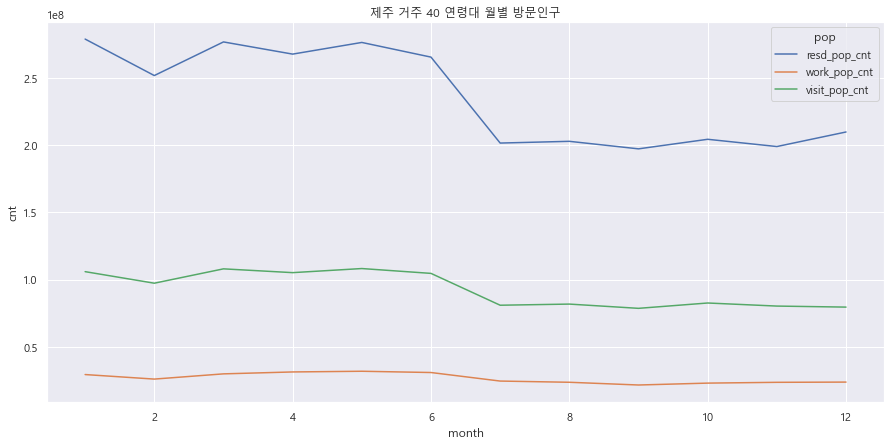

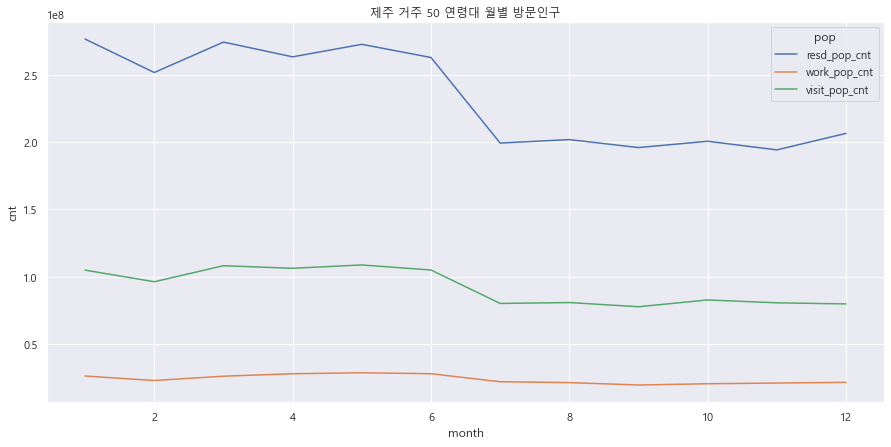

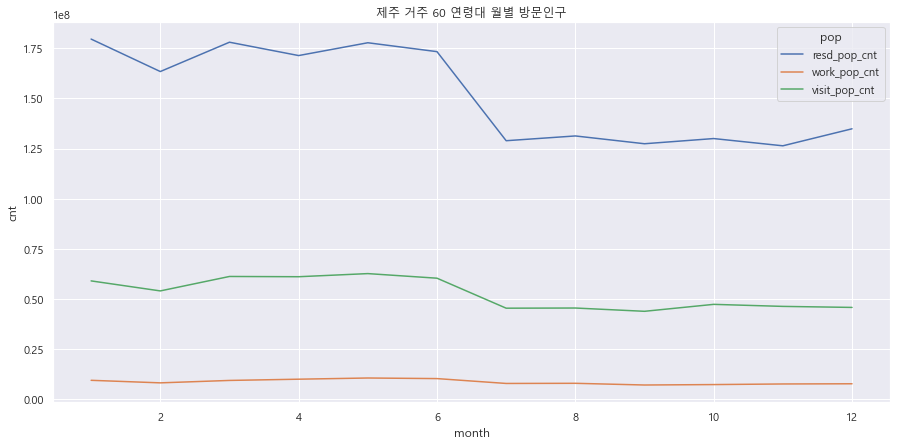

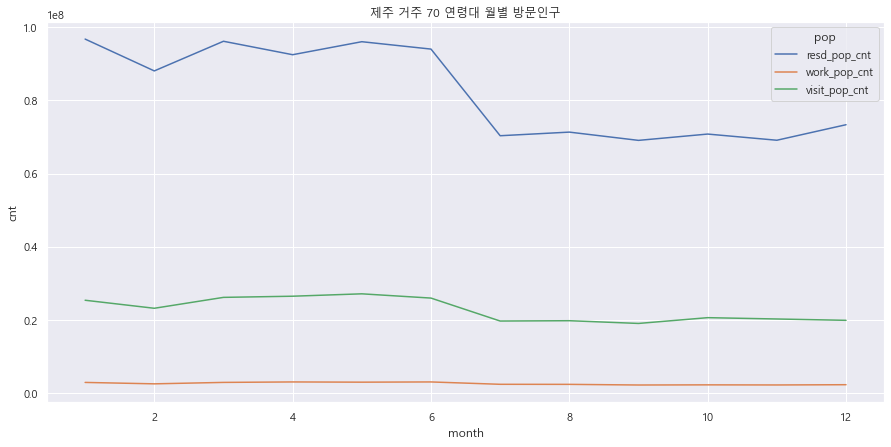

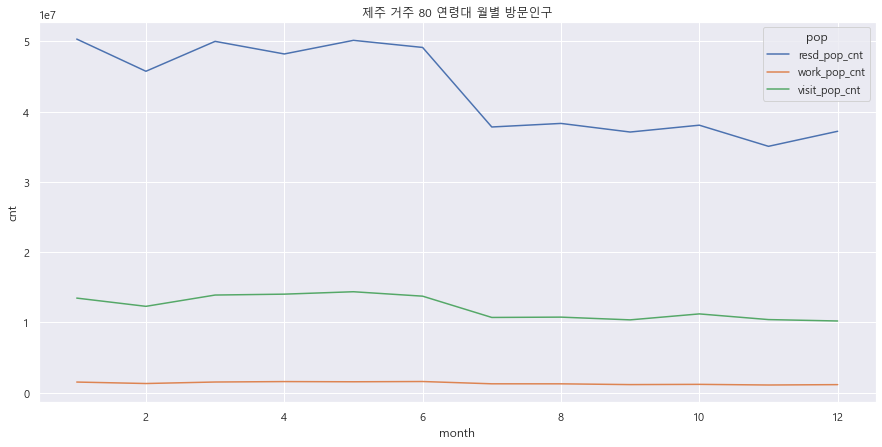

In [116]:
for age in local.age.unique():
    monthly = month_age_cnt[(month_age_cnt['age'] == age) & (month_age_cnt['resd'] == "제주")]
    sns.lineplot(data = monthly,x = 'month',y='cnt',hue='pop')
    plt.title('제주 거주 {} 연령대 월별 방문인구'.format(age))
    plt.show()

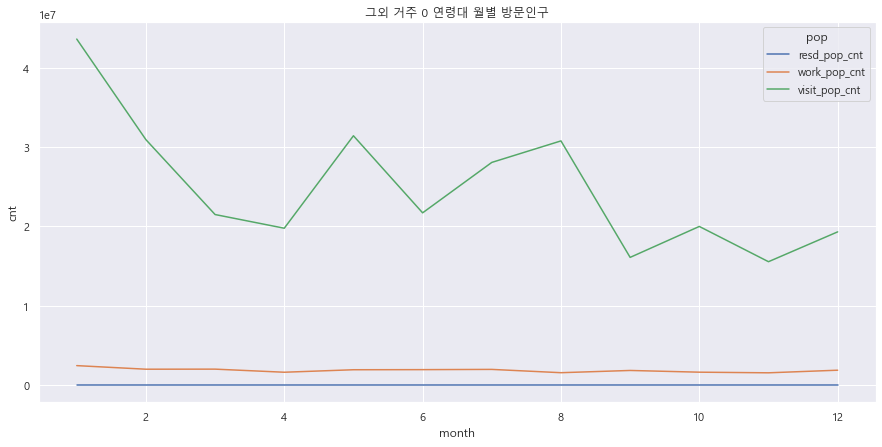

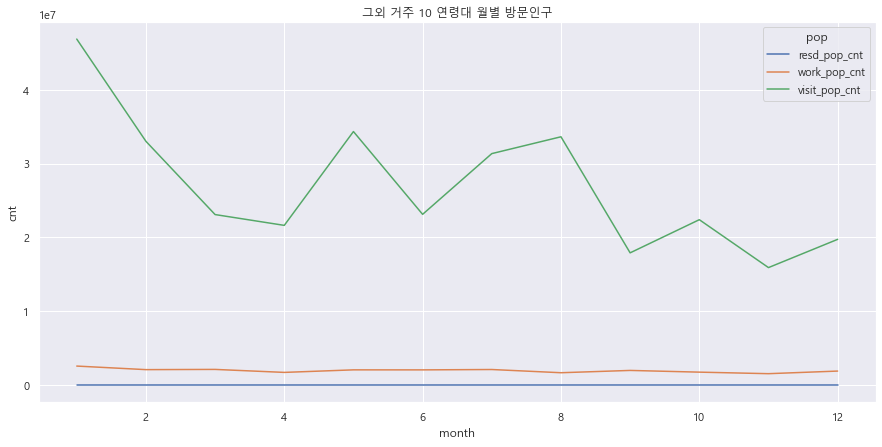

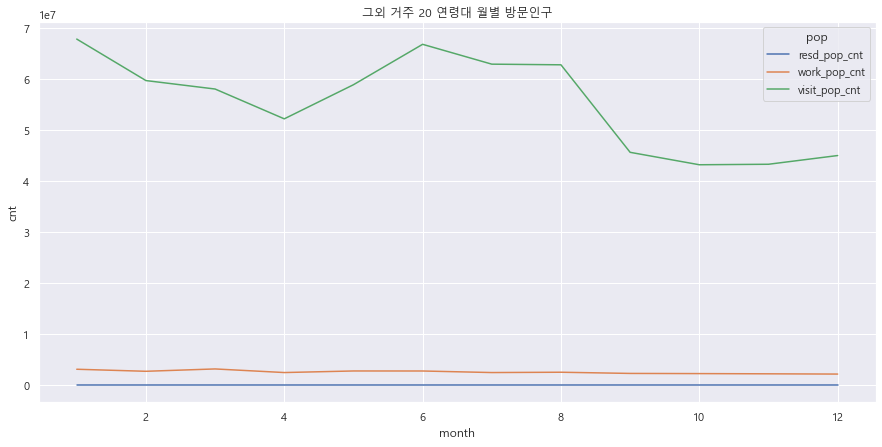

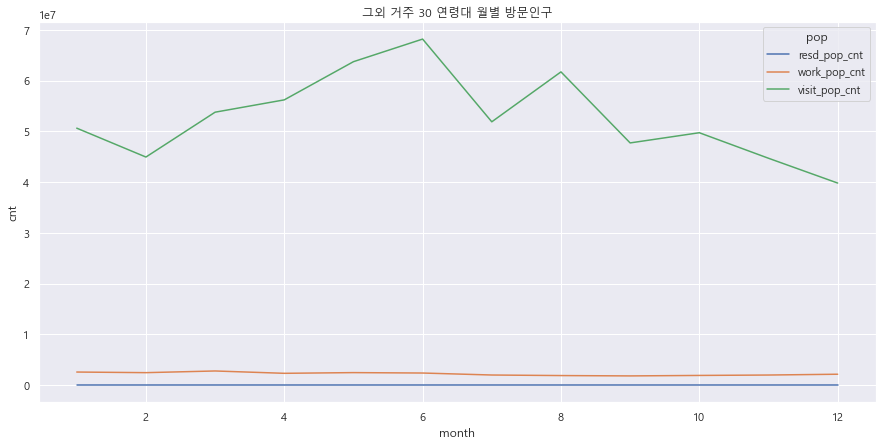

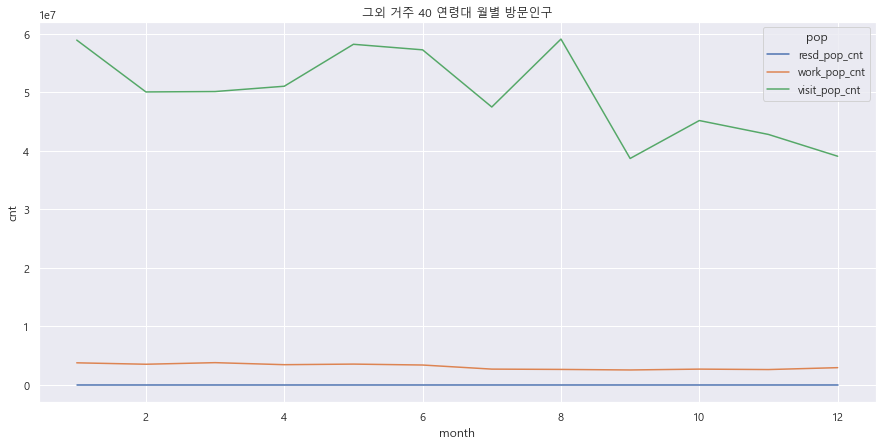

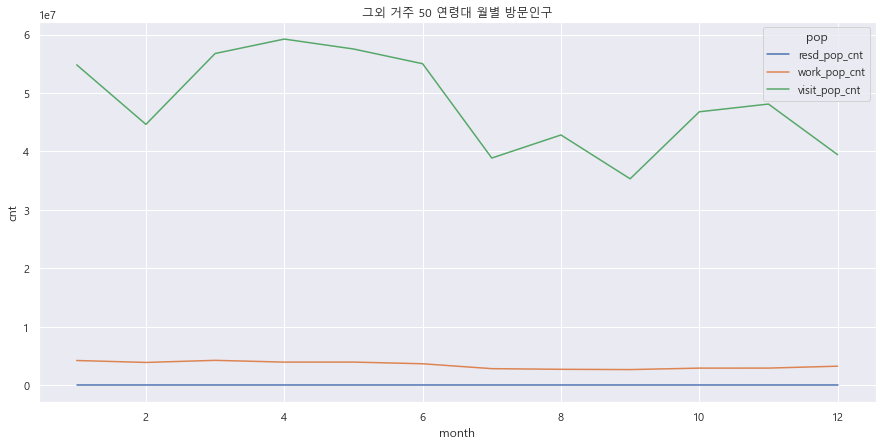

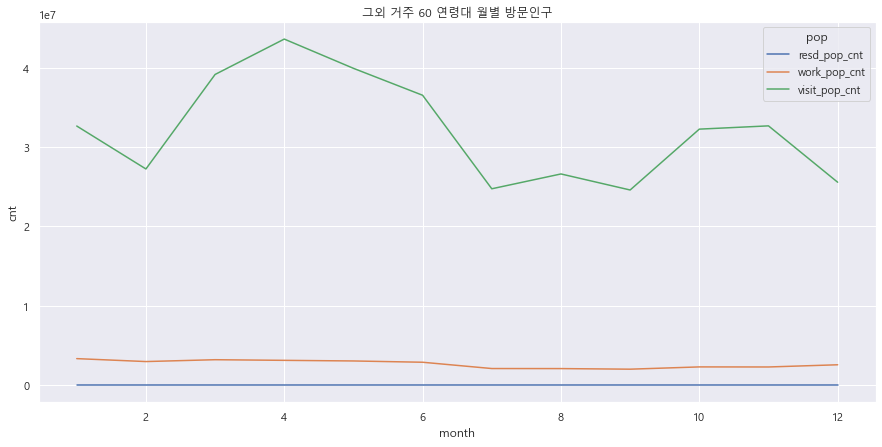

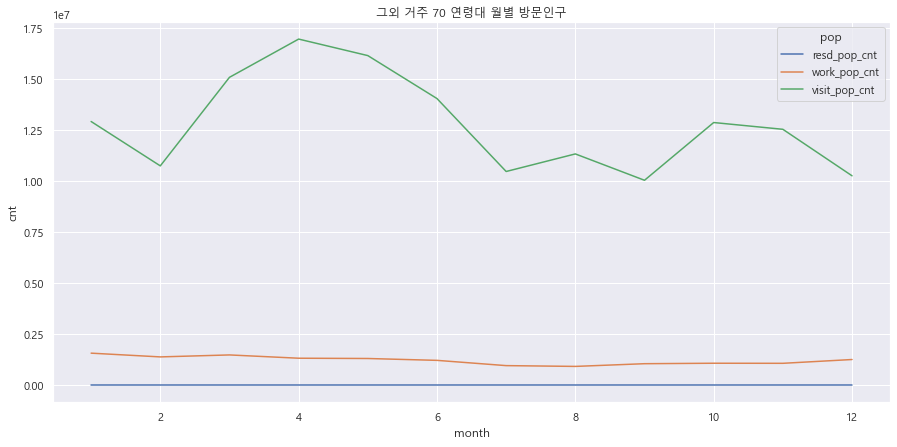

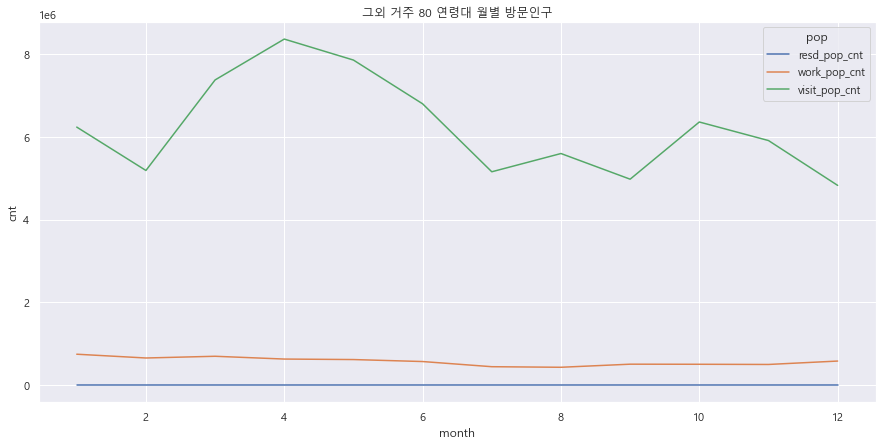

In [117]:
for age in local.age.unique():
    monthly = month_age_cnt[(month_age_cnt['age'] == age) & (month_age_cnt['resd'] == "그외")]
    sns.lineplot(data = monthly,x = 'month',y='cnt',hue='pop')
    plt.title('그외 거주 {} 연령대 월별 방문인구'.format(age))
    plt.show()

성별

In [87]:
month_sex_cnt = local.groupby(['sex','month'])['resd_pop_cnt','work_pop_cnt','visit_pop_cnt'].sum().stack().reset_index()
month_sex_cnt.columns = ['sex','month','pop','cnt']

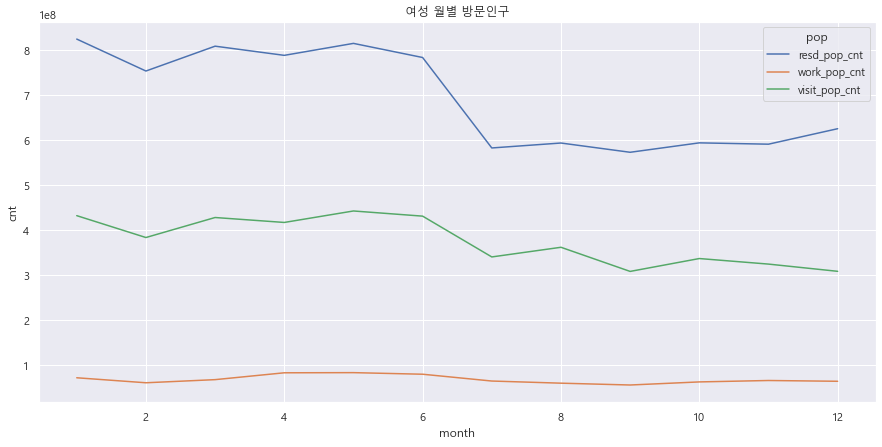

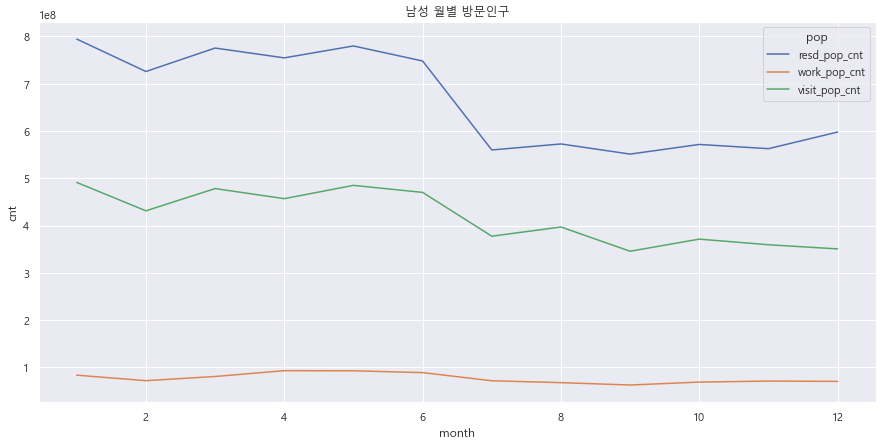

In [88]:
for sex in local.sex.unique():
    monthly = month_sex_cnt[month_sex_cnt['sex'] == sex]
    sns.lineplot(data = monthly,x = 'month',y='cnt',hue='pop')
    plt.title('{} 월별 방문인구'.format(sex))
    plt.show()

## 시간대별 resd / work / visit population

### 시간 당 계절 별 유동인구 추이
- 근무인구보다 방문인구 쪽이 더 늦은 시간에 인구가 줄어든다 => 방문인구에 출퇴근 인구가 포함되어있을 가능성

resd_pop_cnt => 봄>겨울>여름>가을

Text(0.5, 1.0, '시간별 계절 평균 resd_pop_cnt')

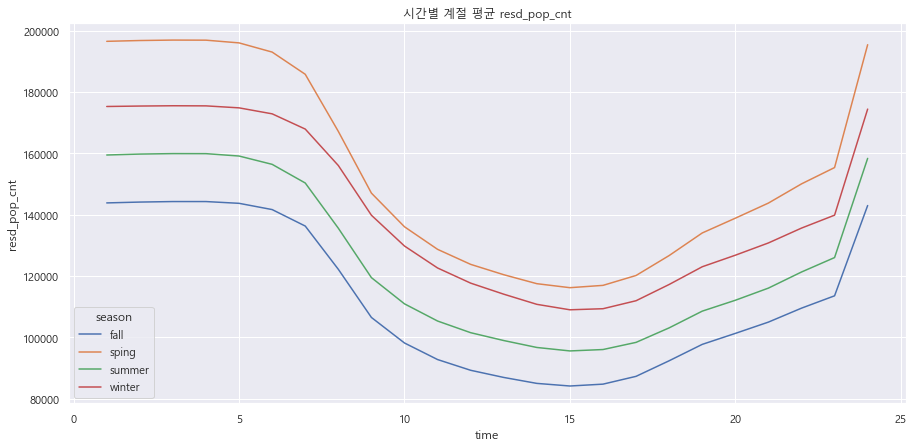

In [24]:
m = local.groupby(['base_date','season','time'])['resd_pop_cnt'].sum().reset_index()
m = m.groupby(['season','time'])['resd_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
sns.lineplot(data=m,x='time',y='resd_pop_cnt',hue='season')
plt.title('시간별 계절 평균 resd_pop_cnt')

Text(0.5, 1.0, '시간별 계절 평균 resd_pop_cnt(제주 거주)')

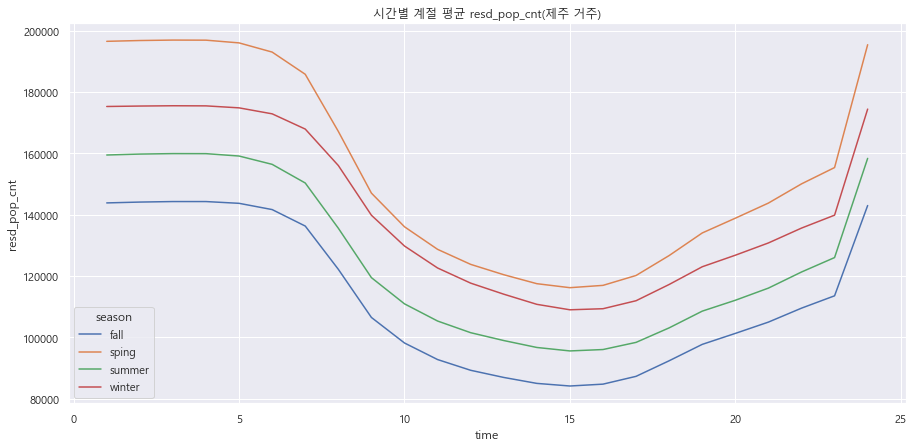

In [25]:
m = local[local['resd'] == '제주'].groupby(['base_date','season','time'])['resd_pop_cnt'].sum().reset_index()
m = m.groupby(['season','time'])['resd_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
sns.lineplot(data=m,x='time',y='resd_pop_cnt',hue='season')
plt.title('시간별 계절 평균 resd_pop_cnt(제주 거주)')

In [26]:
# 시간별 계절 평균 resd_pop_cnt(그외 거주)는 관측 데이터 없음

work_pop_cnt => 제주 거주 : 봄>여름>겨울>가을 / 그외 거주 : 봄>겨울>>여름>가을

Text(0.5, 1.0, '시간별 계절 평균 work_pop_cnt')

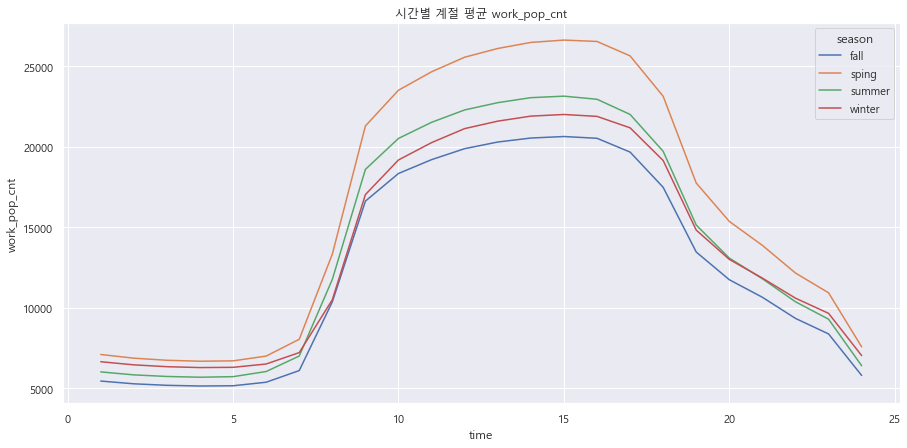

In [27]:
m = local.groupby(['base_date','season','time'])['work_pop_cnt'].sum().reset_index()
m = m.groupby(['season','time'])['work_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
sns.lineplot(data=m,x='time',y='work_pop_cnt',hue='season')
plt.title('시간별 계절 평균 work_pop_cnt')

Text(0.5, 1.0, '시간별 계절 평균 work_pop_cnt(제주 거주)')

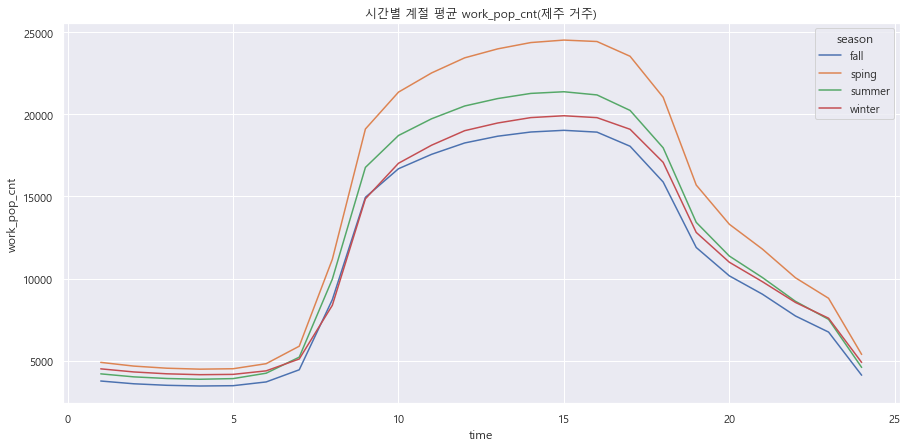

In [28]:
m = local[local['resd'] == '제주'].groupby(['base_date','season','time'])['work_pop_cnt'].sum().reset_index()
m = m.groupby(['season','time'])['work_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
sns.lineplot(data=m,x='time',y='work_pop_cnt',hue='season')
plt.title('시간별 계절 평균 work_pop_cnt(제주 거주)')

Text(0.5, 1.0, '시간별 계절 평균 work_pop_cnt(그외 거주)')

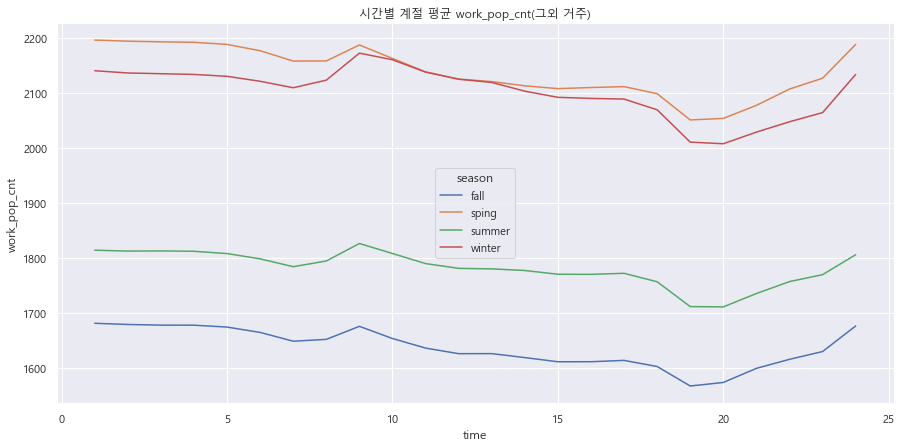

In [29]:
m = local[local['resd'] == '그외'].groupby(['base_date','season','time'])['work_pop_cnt'].sum().reset_index()
m = m.groupby(['season','time'])['work_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
sns.lineplot(data=m,x='time',y='work_pop_cnt',hue='season')
plt.title('시간별 계절 평균 work_pop_cnt(그외 거주)')

visit_pop_cnt => 봄>여름>=겨울>가을

Text(0.5, 1.0, '시간별 계절 평균 visit_pop_cnt')

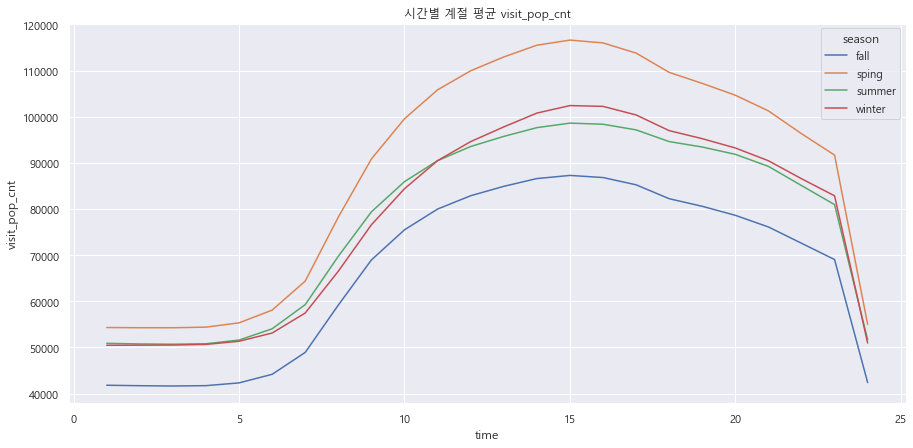

In [30]:
m = local.groupby(['base_date','season','time'])['visit_pop_cnt'].sum().reset_index()
m = m.groupby(['season','time'])['visit_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
sns.lineplot(data=m,x='time',y='visit_pop_cnt',hue='season')
plt.title('시간별 계절 평균 visit_pop_cnt')

Text(0.5, 1.0, '시간별 계절 평균 visit_pop_cnt(제주 거주)')

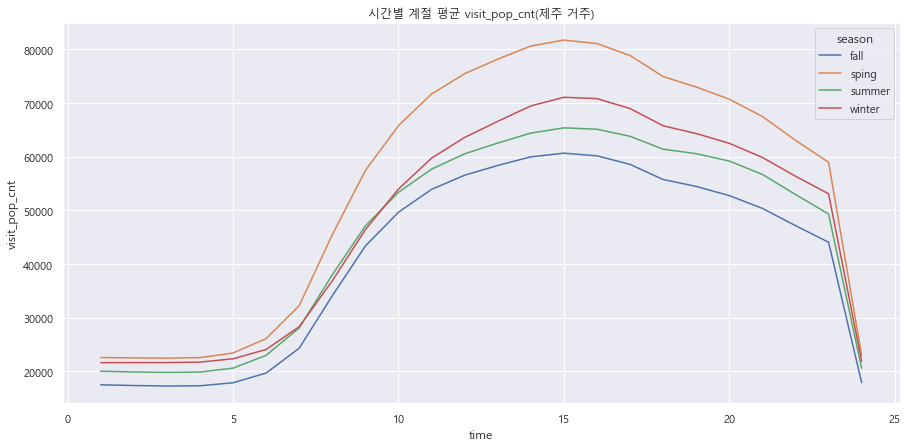

In [31]:
m = local[local['resd'] == '제주'].groupby(['base_date','season','time'])['visit_pop_cnt'].sum().reset_index()
m = m.groupby(['season','time'])['visit_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
sns.lineplot(data=m,x='time',y='visit_pop_cnt',hue='season')
plt.title('시간별 계절 평균 visit_pop_cnt(제주 거주)')

Text(0.5, 1.0, '시간별 계절 평균 visit_pop_cnt(그외 거주)')

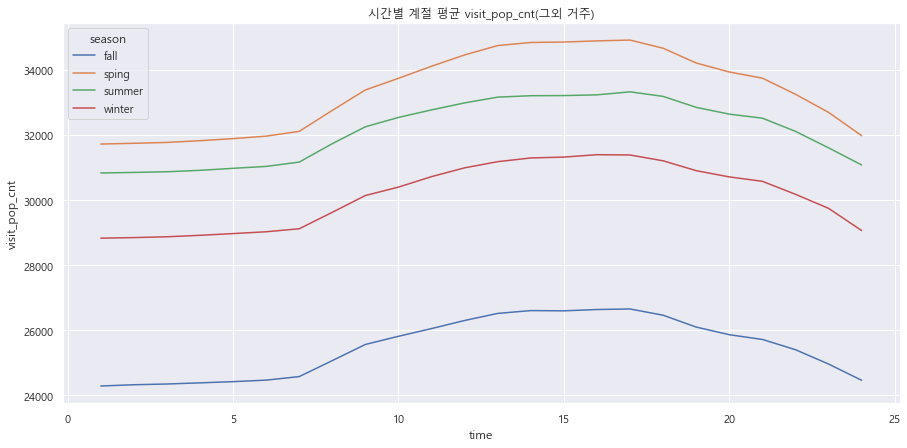

In [32]:
m = local[local['resd'] == '그외'].groupby(['base_date','season','time'])['visit_pop_cnt'].sum().reset_index()
m = m.groupby(['season','time'])['visit_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
sns.lineplot(data=m,x='time',y='visit_pop_cnt',hue='season')
plt.title('시간별 계절 평균 visit_pop_cnt(그외 거주)')

### 시간 당 연령 별 유동인구 추이

Text(0.5, 1.0, '연령별 시간당 평균 resd_pop_cnt')

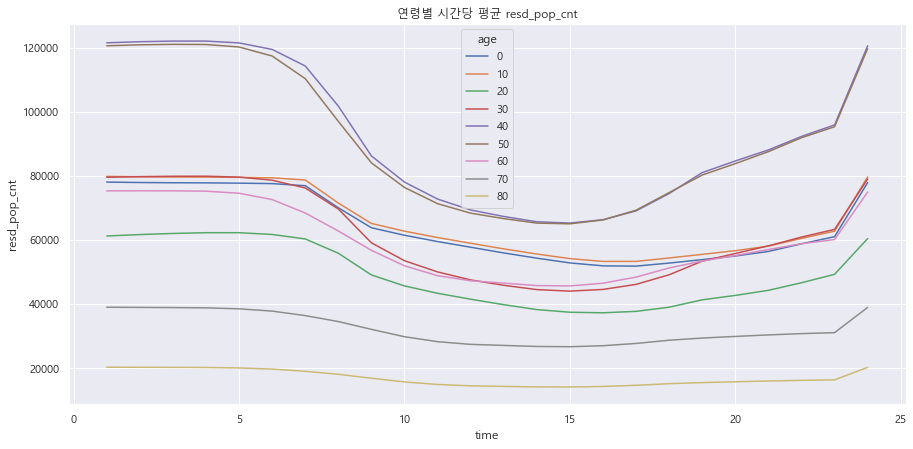

In [33]:
m = local.groupby(['base_date','age','time'])['resd_pop_cnt'].sum().reset_index()
m = m.groupby(['age','time'])['resd_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['age'] = m['age'].astype('category')
sns.lineplot(data=m,x='time',y='resd_pop_cnt',hue='age')
plt.title('연령별 시간당 평균 resd_pop_cnt')

Text(0.5, 1.0, '제주 거주 시간당 연령별 평균 resd_pop_cnt')

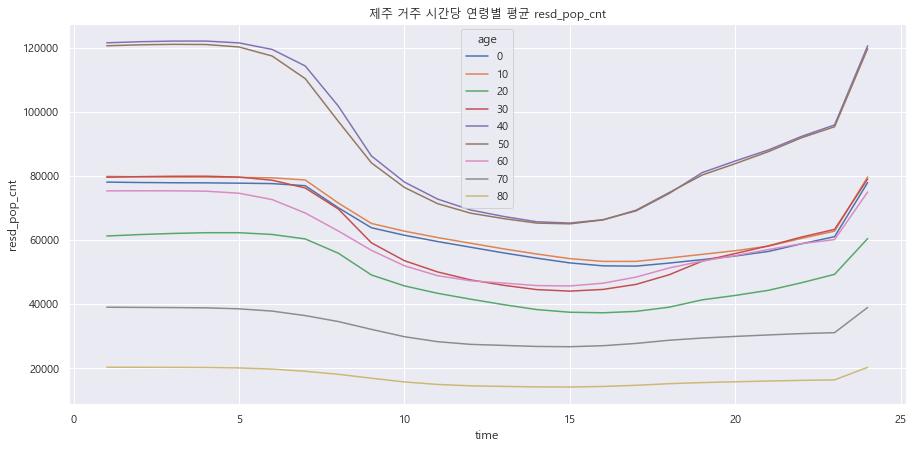

In [34]:
m = local[local['resd'] == '제주'].groupby(['base_date','age','time'])['resd_pop_cnt'].sum().reset_index()
m = m.groupby(['age','time'])['resd_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['age'] = m['age'].astype('category')
sns.lineplot(data=m,x='time',y='resd_pop_cnt',hue='age')
plt.title('제주 거주 시간당 연령별 평균 resd_pop_cnt')

In [35]:
# 그외 거주 시간당 연령별 평균 resd_pop_cnt는 관측값 없음

visit_pop

Text(0.5, 1.0, '연령별 시간당 평균 visit_pop_cnt')

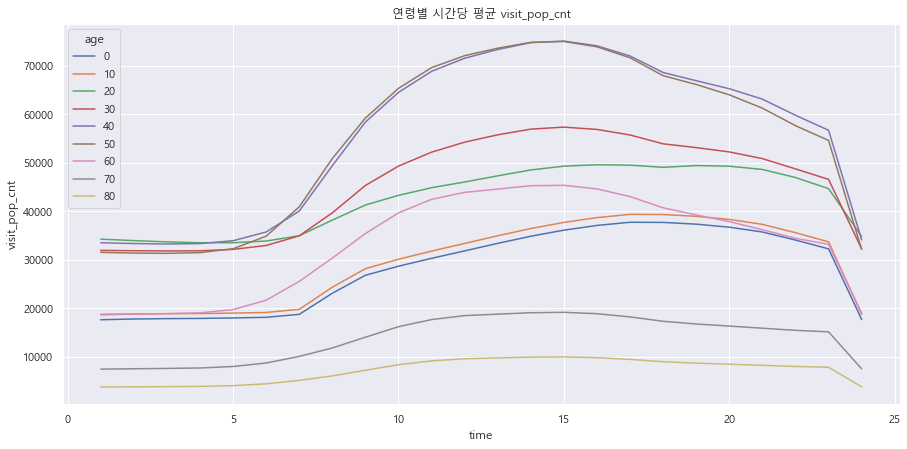

In [36]:
m = local.groupby(['base_date','age','time'])['visit_pop_cnt'].sum().reset_index()
m = m.groupby(['age','time'])['visit_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['age'] = m['age'].astype('category')
sns.lineplot(data=m,x='time',y='visit_pop_cnt',hue='age')
plt.title('연령별 시간당 평균 visit_pop_cnt')

Text(0.5, 1.0, '제주 거주 시간당 연령별 평균 visit_pop_cnt')

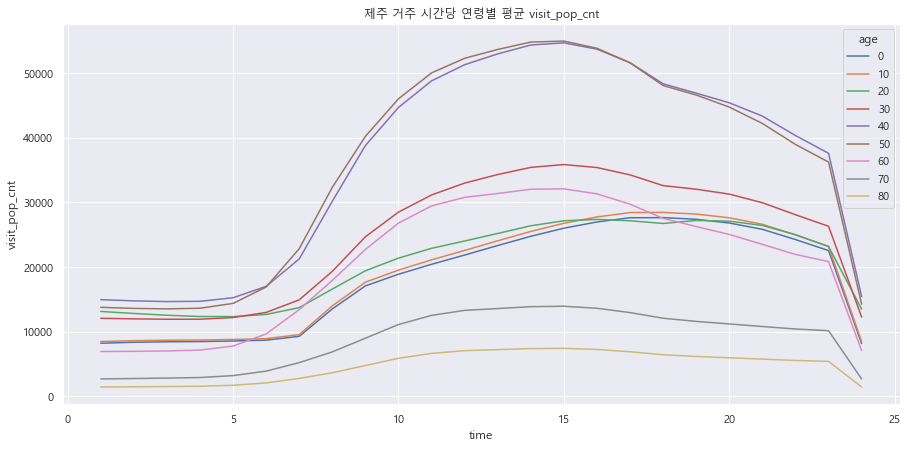

In [37]:
m = local[local['resd'] == '제주'].groupby(['base_date','age','time'])['visit_pop_cnt'].sum().reset_index()
m = m.groupby(['age','time'])['visit_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['age'] = m['age'].astype('category')
sns.lineplot(data=m,x='time',y='visit_pop_cnt',hue='age')
plt.title('제주 거주 시간당 연령별 평균 visit_pop_cnt')

Text(0.5, 1.0, '그외 거주 시간당 연령별 평균 visit_pop_cnt')

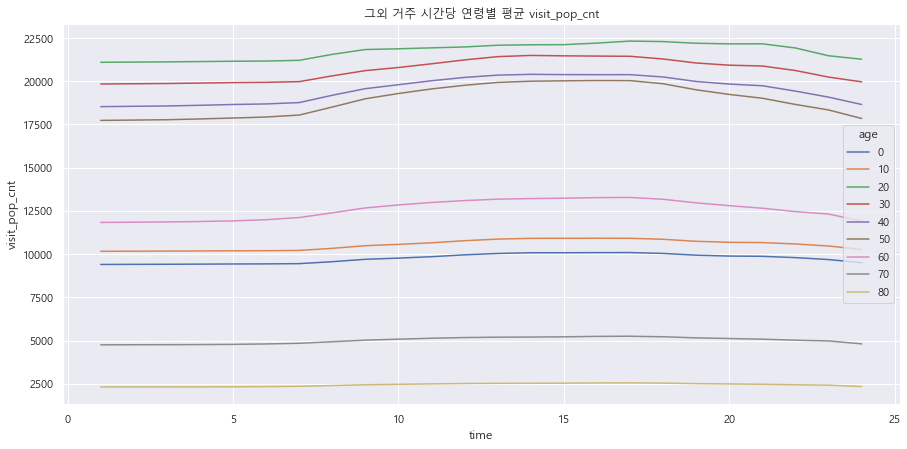

In [38]:
m = local[local['resd'] == '그외'].groupby(['base_date','age','time'])['visit_pop_cnt'].sum().reset_index()
m = m.groupby(['age','time'])['visit_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['age'] = m['age'].astype('category')
sns.lineplot(data=m,x='time',y='visit_pop_cnt',hue='age')
plt.title('그외 거주 시간당 연령별 평균 visit_pop_cnt')

work_pop => 중년(40,50)>청년(20,30)>청소년(0,10)>노인(60~80)<br>
* 그외 거주에서는 시간별 근무인구가 60대가 높아짐

Text(0.5, 1.0, '연령별 시간당 평균 work_pop_cnt')

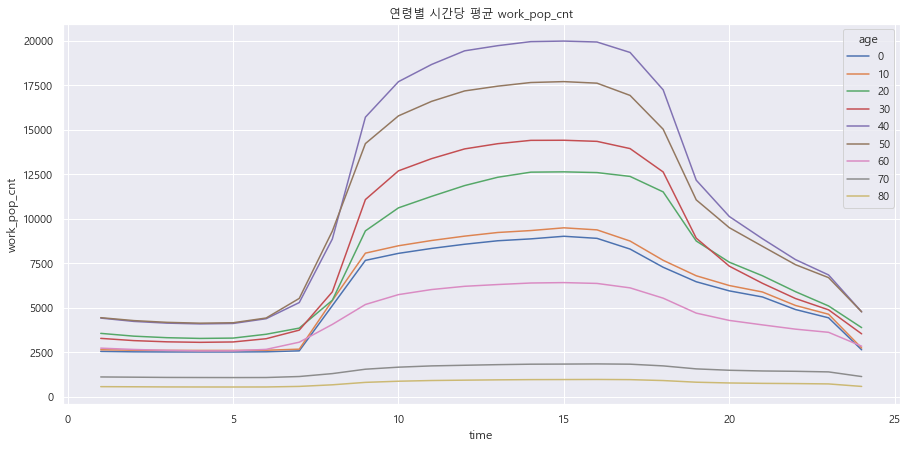

In [39]:
m = local.groupby(['base_date','age','time'])['work_pop_cnt'].sum().reset_index()
m = m.groupby(['age','time'])['work_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['age'] = m['age'].astype('category')
sns.lineplot(data=m,x='time',y='work_pop_cnt',hue='age')
plt.title('연령별 시간당 평균 work_pop_cnt')

Text(0.5, 1.0, '제주 거주 시간당 연령별 평균 work_pop_cnt')

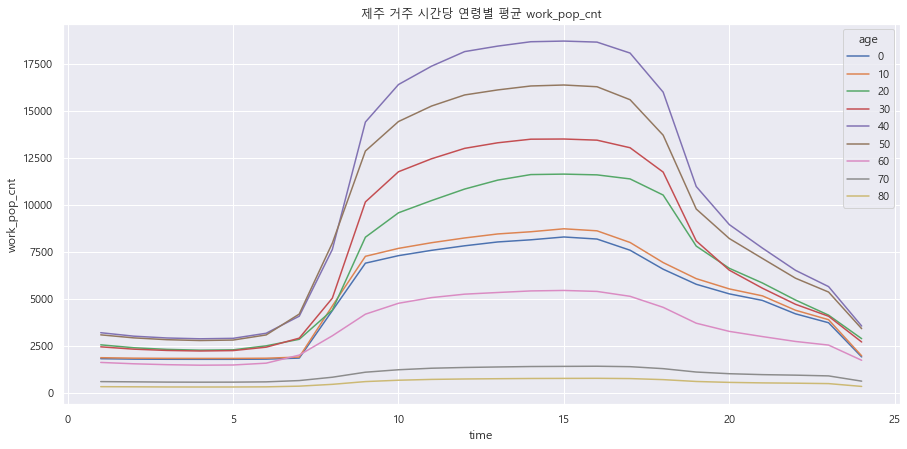

In [40]:
m = local[local['resd'] == '제주'].groupby(['base_date','age','time'])['work_pop_cnt'].sum().reset_index()
m = m.groupby(['age','time'])['work_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['age'] = m['age'].astype('category')
sns.lineplot(data=m,x='time',y='work_pop_cnt',hue='age')
plt.title('제주 거주 시간당 연령별 평균 work_pop_cnt')

Text(0.5, 1.0, '그외 거주 시간당 연령별 평균 work_pop_cnt')

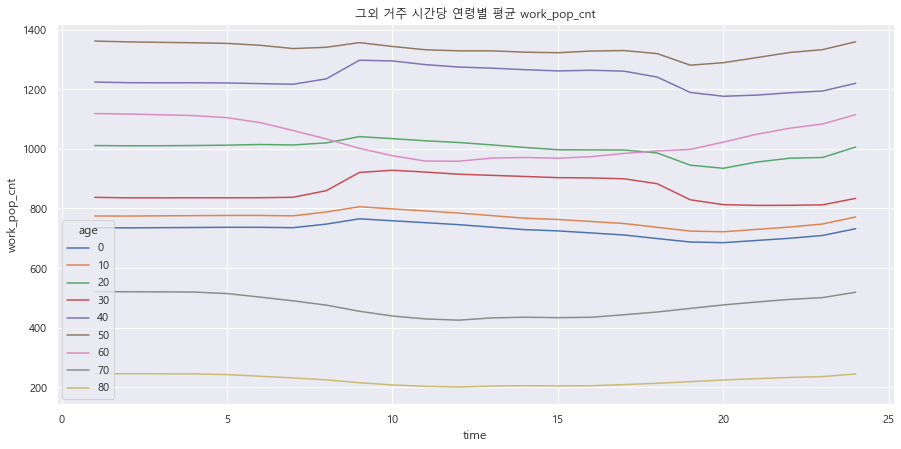

In [41]:
m = local[local['resd'] == '그외'].groupby(['base_date','age','time'])['work_pop_cnt'].sum().reset_index()
m = m.groupby(['age','time'])['work_pop_cnt'].mean().reset_index()
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['age'] = m['age'].astype('category')
sns.lineplot(data=m,x='time',y='work_pop_cnt',hue='age')
plt.title('그외 거주 시간당 연령별 평균 work_pop_cnt')

### 시간 당 성별 유동인구 추이

In [42]:
m = local.groupby(['base_date','sex','resd','time'])['resd_pop_cnt', 'work_pop_cnt','visit_pop_cnt'].sum().reset_index()
m = m.groupby(['sex','resd','time'])['resd_pop_cnt', 'work_pop_cnt','visit_pop_cnt'].mean().stack().reset_index()

m.columns = ['sex','resd','time','pop','cnt']
m['time'] = m['time'].astype('category')
#m['month'] = m['month'].astype('category')
m['sex'] = m['sex'].astype('category')

[Text(0.5, 1.0, '전 거주 지역 남성 시간당 유동인구')]

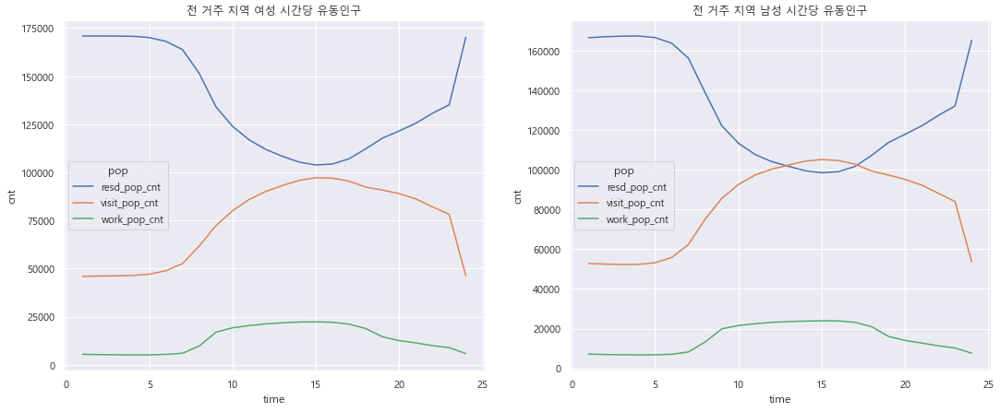

In [43]:
# 전 거주지역 성별 시간당 유동인구
figure, (ax1,ax2) = plt.subplots(ncols=2)
figure.set_size_inches(18,7)
sns.lineplot(data = m[m['sex'] == '여성'].groupby(['sex','time','pop'])['cnt'].mean().reset_index(),x = 'time',y='cnt',hue='pop',ax = ax1)
sns.lineplot(data = m[m['sex'] == '남성'].groupby(['sex','time','pop'])['cnt'].mean().reset_index(),x = 'time',y='cnt',hue='pop',ax = ax2)
ax1.set(title="전 거주 지역 여성 시간당 유동인구")
ax2.set(title="전 거주 지역 남성 시간당 유동인구")

[Text(0.5, 1.0, '제주 거주 남성 시간당 유동인구')]

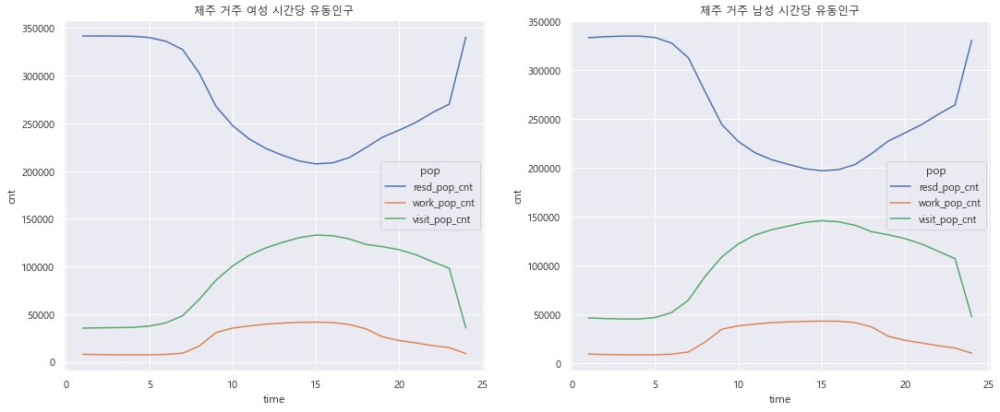

In [44]:
# 제주거주 성별 시간당 유동인구
figure, (ax1,ax2) = plt.subplots(ncols=2)
figure.set_size_inches(18,7)
sns.lineplot(data = m[(m['sex'] == '여성') & (m['resd'] == '제주')].reset_index(drop=True),x = 'time',y='cnt',hue='pop',ax = ax1)
sns.lineplot(data = m[(m['sex'] == '남성') & (m['resd'] == '제주')].reset_index(drop=True),x = 'time',y='cnt',hue='pop',ax = ax2)
ax1.set(title="제주 거주 여성 시간당 유동인구")
ax2.set(title="제주 거주 남성 시간당 유동인구")

[Text(0.5, 1.0, '그외 거주 남성 시간당 유동인구')]

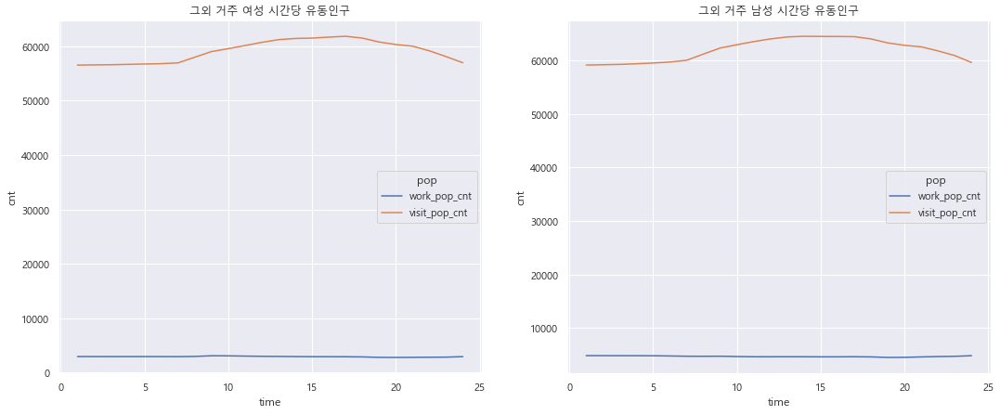

In [45]:
# 그외 거주 성별 시간당 유동인구
figure, (ax1,ax2) = plt.subplots(ncols=2)
figure.set_size_inches(18,7)
sns.lineplot(data = m[(m['sex'] == '여성') & (m['resd'] == '그외') & (m['pop'] != 'resd_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='pop',ax = ax1)
sns.lineplot(data = m[(m['sex'] == '남성') & (m['resd'] == '그외') & (m['pop'] != 'resd_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='pop',ax = ax2)
ax1.set(title="그외 거주 여성 시간당 유동인구")
ax2.set(title="그외 거주 남성 시간당 유동인구")

## TOP10 행정구역 선정
- 세 가지의 인구 유형 별 유동인구 TOP10 행정동을 각각 선별
- 보통 유동인구 유형별 전체 인구 TOP10을 따라가며, 인구특성별로 보면 하위권 지역은 잘 바뀌는데 상위권은 거의 고정

In [46]:
loc_cnt = local.groupby(['emd_nm'])['visit_pop_cnt','work_pop_cnt', 'resd_pop_cnt'].sum().reset_index()

# 인구 성격별 유동인구 top10 지역 추출
visit_top10 = loc_cnt.sort_values(ascending=False,by=['visit_pop_cnt'])[:10]
work_top10 = loc_cnt.sort_values(ascending=False,by=['work_pop_cnt'])[:10]
resd_top10 = loc_cnt.sort_values(ascending=False,by=['resd_pop_cnt'])[:10]

<AxesSubplot:title={'center':'방문인구 top10 지역'}, ylabel='emd_nm'>

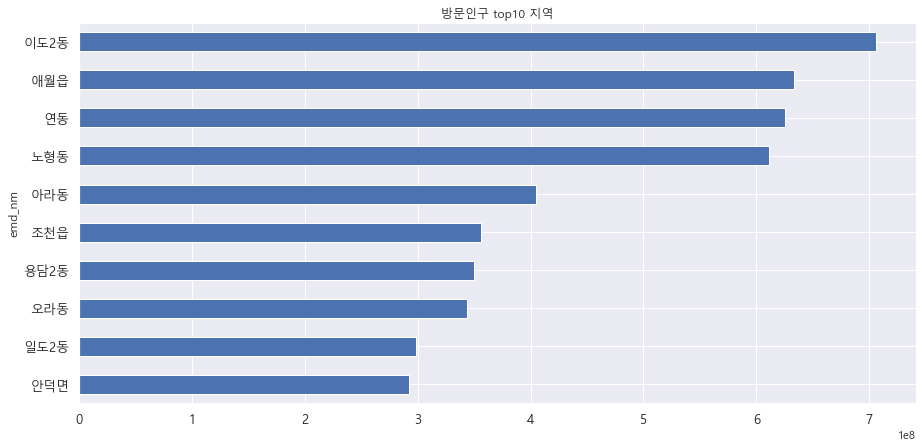

In [47]:
visit_top10.set_index('emd_nm').sort_values(by = 'visit_pop_cnt')['visit_pop_cnt'].plot(kind='barh',title = '방문인구 top10 지역', fontsize=13)

<AxesSubplot:title={'center':'근무 인구 top10 지역'}, ylabel='emd_nm'>

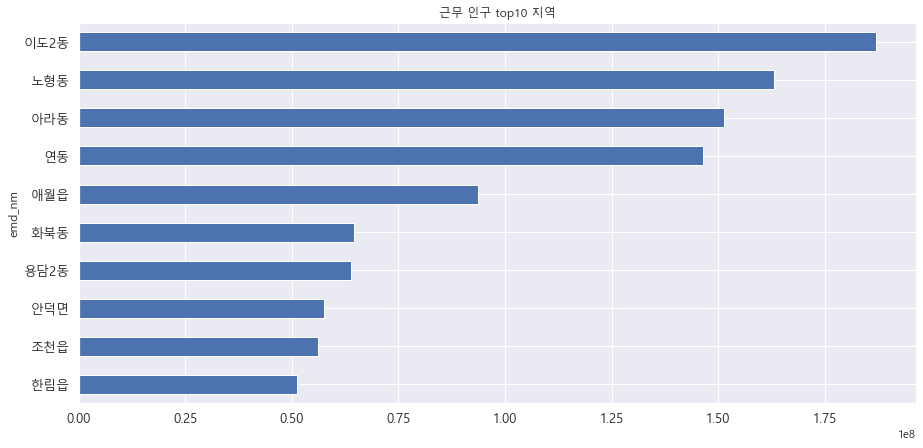

In [48]:
work_top10.set_index('emd_nm').sort_values(by = 'work_pop_cnt')['work_pop_cnt'].plot(kind='barh',title = '근무 인구 top10 지역', fontsize=13)

<AxesSubplot:title={'center':'거주인구 top10 지역'}, ylabel='emd_nm'>

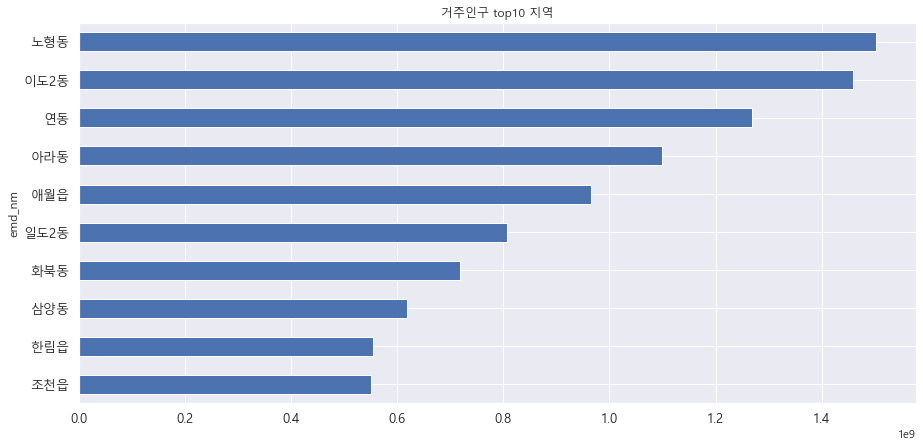

In [49]:
resd_top10.set_index('emd_nm').sort_values(by = 'resd_pop_cnt')['resd_pop_cnt'].plot(kind='barh',title = '거주인구 top10 지역', fontsize=13)

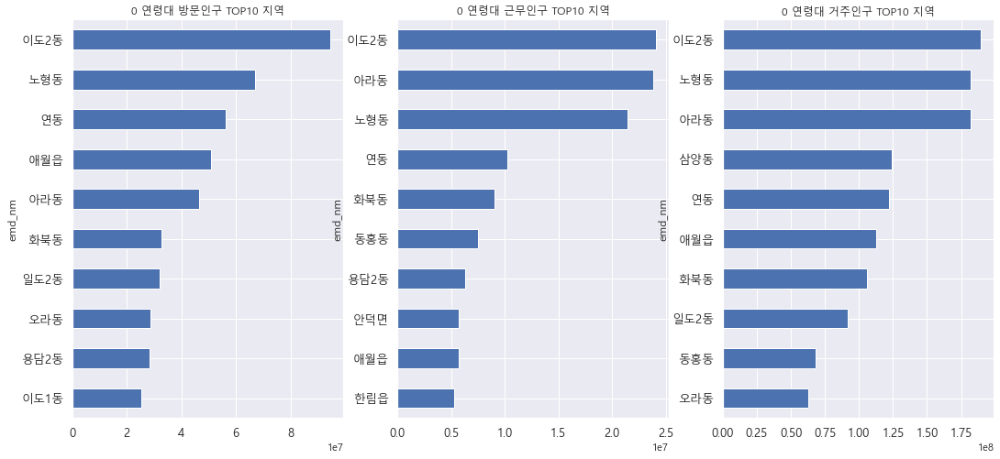

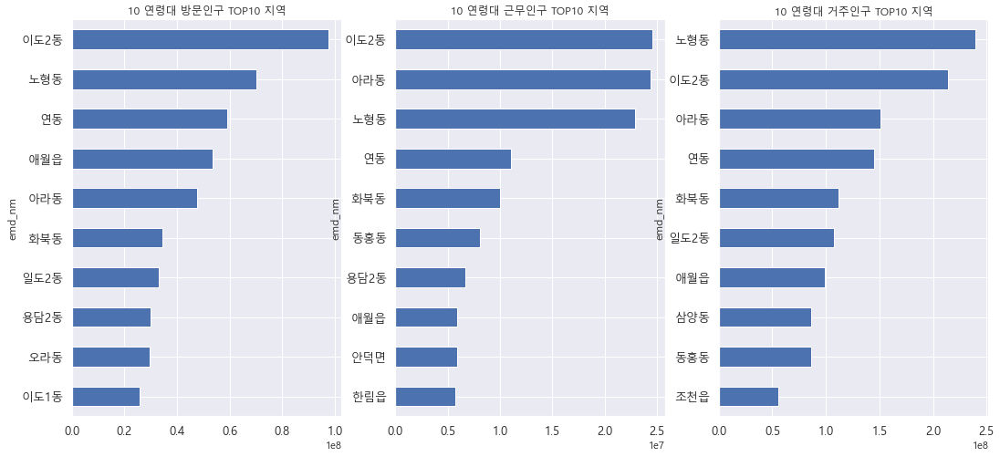

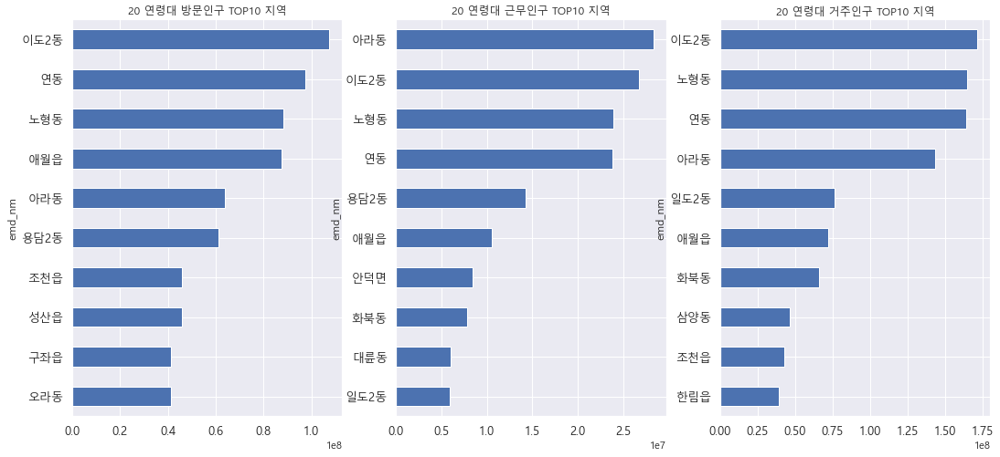

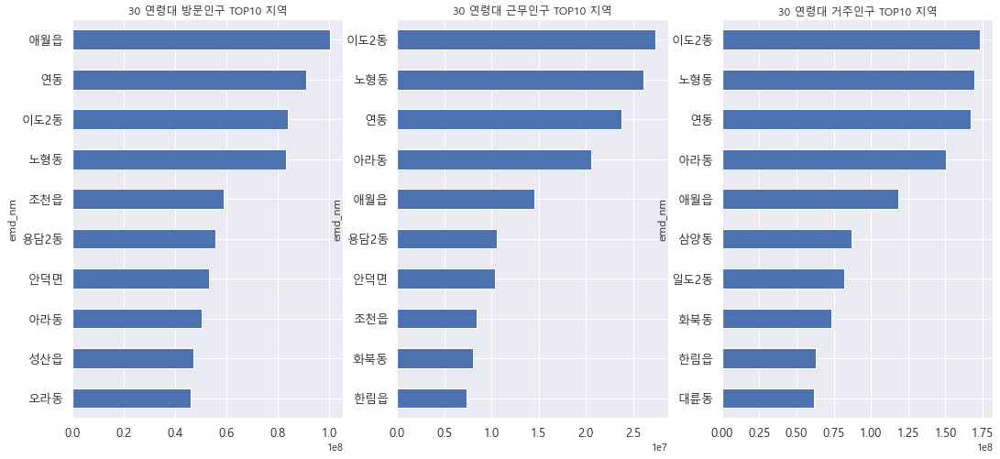

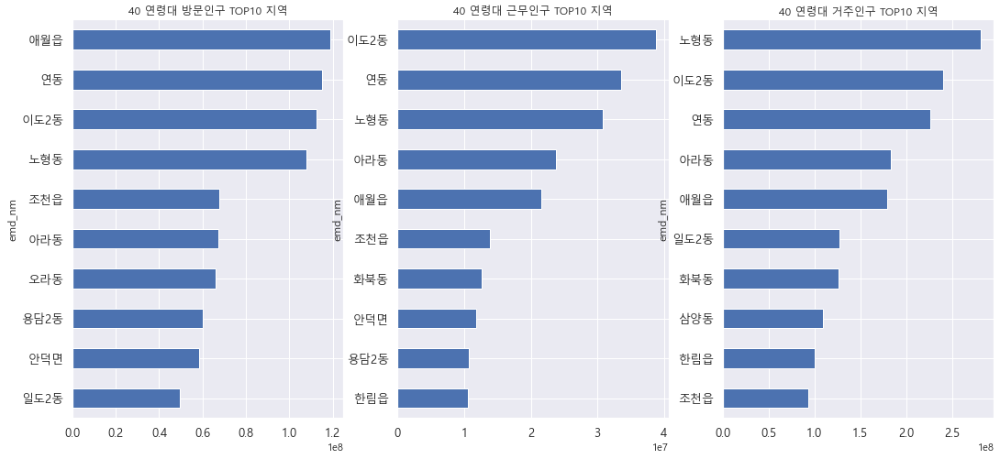

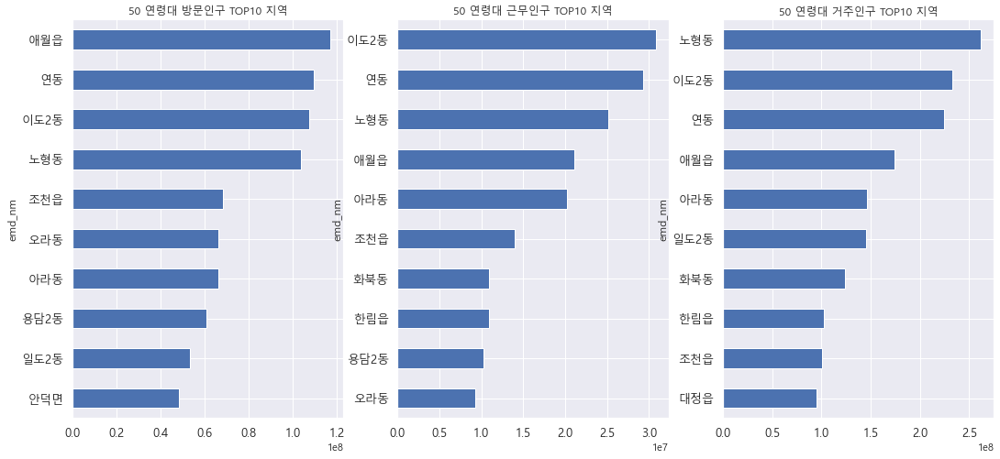

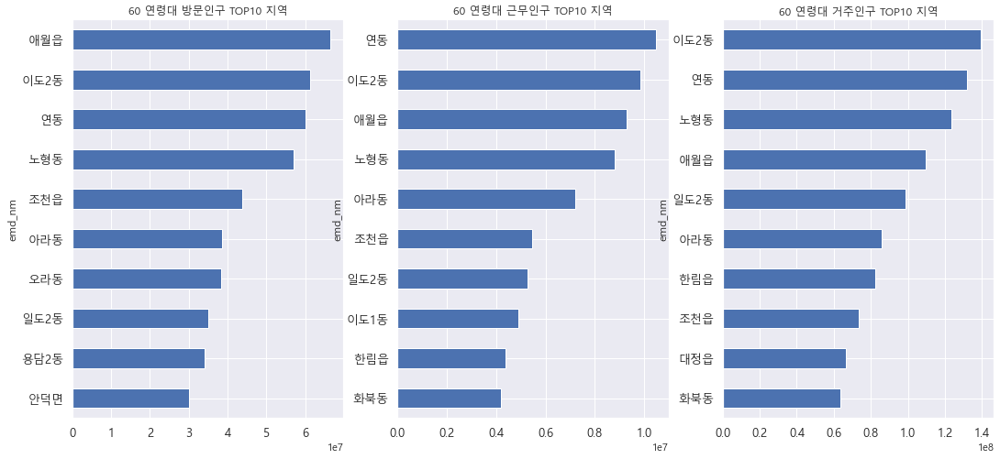

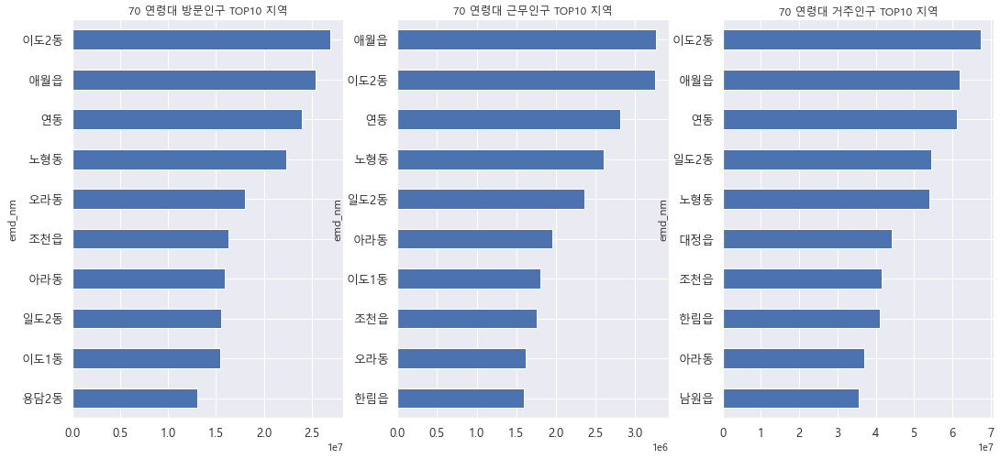

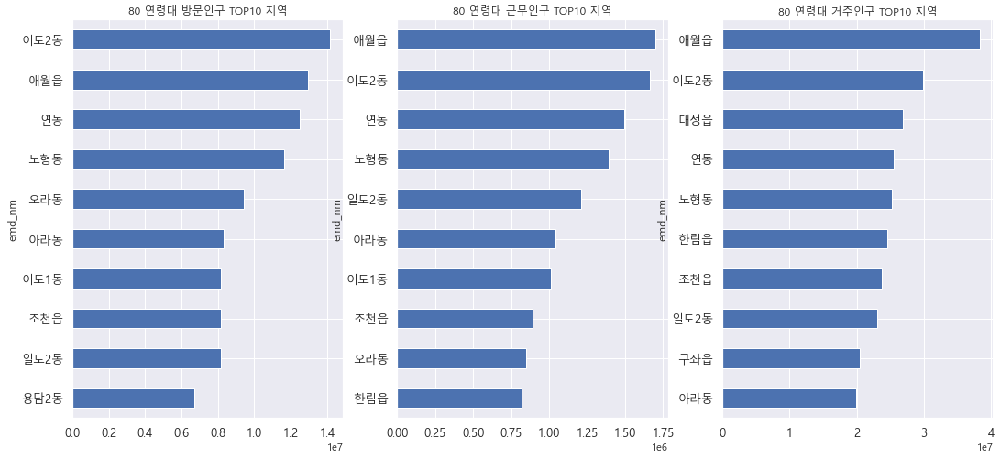

In [50]:
for age in local.age.unique():
    age_cnt = local[local['age'] == age].groupby(['emd_nm'])['visit_pop_cnt','work_pop_cnt', 'resd_pop_cnt'].sum().reset_index()

    # 인구 성격별 유동인구 top10 지역 추출
    visit_top10 = age_cnt.sort_values(ascending=False,by=['visit_pop_cnt'])[:10]
    work_top10 = age_cnt.sort_values(ascending=False,by=['work_pop_cnt'])[:10]
    resd_top10 = age_cnt.sort_values(ascending=False,by=['resd_pop_cnt'])[:10]
    
    figure, (ax1,ax2,ax3) = plt.subplots(ncols=3)
    figure.set_size_inches(18,8)
    
    visit_top10.set_index('emd_nm').sort_values(by = 'visit_pop_cnt')['visit_pop_cnt'].plot(kind='barh',title = '방문인구 top10 지역', fontsize=13,ax=ax1)
    work_top10.set_index('emd_nm').sort_values(by = 'work_pop_cnt')['work_pop_cnt'].plot(kind='barh',title = '근무 인구 top10 지역', fontsize=13,ax=ax2)
    resd_top10.set_index('emd_nm').sort_values(by = 'resd_pop_cnt')['resd_pop_cnt'].plot(kind='barh',title = '거주인구 top10 지역', fontsize=13,ax=ax3)
    
    ax1.set(title='{} 연령대 방문인구 TOP10 지역'.format(age))
    ax2.set(title='{} 연령대 근무인구 TOP10 지역'.format(age))
    ax3.set(title='{} 연령대 거주인구 TOP10 지역'.format(age))

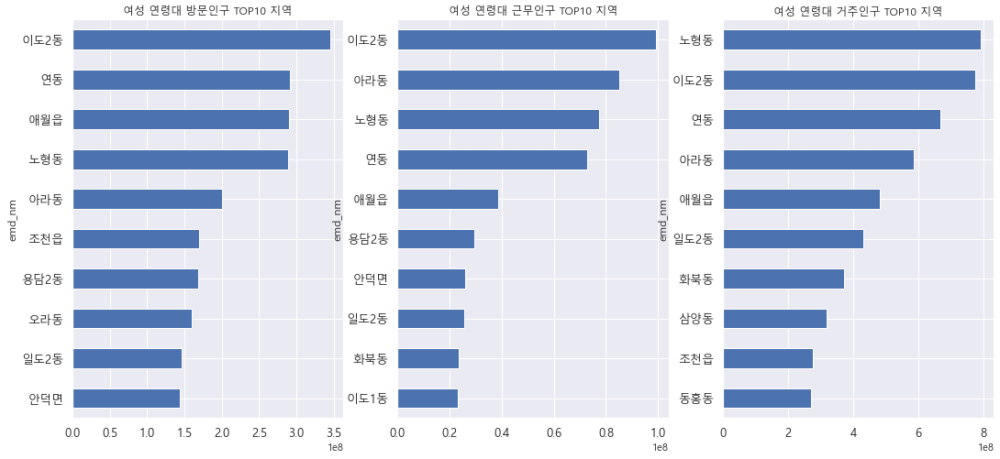

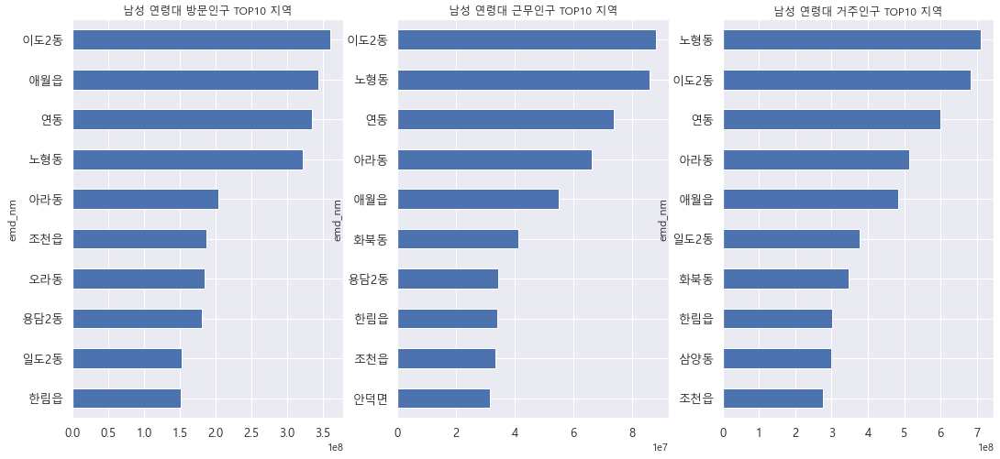

In [51]:
for sex in local.sex.unique():
    sex_cnt = local[local['sex'] == sex].groupby(['emd_nm'])['visit_pop_cnt','work_pop_cnt', 'resd_pop_cnt'].sum().reset_index()

    # 인구 성격별 유동인구 top10 지역 추출
    visit_top10 = sex_cnt.sort_values(ascending=False,by=['visit_pop_cnt'])[:10]
    work_top10 = sex_cnt.sort_values(ascending=False,by=['work_pop_cnt'])[:10]
    resd_top10 = sex_cnt.sort_values(ascending=False,by=['resd_pop_cnt'])[:10]
    
    figure, (ax1,ax2,ax3) = plt.subplots(ncols=3)
    figure.set_size_inches(18,8)
    
    visit_top10.set_index('emd_nm').sort_values(by = 'visit_pop_cnt')['visit_pop_cnt'].plot(kind='barh',title = '방문인구 top10 지역', fontsize=13,ax=ax1)
    work_top10.set_index('emd_nm').sort_values(by = 'work_pop_cnt')['work_pop_cnt'].plot(kind='barh',title = '근무 인구 top10 지역', fontsize=13,ax=ax2)
    resd_top10.set_index('emd_nm').sort_values(by = 'resd_pop_cnt')['resd_pop_cnt'].plot(kind='barh',title = '거주인구 top10 지역', fontsize=13,ax=ax3)
    
    ax1.set(title='{} 연령대 방문인구 TOP10 지역'.format(sex))
    ax2.set(title='{} 연령대 근무인구 TOP10 지역'.format(sex))
    ax3.set(title='{} 연령대 거주인구 TOP10 지역'.format(sex))

### 전체기간 동안 유동인구 TOP10(visit, work, resd) 추이 확인
- 각 유동인구 TOP10 행정동만 살펴본 거지만 거주인구, 방문인구, 근무인구의 패턴이 나뉘는 것 같음 => 유형화가 가능할까?

In [167]:
V = local[local['emd_nm'].isin(visit_top10.emd_nm)].groupby(['emd_nm','base_date','resd'])['resd_pop_cnt', 'work_pop_cnt', 'visit_pop_cnt'].sum().stack().reset_index()
W = local[local['emd_nm'].isin(work_top10.emd_nm)].groupby(['emd_nm','base_date','resd'])['resd_pop_cnt', 'work_pop_cnt', 'visit_pop_cnt'].sum().stack().reset_index()
R = local[local['emd_nm'].isin(resd_top10.emd_nm)].groupby(['emd_nm','base_date','resd'])['resd_pop_cnt', 'work_pop_cnt', 'visit_pop_cnt'].sum().stack().reset_index()

V.columns = ['emd_nm','base_date','resd','pop','cnt']
W.columns = ['emd_nm','base_date','resd','pop','cnt']
R.columns = ['emd_nm','base_date','resd','pop','cnt']

Visit TOP10

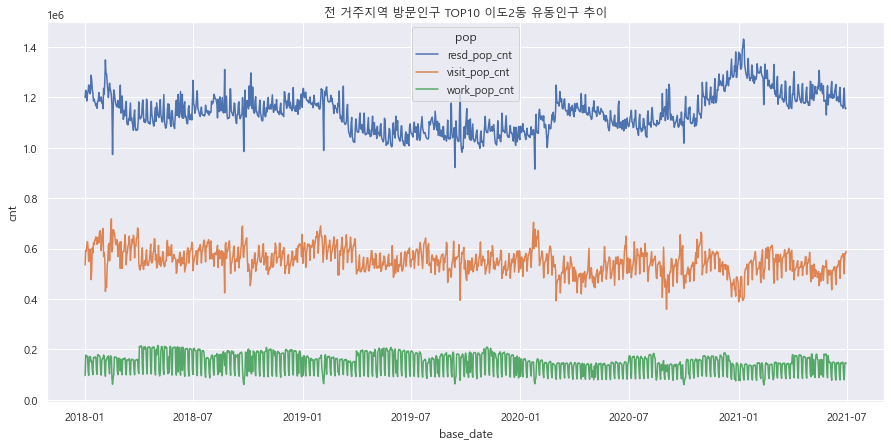

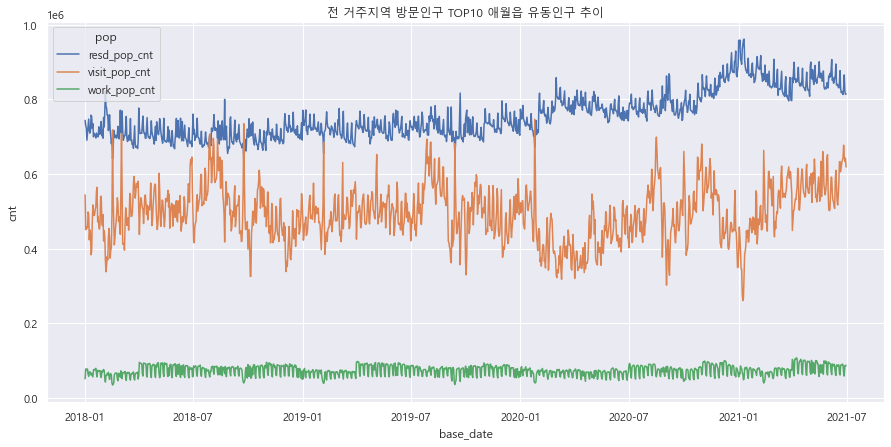

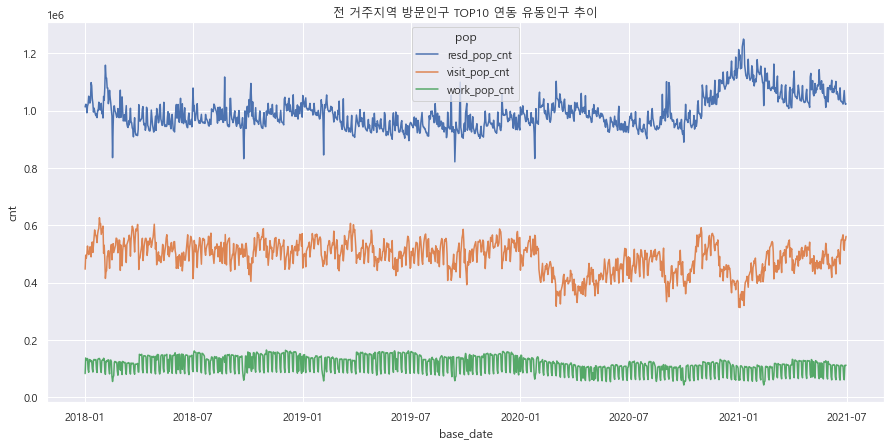

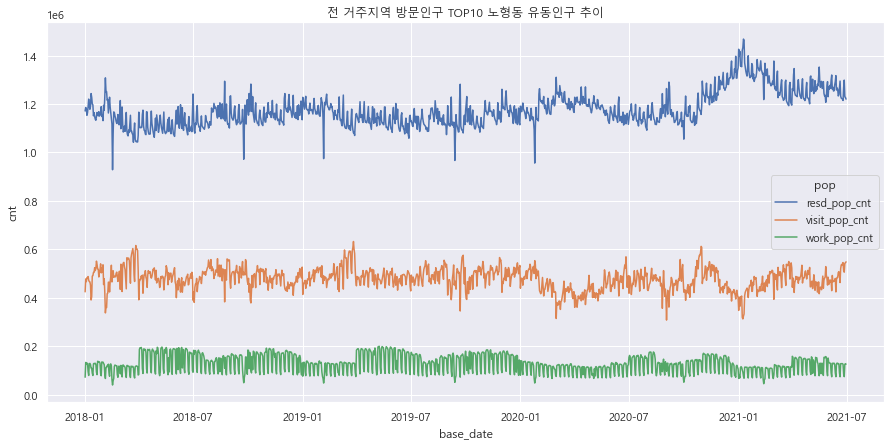

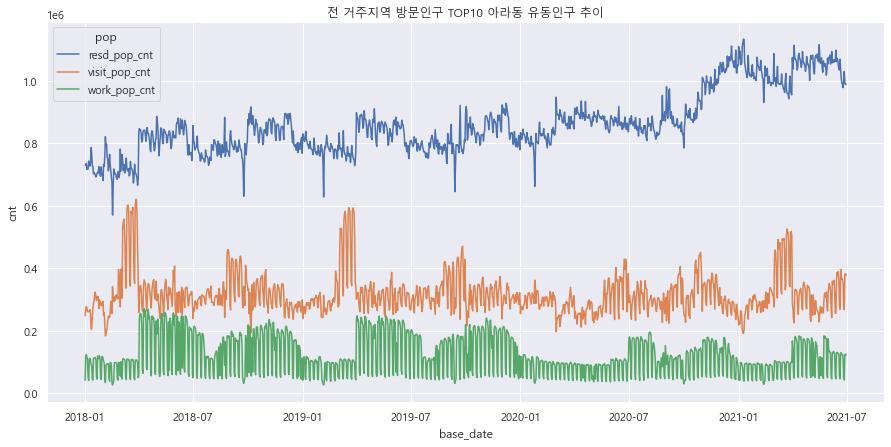

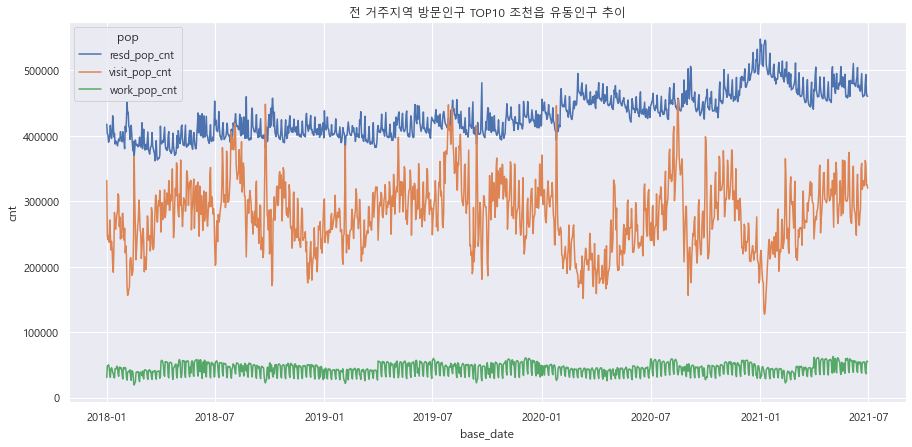

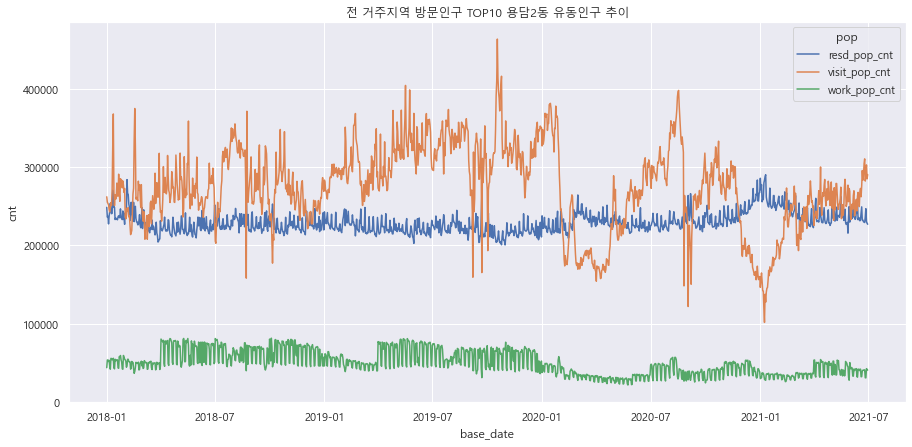

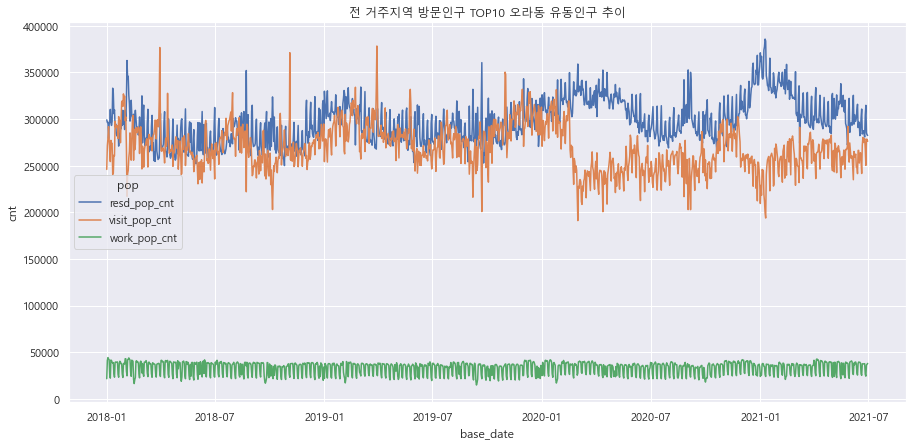

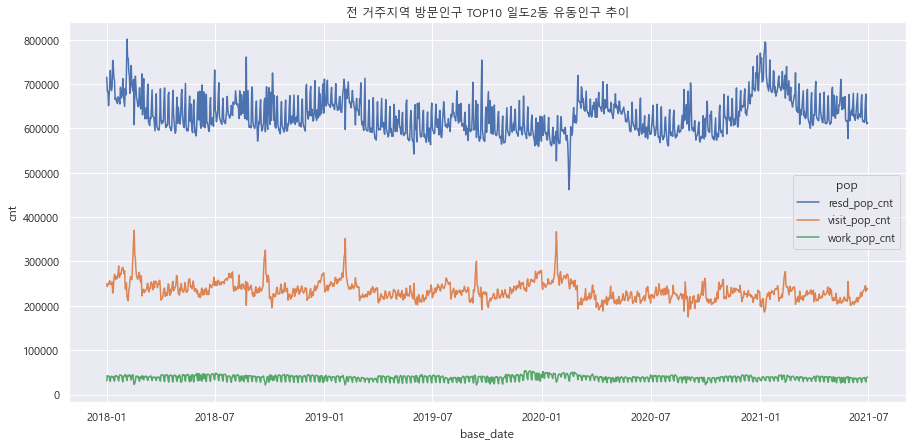

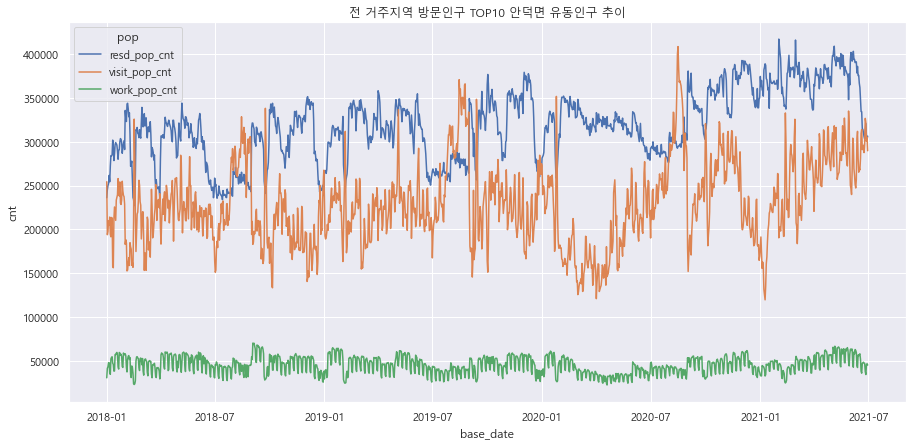

In [168]:
for nm in visit_top10['emd_nm']:
    sns.lineplot(data=V[V['emd_nm'] == nm].groupby(['emd_nm','base_date','pop'])['cnt'].sum().reset_index(),x='base_date',y='cnt',hue='pop')
    plt.title('전 거주지역 방문인구 TOP10 {} 유동인구 추이'.format(nm))
    plt.show()

Work TOP10

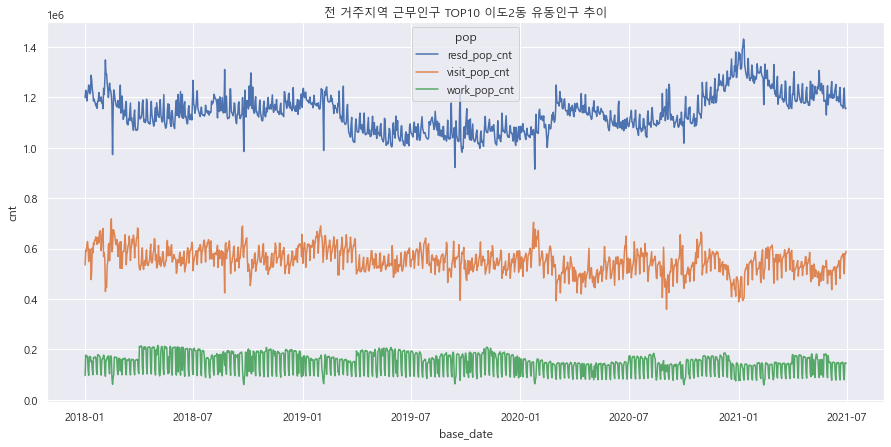

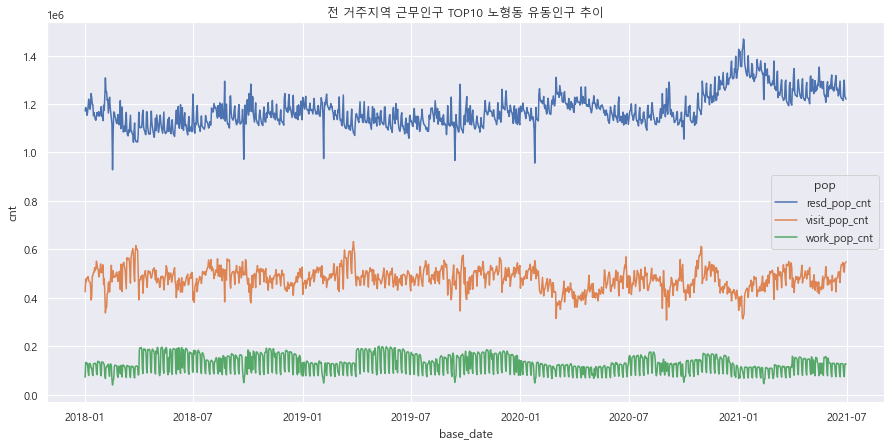

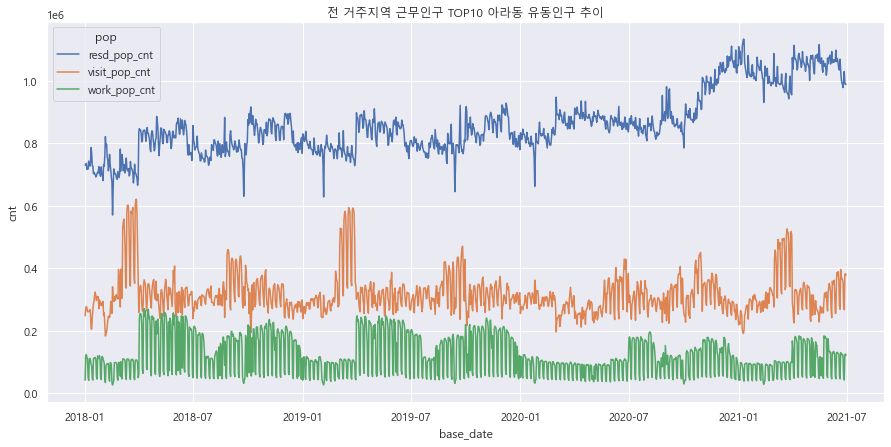

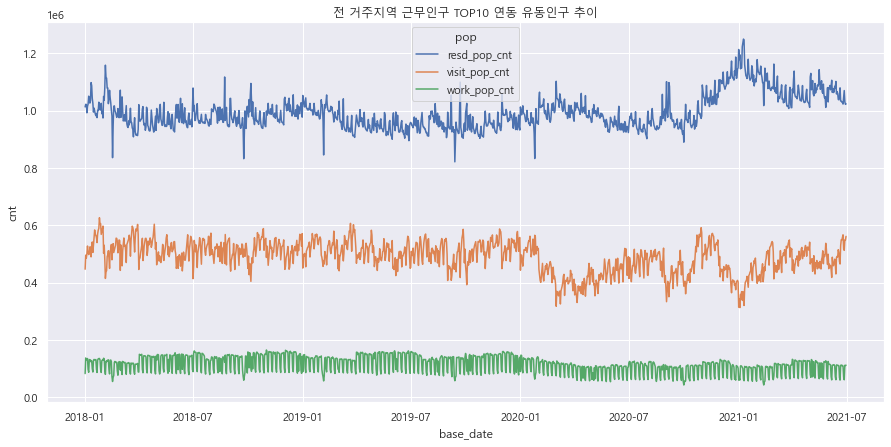

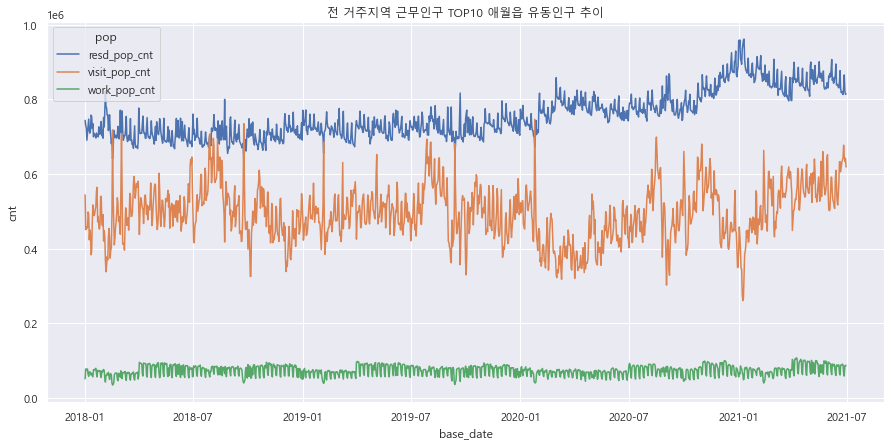

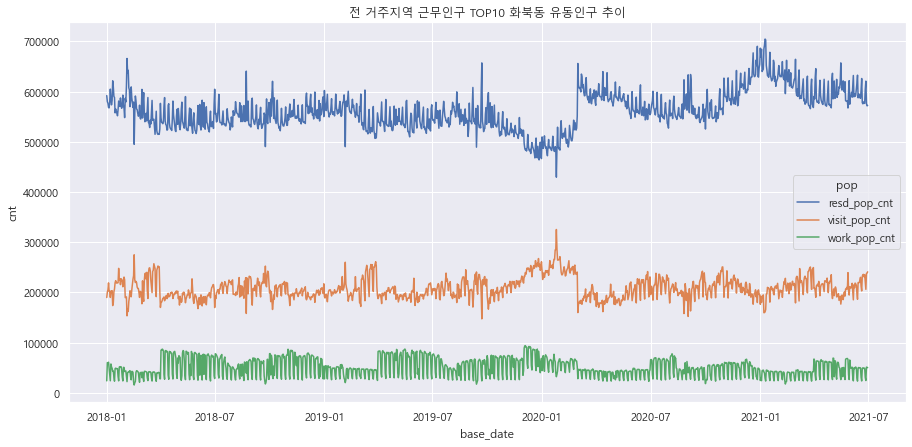

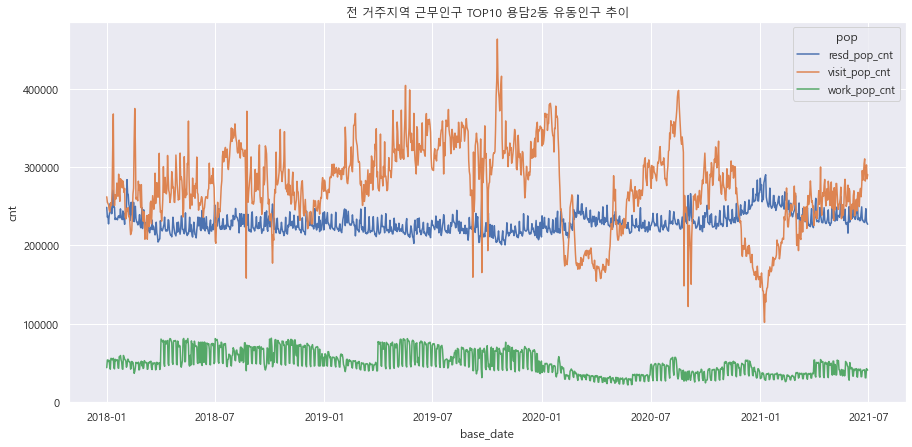

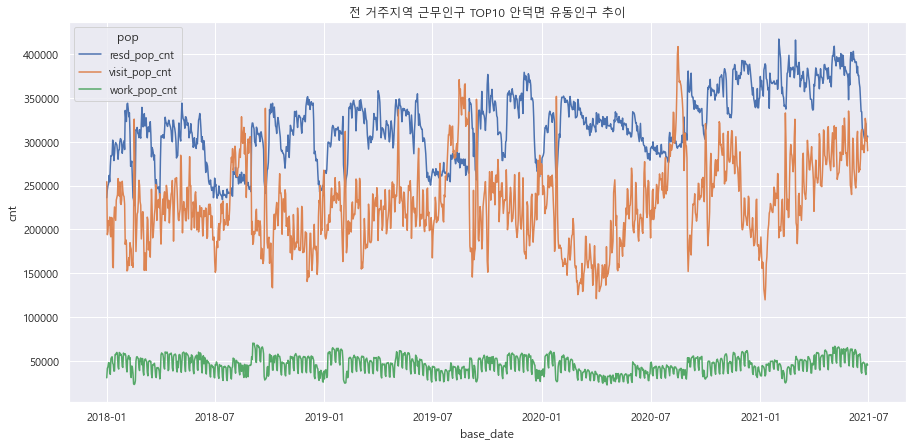

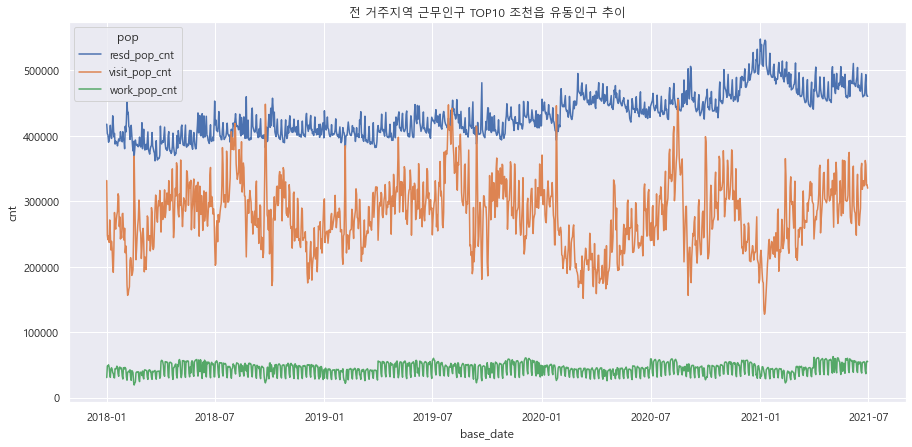

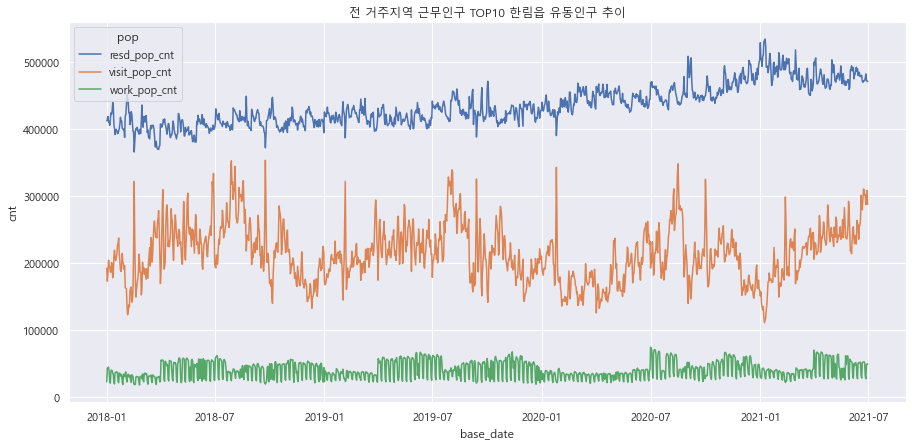

In [169]:
for nm in work_top10['emd_nm']:
    sns.lineplot(data=W[W['emd_nm'] == nm].groupby(['emd_nm','base_date','pop'])['cnt'].sum().reset_index(),x='base_date',y='cnt',hue='pop')
    plt.title('전 거주지역 근무인구 TOP10 {} 유동인구 추이'.format(nm))
    plt.show()

Resd TOP10

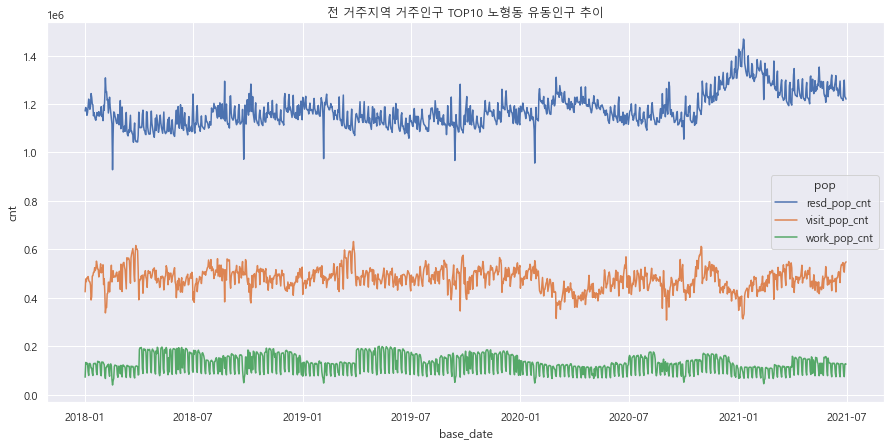

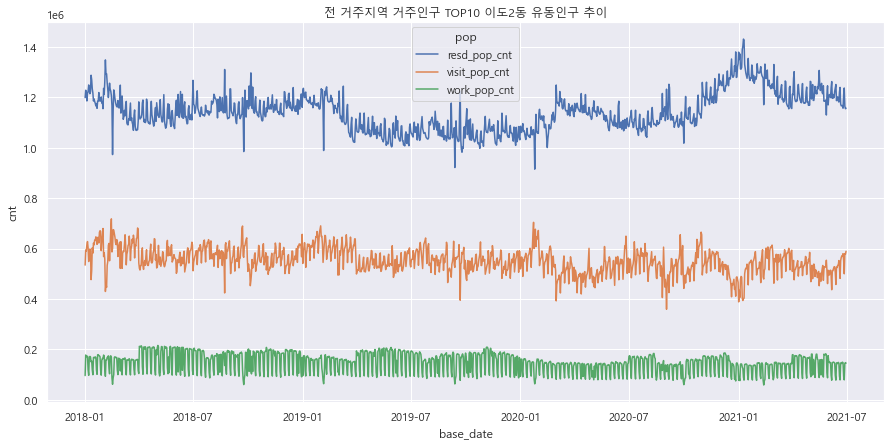

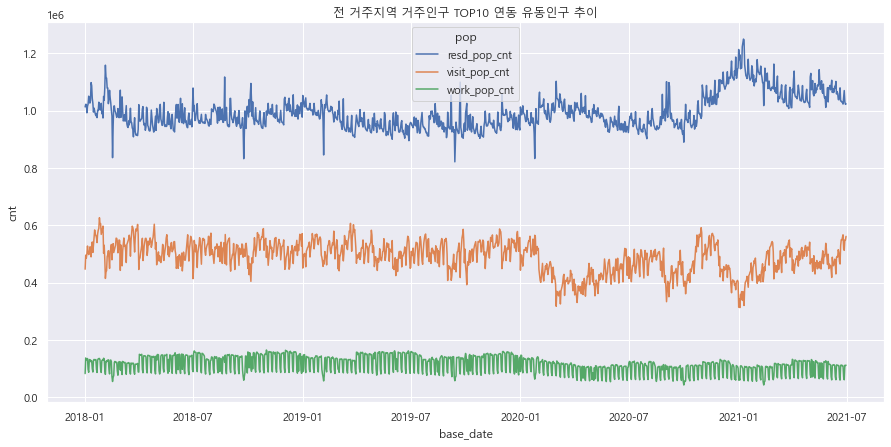

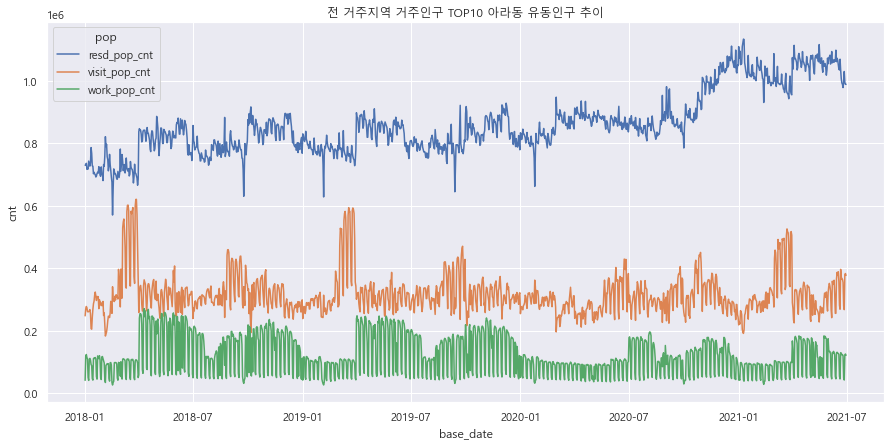

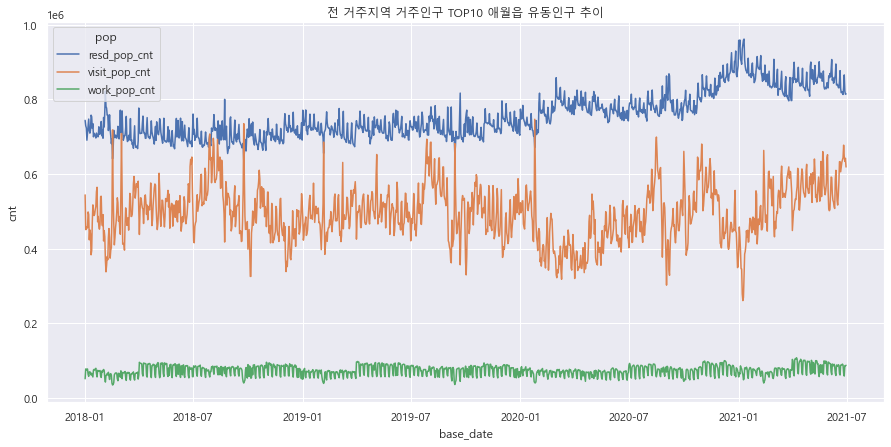

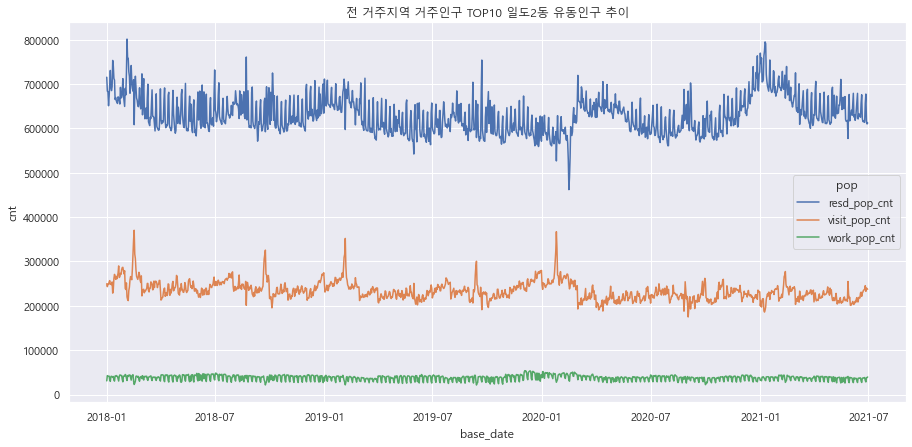

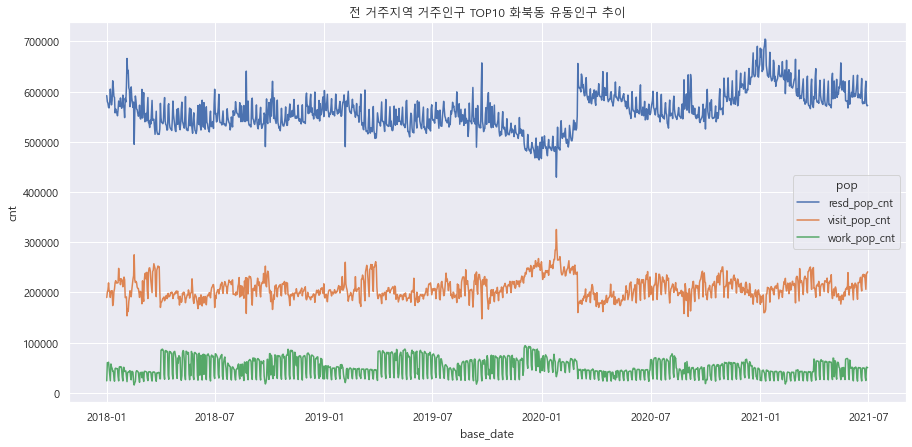

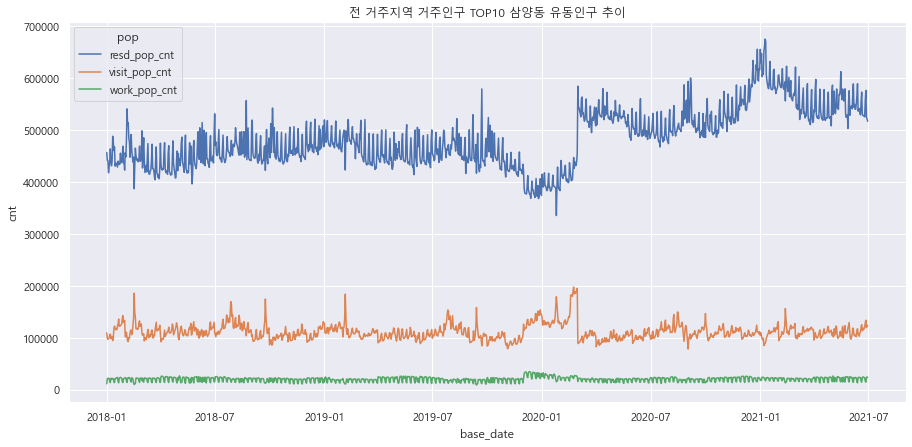

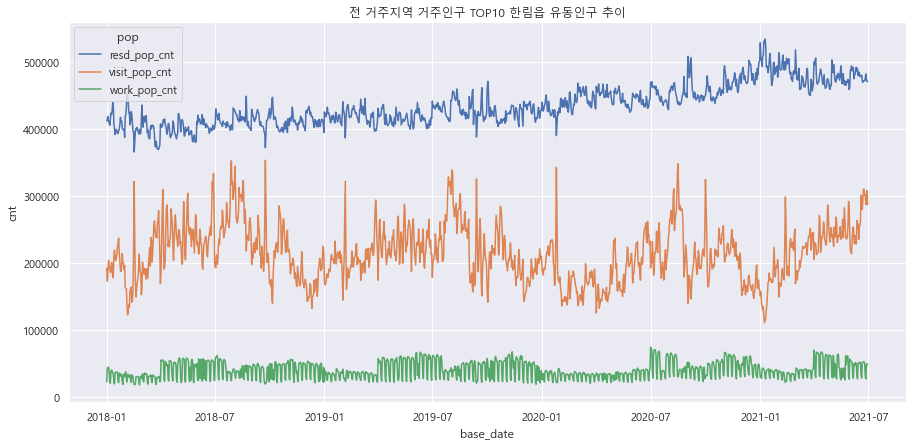

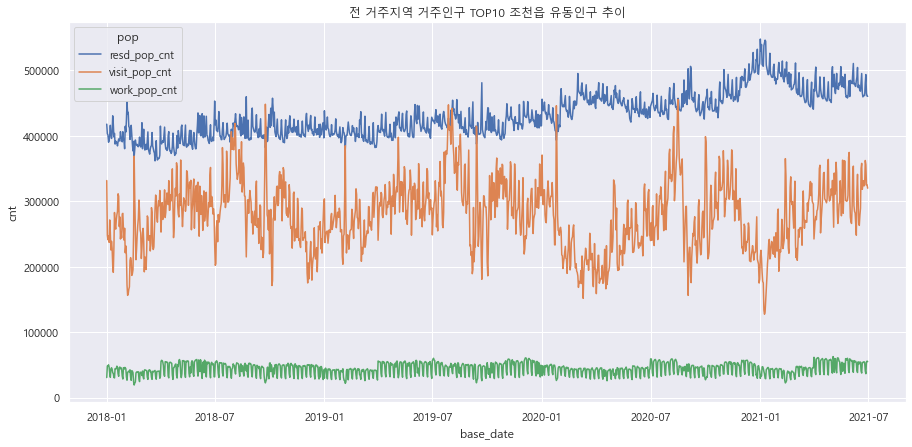

In [170]:
for nm in resd_top10['emd_nm']:
    sns.lineplot(data=R[R['emd_nm'] == nm].groupby(['emd_nm','base_date','pop'])['cnt'].sum().reset_index(),x='base_date',y='cnt',hue='pop')
    plt.title('전 거주지역 거주인구 TOP10 {} 유동인구 추이'.format(nm))
    plt.show()

### 시간 당 지역별 유동인구 TOP10(visit, work, resd) 추이 확인
- 거주지가 제주인 경우와 아닌 경우의 시간당 유동인구 패턴이 다른 행정동이 있음
- 유동인구 세 가지 유형별 top10 지역을 다 따로 보는 것보다, 행정동마다 거주 지역 여부에 따른 시간당 유동인구 패턴을 보아야 할 듯

In [171]:
v = local[local['emd_nm'].isin(visit_top10.emd_nm)].groupby(['emd_nm','resd','time'])['resd_pop_cnt', 'work_pop_cnt', 'visit_pop_cnt'].sum().stack().reset_index()
w = local[local['emd_nm'].isin(work_top10.emd_nm)].groupby(['emd_nm','resd','time'])['resd_pop_cnt', 'work_pop_cnt', 'visit_pop_cnt'].sum().stack().reset_index()
r = local[local['emd_nm'].isin(resd_top10.emd_nm)].groupby(['emd_nm','resd','time'])['resd_pop_cnt', 'work_pop_cnt', 'visit_pop_cnt'].sum().stack().reset_index()

v.columns = ['emd_nm','resd','time','pop','cnt']
w.columns = ['emd_nm','resd','time','pop','cnt']
r.columns = ['emd_nm','resd','time','pop','cnt']

Visit TOP10

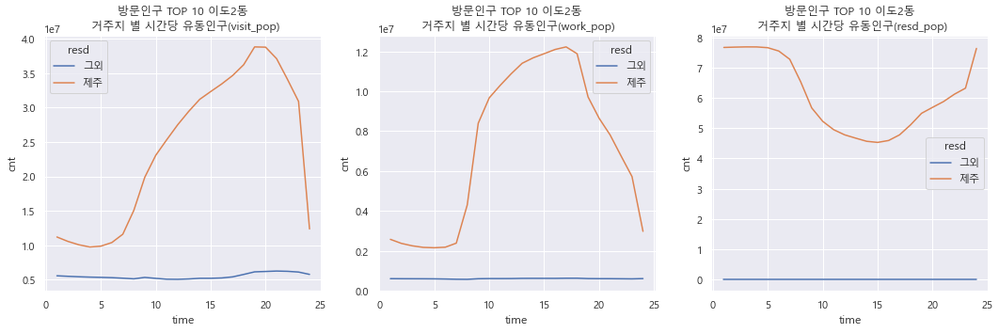

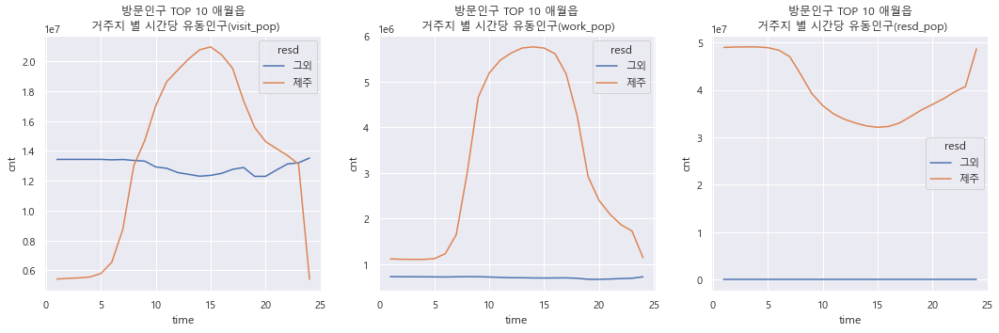

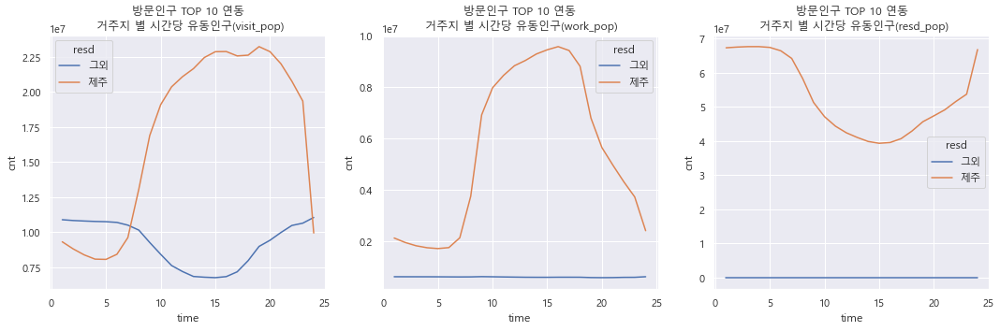

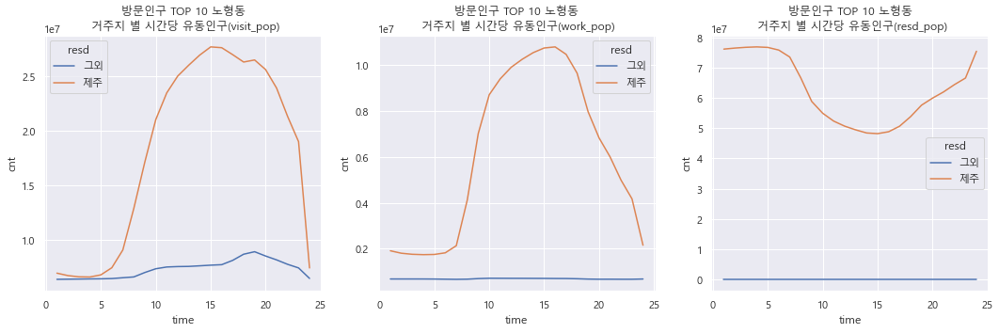

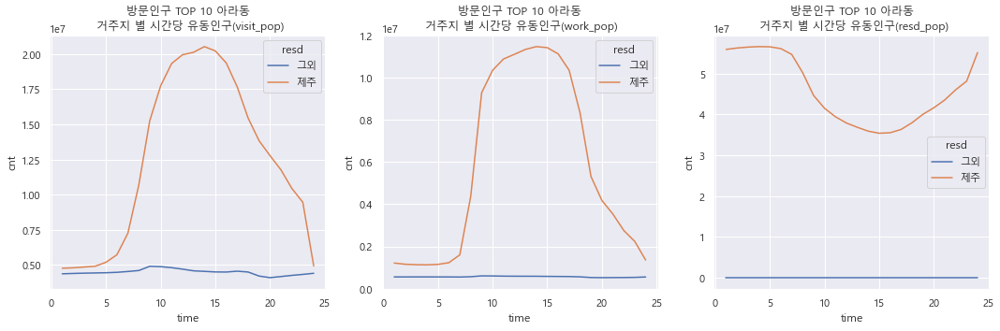

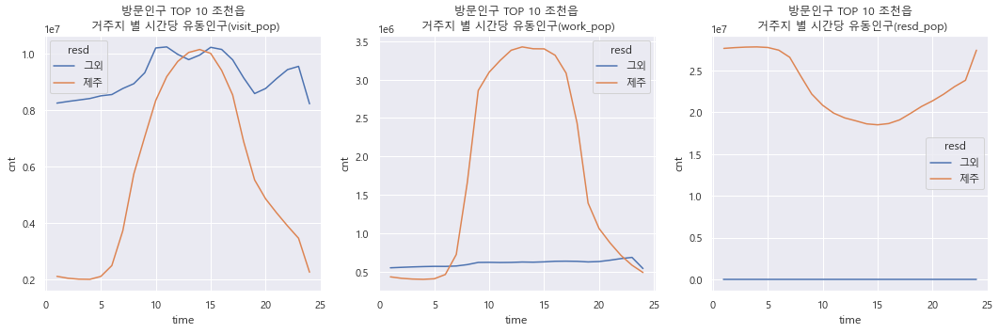

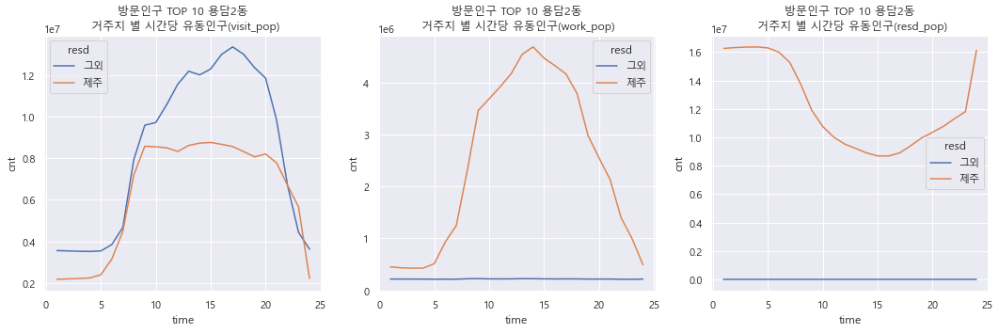

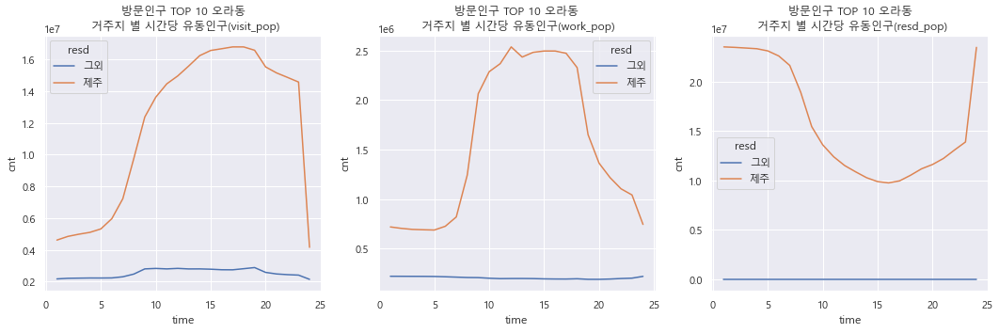

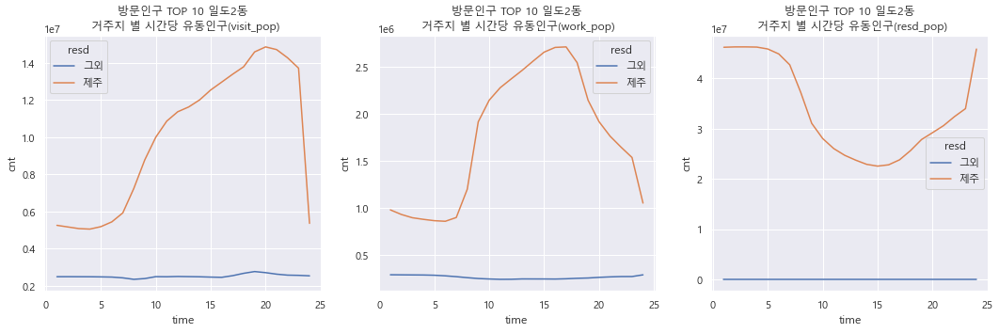

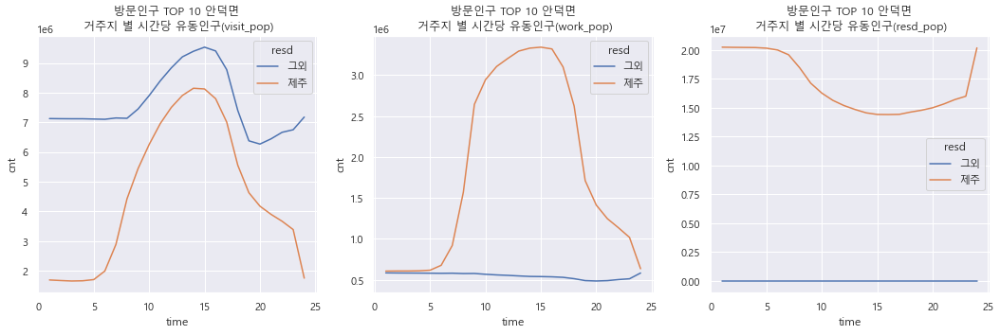

In [172]:
for nm in visit_top10['emd_nm']:
    figure, (ax1,ax2,ax3) = plt.subplots(ncols=3)
    figure.set_size_inches(18,5)
    sns.lineplot(data = v[(v['emd_nm'] == nm) & (v['pop'] == 'visit_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax1)
    sns.lineplot(data = v[(v['emd_nm'] == nm) & (v['pop'] == 'work_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax2)
    sns.lineplot(data = v[(v['emd_nm'] == nm) & (v['pop'] == 'resd_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax3)
    ax1.set(title="방문인구 TOP 10 {}\n 거주지 별 시간당 유동인구(visit_pop)".format(nm))
    ax2.set(title="방문인구 TOP 10 {}\n 거주지 별 시간당 유동인구(work_pop)".format(nm))
    ax3.set(title="방문인구 TOP 10 {}\n 거주지 별 시간당 유동인구(resd_pop)".format(nm))

Work TOP10

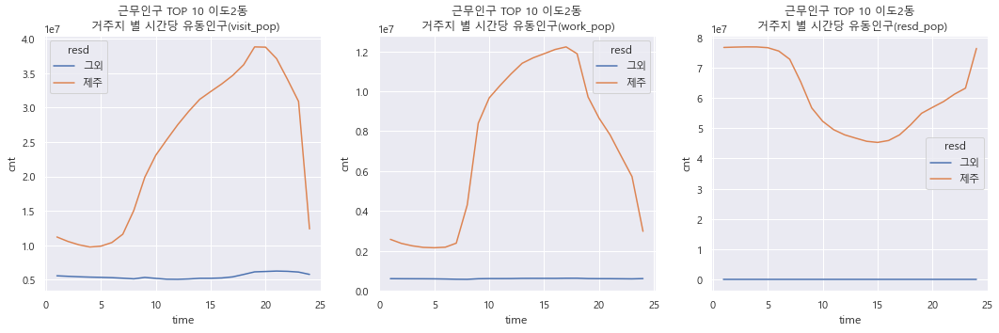

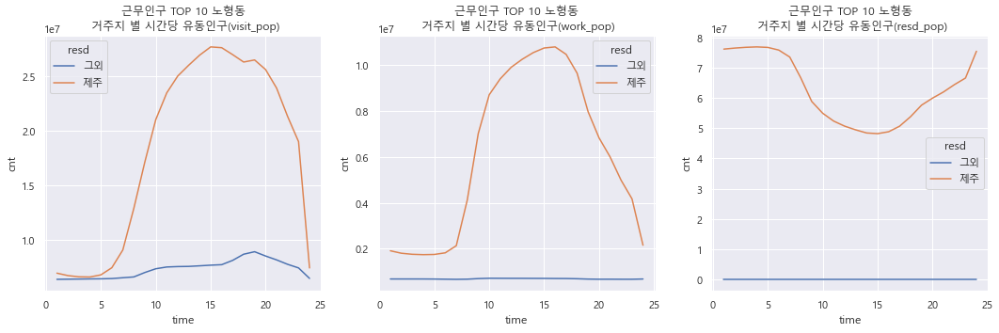

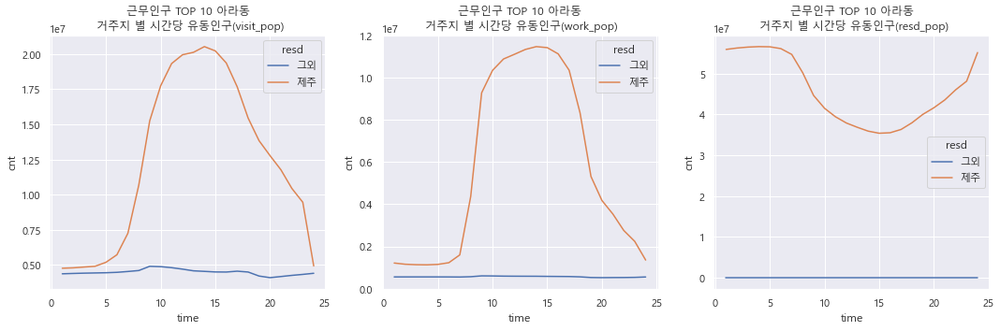

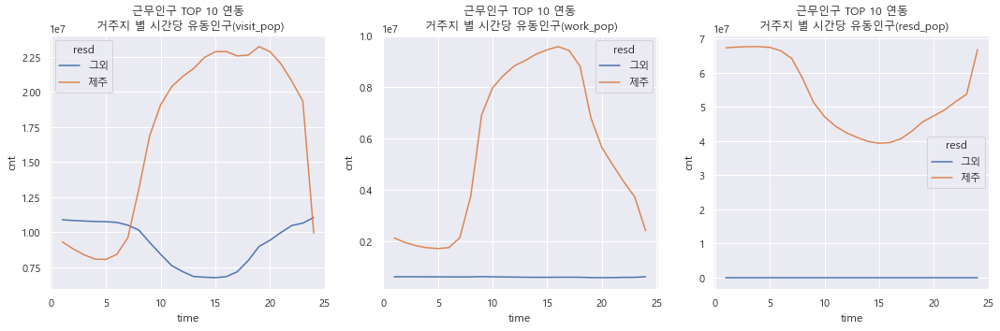

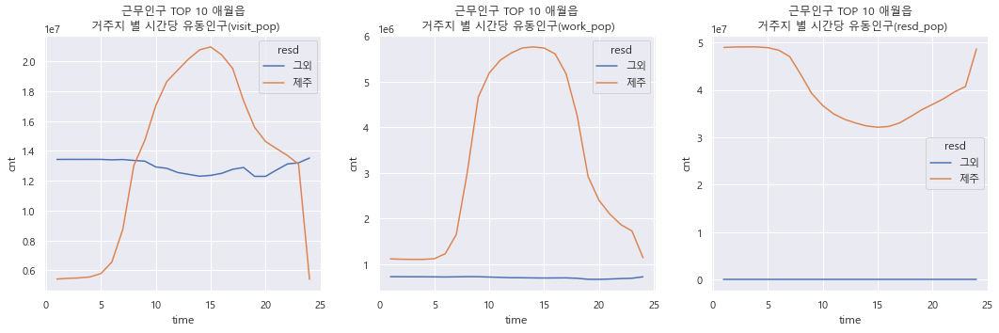

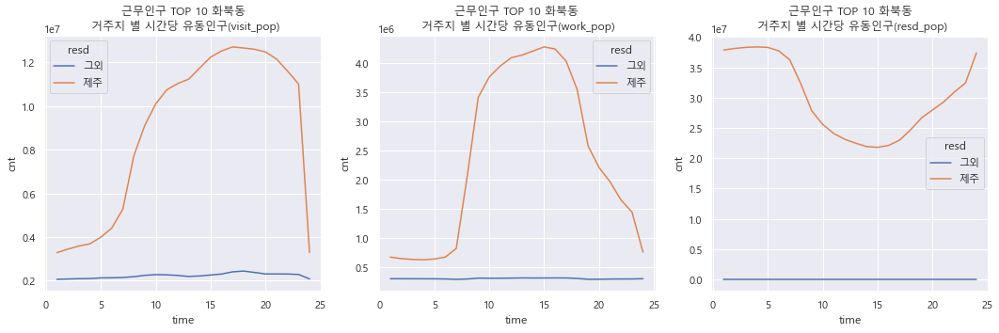

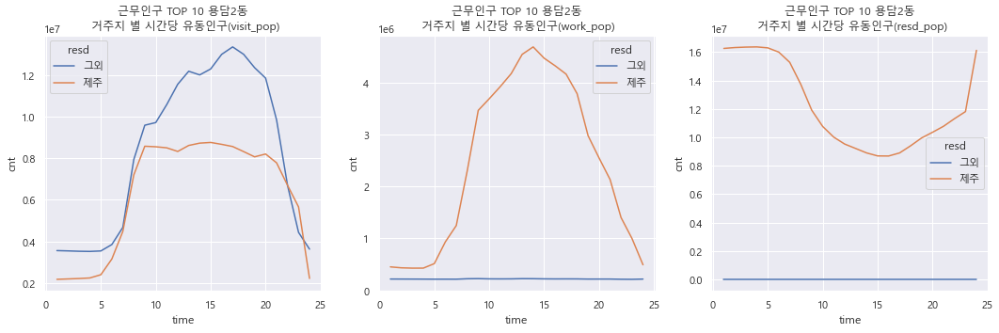

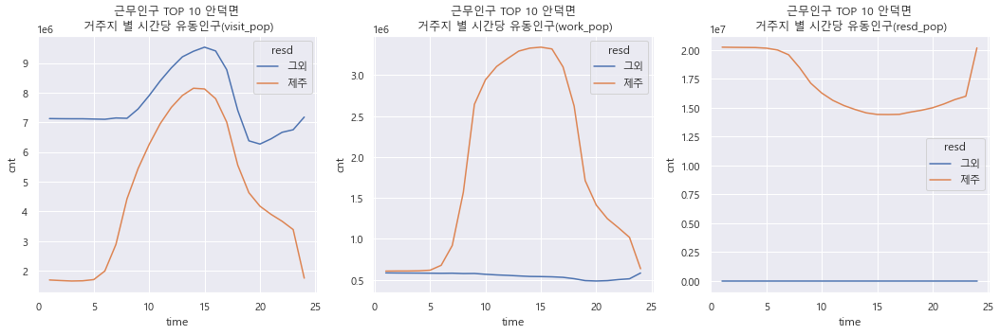

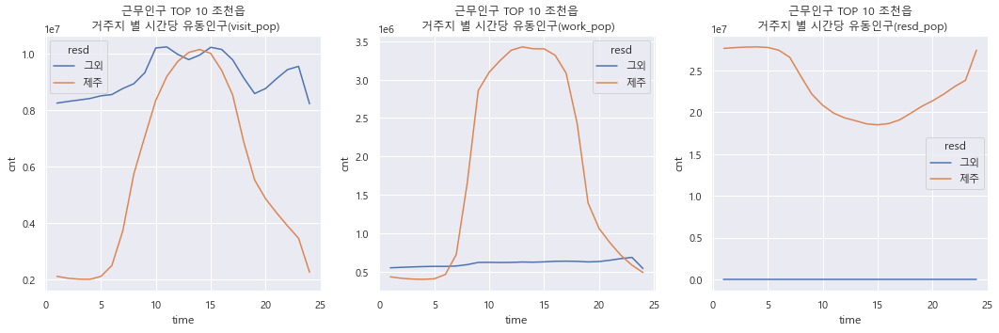

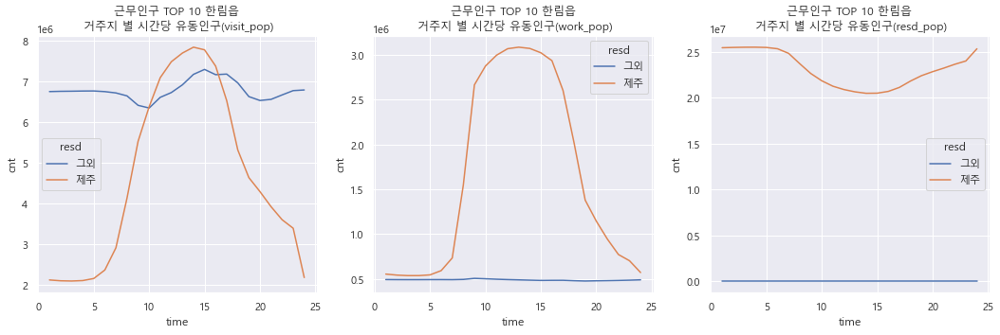

In [173]:
for nm in work_top10['emd_nm']:
    figure, (ax1,ax2,ax3) = plt.subplots(ncols=3)
    figure.set_size_inches(18,5)
    sns.lineplot(data = w[(w['emd_nm'] == nm) & (w['pop'] == 'visit_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax1)
    sns.lineplot(data = w[(w['emd_nm'] == nm) & (w['pop'] == 'work_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax2)
    sns.lineplot(data = w[(w['emd_nm'] == nm) & (w['pop'] == 'resd_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax3)
    ax1.set(title="근무인구 TOP 10 {}\n 거주지 별 시간당 유동인구(visit_pop)".format(nm))
    ax2.set(title="근무인구 TOP 10 {}\n 거주지 별 시간당 유동인구(work_pop)".format(nm))
    ax3.set(title="근무인구 TOP 10 {}\n 거주지 별 시간당 유동인구(resd_pop)".format(nm))

Resd TOP10

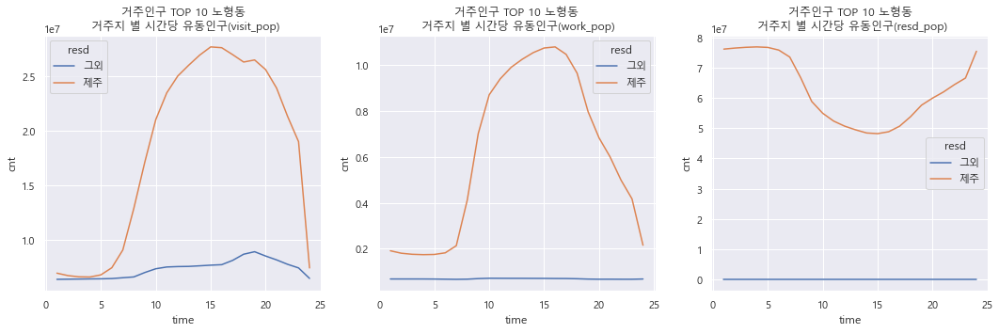

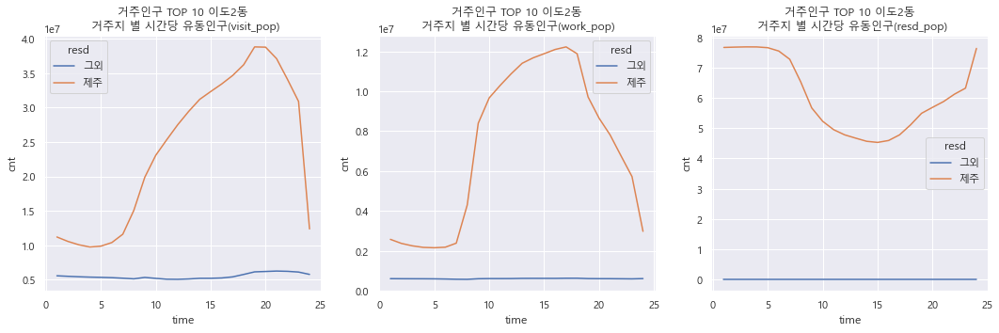

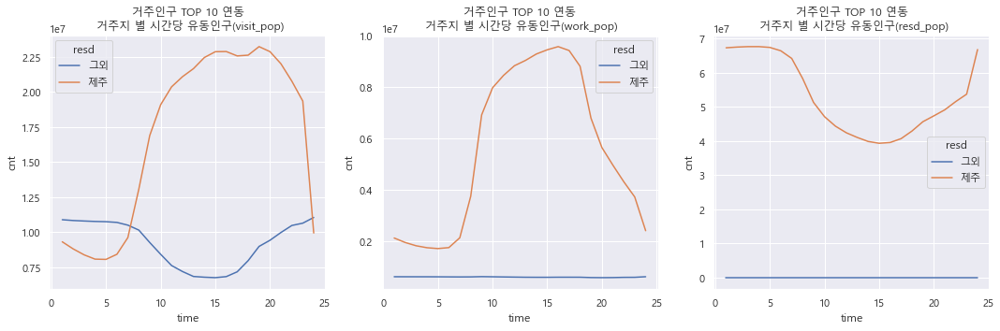

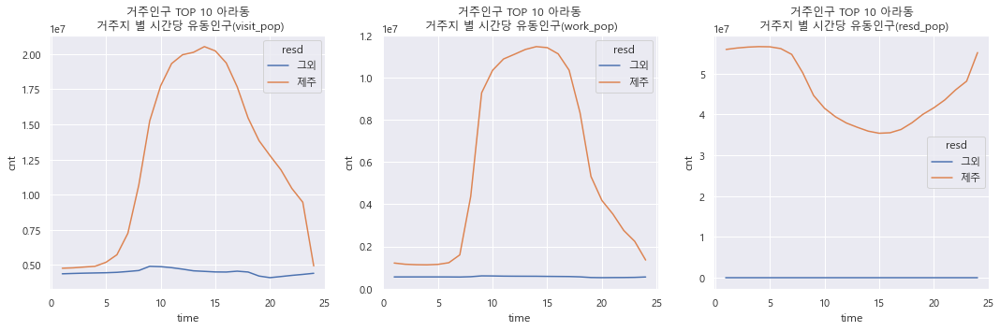

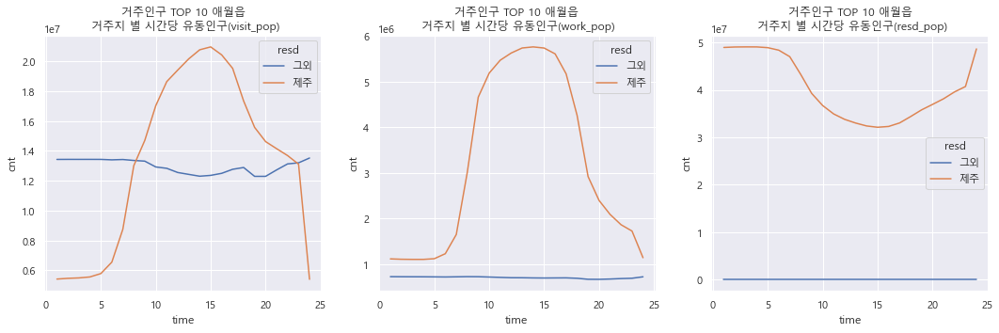

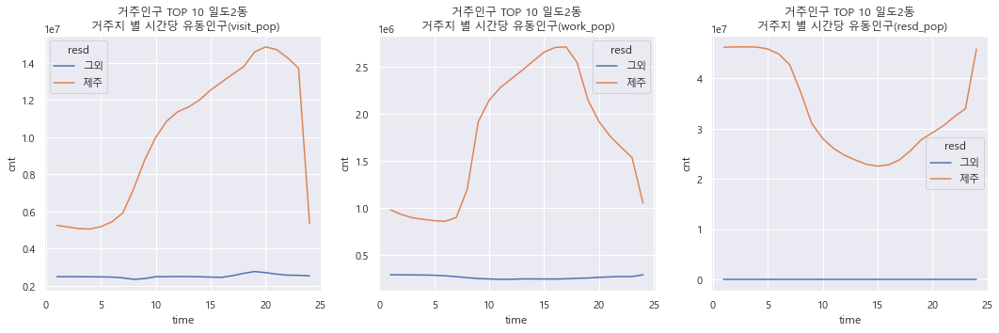

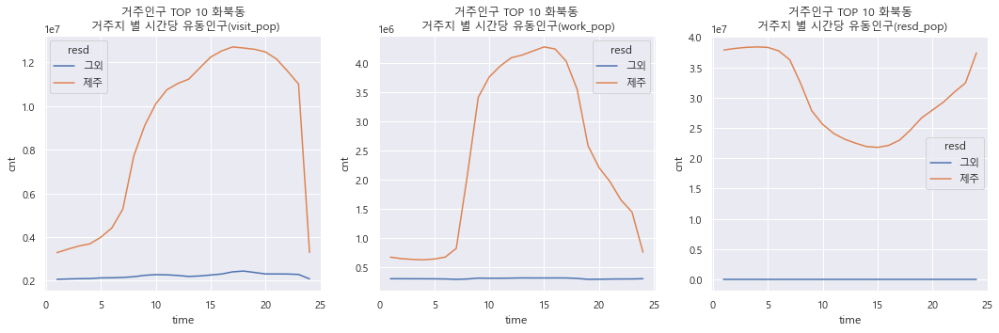

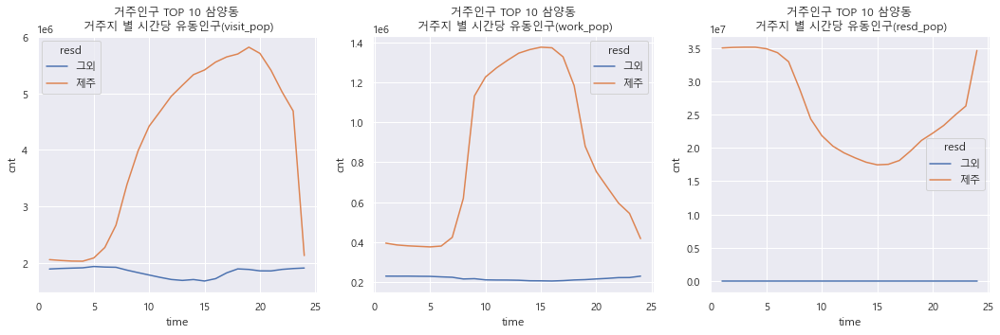

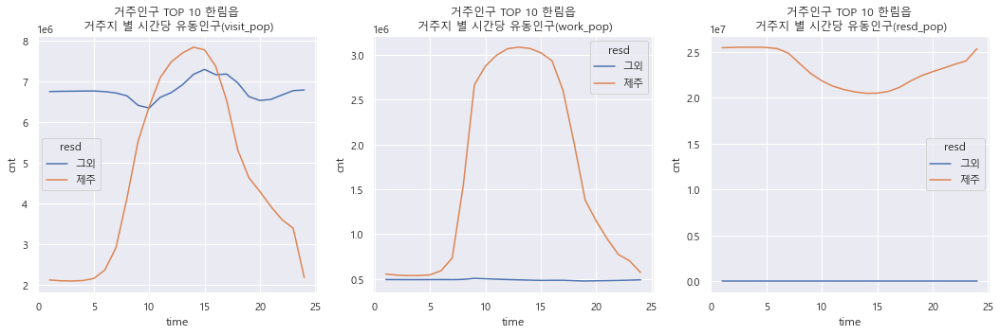

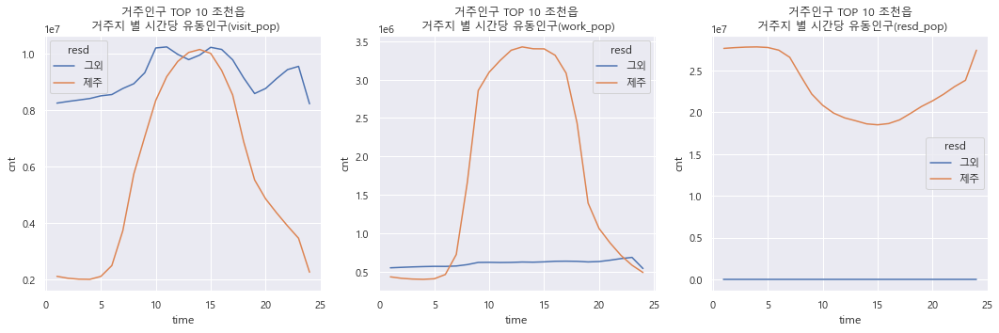

In [174]:
for nm in resd_top10['emd_nm']:
    figure, (ax1,ax2,ax3) = plt.subplots(ncols=3)
    figure.set_size_inches(18,5)
    sns.lineplot(data = r[(r['emd_nm'] == nm) & (r['pop'] == 'visit_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax1)
    sns.lineplot(data = r[(r['emd_nm'] == nm) & (r['pop'] == 'work_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax2)
    sns.lineplot(data = r[(r['emd_nm'] == nm) & (r['pop'] == 'resd_pop_cnt')].reset_index(drop=True),x = 'time',y='cnt',hue='resd',ax = ax3)
    ax1.set(title="거주인구 TOP 10 {}\n 거주지 별 시간당 유동인구(visit_pop)".format(nm))
    ax2.set(title="거주인구 TOP 10 {}\n 거주지 별 시간당 유동인구(work_pop)".format(nm))
    ax3.set(title="거주인구 TOP 10 {}\n 거주지 별 시간당 유동인구(resd_pop)".format(nm))